In [1]:
import pandas as pd

DATASETS_FILE_NAMES = {
    "Carotte": {
        "x": "combined_daily_meteo.csv",
        "y": "carrot_no_sensitive_data.csv",
        "d": "field_distance.txt"
    },
    "Laitue": {
        "x": "combined_daily_meteo.csv",
        "y": "lettuce_no_sensitive_data.csv",
        "d": "field_distance.txt"
    },
    "Oignon": {
        "x": "combined_daily_meteo.csv",
        "y": "onion_no_sensitive_data.csv",
        "d": "field_distance.txt"
    }
}

DATASETS = {}
for name in DATASETS_FILE_NAMES:
    DATASETS[name] = {}
    for k, v in DATASETS_FILE_NAMES[name].items():
        if k == "d":
            DATASETS[name][k] = pd.read_csv(f"data/{name}/{v}", header=None)
        else:
            DATASETS[name][k] = pd.read_csv(f"data/{name}/{v}")

# Classification

In [2]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import roc_auc_score, f1_score, accuracy_score, make_scorer, precision_score
import numpy as np


DATASETS = {}
for name in DATASETS_FILE_NAMES:
    DATASETS[name] = {}
    for k, v in DATASETS_FILE_NAMES[name].items():
        if k == "d":
            DATASETS[name][k] = pd.read_csv(f"data/{name}/{v}", header=None)
        else:
            DATASETS[name][k] = pd.read_csv(f"data/{name}/{v}")


def normalize(sub_df):
    min_max_scaler = preprocessing.MinMaxScaler()
    sub_df_scaled = min_max_scaler.fit_transform(sub_df)
    return(pd.DataFrame(sub_df_scaled, index=sub_df.index, columns=sub_df.columns))


def preprocess_data_classification(crop, obs_df, meteo_df):
    obs_df.rename(columns={'SampleDate': 'Date'}, inplace=True)

    # Colonnes météo communes
    meteo_columns = [
        'Quot_more_30_Temp_C',
        'Rolling_Quot_more_30_Temp_C_3D',
        'Night_between_70_95_RH',
        'Night_more_0_Rain',
        'Quot_sum_Rain'
    ]

    # Colonnes spécifiques par culture
    crop_columns = {
        'Oignon': ['LivingLeavesNum_onions', 'DeadLeavesNum_onions', 'FeuillageCouche_onions'],
        'Carotte': ['GreenLeavesNum_carrots', 'carrot_stage'],
        'Laitue': []
    }

    if crop == 'Oignon':
        obs_df.loc[obs_df['cote_b_squamosa'] >= 1, 'cote_b_squamosa'] = 1
        combined_df = obs_df.merge(meteo_df, on=['FarmID', 'Date'])
        label_col = 'cote_b_squamosa'
        drop_cols = ['cote_p_destructor', 'cote_s_vesicarium', 'Bulb_onions_date']

    elif crop == 'Laitue':
        obs_df.loc[obs_df['cote_b_lactucae'] >= 1, 'cote_b_lactucae'] = 1
        combined_df = obs_df.merge(meteo_df, on=['FarmID', 'Date'])
        label_col = 'cote_b_lactucae'
        drop_cols = ['incidence_sclerotinia', 'incidence_b_cinerea', 'Pommaison_lettuce_date']

    elif crop == 'Carotte':
        obs_df = obs_df.drop(obs_df[obs_df['FarmID'] == 0].index)
        obs_df.loc[obs_df['cote_c_carotae'] >= 1, 'cote_c_carotae'] = 1
        combined_df = obs_df.merge(meteo_df, on=['FarmID', 'Date'])
        label_col = 'cote_c_carotae'
        drop_cols = ['incidence_s_sclerotiorum', 'incidence_a_dauci']

    else:
        raise ValueError("Culture non reconnue")

    # On garde uniquement les colonnes pertinentes
    selected_columns = crop_columns[crop] + meteo_columns
    final_df = combined_df[selected_columns].copy()
    labels = combined_df[label_col].copy()

    return final_df, labels


In [3]:
x, y = preprocess_data_classification("Carotte", DATASETS["Carotte"]["y"], DATASETS["Carotte"]["x"])
normalize(x)

,GreenLeavesNum_carrots,carrot_stage,Quot_more_30_Temp_C,Rolling_Quot_more_30_Temp_C_3D,Night_between_70_95_RH,Night_more_0_Rain,Quot_sum_Rain
0,0.50,0.0,0.0,0.0,0.000000,1.0,0.782609
1,0.50,0.0,0.0,0.0,0.000000,1.0,0.782609
2,0.50,0.0,0.0,0.0,0.000000,1.0,0.782609
3,0.50,0.0,0.0,0.0,0.000000,1.0,0.782609
4,0.50,0.0,0.0,0.0,0.000000,1.0,0.782609
...,...,...,...,...,...,...,...
394,0.75,1.0,0.0,0.0,0.222222,0.0,0.000000
395,0.75,1.0,0.0,0.0,0.222222,0.0,0.000000
396,0.75,1.0,0.0,0.0,0.222222,0.0,0.000000
397,0.75,1.0,0.0,0.0,0.222222,0.0,0.000000


In [4]:
x, y = preprocess_data_classification("Oignon", DATASETS["Oignon"]["y"], DATASETS["Oignon"]["x"])
normalize(x)

,LivingLeavesNum_onions,DeadLeavesNum_onions,FeuillageCouche_onions,Quot_more_30_Temp_C,Rolling_Quot_more_30_Temp_C_3D,Night_between_70_95_RH,Night_more_0_Rain,Quot_sum_Rain
0,0.166667,0.0,0.0,0.0,0.0,0.363636,0.6,0.124088
1,0.166667,0.0,0.0,0.0,0.0,0.363636,0.6,0.124088
2,0.166667,0.0,0.0,0.0,0.0,0.363636,0.6,0.124088
3,0.166667,0.0,0.0,0.0,0.0,0.363636,0.6,0.124088
4,0.166667,0.0,0.0,0.0,0.0,0.363636,0.6,0.124088
...,...,...,...,...,...,...,...,...
917,0.333333,0.5,1.0,0.0,0.0,0.090909,0.0,0.116788
918,0.333333,0.5,1.0,0.0,0.0,0.090909,0.0,0.116788
919,0.333333,0.5,1.0,0.0,0.0,0.090909,0.0,0.116788
920,0.333333,0.5,1.0,0.0,0.0,0.090909,0.0,0.116788


In [5]:
x, y = preprocess_data_classification("Laitue", DATASETS["Laitue"]["y"], DATASETS["Laitue"]["x"])
normalize(x)

,Quot_more_30_Temp_C,Rolling_Quot_more_30_Temp_C_3D,Night_between_70_95_RH,Night_more_0_Rain,Quot_sum_Rain
0,0.0,0.0,0.000000,0.0,0.0
1,0.0,0.0,0.000000,0.0,0.0
2,0.0,0.0,0.000000,0.0,0.0
3,0.0,0.0,0.000000,0.0,0.0
4,0.0,0.0,0.000000,0.0,0.0
...,...,...,...,...,...
535,0.0,0.0,0.363636,0.0,0.0
536,0.0,0.0,0.363636,0.0,0.0
537,0.0,0.0,0.363636,0.0,0.0
538,0.0,0.0,0.363636,0.0,0.0


# Machine learning

In [8]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler


def DecisionTreeModel(x, y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True)
    clf = DecisionTreeClassifier()
    param_dist = {
        'criterion': ['gini'],
        'max_depth': [1, 2, 3, 4, 5],
        'min_samples_split': [5, 10, 20],
        'splitter': ['best']
    }
    scoring = {
        'accuracy': make_scorer(accuracy_score),
        'roc_auc': make_scorer(roc_auc_score),
        'f1': make_scorer(f1_score)
    }
    grid = GridSearchCV(clf, param_grid=param_dist, n_jobs=-1, cv=5, scoring=scoring, refit='accuracy')
    grid.fit(x_train, y_train)
    clf = grid.best_estimator_
    y_pred = clf.predict(x_test)
    f1 = f1_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    return accuracy, precision, f1


def kNNModel(x, y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True)
    clf = KNeighborsClassifier()
    param_dist = {
        'n_neighbors': [1, 3, 5, 7],
        'weights': ['uniform'],
        'metric' : ['euclidean'],
        'leaf_size' : [int(x) for x in np.linspace(start=1, stop= 50, num= 10)]
    }
    scoring = {
        'accuracy': make_scorer(accuracy_score),
        'roc_auc': make_scorer(roc_auc_score),
        'f1': make_scorer(f1_score)
    }
    grid = GridSearchCV(clf, param_grid=param_dist, n_jobs=-1, cv=5, scoring=scoring, refit='accuracy')
    grid.fit(x_train, y_train)
    clf = grid.best_estimator_
    y_pred = clf.predict(x_test)
    f1 = f1_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    return accuracy, precision, f1


def RandomForestModel(x, y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True)
    clf = RandomForestClassifier()
    param_dist = {
        'n_estimators': [10, 20, 30, 40, 50],
        'criterion': ['gini'],
        'max_features' : ['log2', 'sqrt'],
        'max_depth' : [1,2,3,4,5],
        'min_samples_split' : [2, 5],
        'min_samples_leaf' : [ 2, 5],
        'bootstrap': [True, False]
    }
    scoring = {
        'accuracy': make_scorer(accuracy_score),
        'roc_auc': make_scorer(roc_auc_score),
        'f1': make_scorer(f1_score)
    }
    grid = GridSearchCV(clf, param_grid=param_dist, n_jobs=-1, cv=5, scoring=scoring, refit='accuracy')
    grid.fit(x_train, y_train)
    clf = grid.best_estimator_
    y_pred = clf.predict(x_test)
    f1 = f1_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    return accuracy, precision, f1

In [9]:
N_RUNS = 5  # nombre d'exécutions
models = (
    ("DT", DecisionTreeModel),
    ("k-NN", kNNModel),
    ("RF", RandomForestModel),
)

for crop in DATASETS:
    print(f"\n🌾 Culture : {crop}")
    x, y = preprocess_data_classification(crop, DATASETS[crop]["y"], DATASETS[crop]["x"])

    # Standardisation
    scaler = StandardScaler()
    x_scaled = scaler.fit_transform(x)

    # Normalisation de y
    y = y.values if hasattr(y, 'values') else y
    y = y / max(y)

    # Dictionnaire pour stocker les résultats par modèle
    acc_scores = {name: [] for name, _ in models}
    prec_scores = {name: [] for name, _ in models}
    f_scores = {name: [] for name, _ in models}

    for run in range(N_RUNS):
        print(f"   ▶️ Run {run + 1}/{N_RUNS}")
        for name, model in models:
             a, p, f = model(x, y)
             acc_scores[name].append(a)
             prec_scores[name].append(p)
             f_scores[name].append(f)
           
             
             print(f"    {name}: accuracy= {a:.4}, precision={p:.4}, f1={f:.4}")
    # Moyennes finales
    print(f"\n📊 Moyennes des {N_RUNS} runs pour {crop} :")
    for name in acc_scores:
        acc_mean = np.mean(acc_scores[name])
        prec_mean = np.mean(prec_scores[name])
        f1_mean = np.mean(f_scores[name])
        print(f"    ▶️ {name} : Accuracy = {acc_mean:.4f}, Precision = {prec_mean:.4f}, F1-score = {f1_mean:.4f}")


🌾 Culture : Carotte
   ▶️ Run 1/5
    DT: accuracy= 0.7625, precision=0.7143, f1=0.7595
    k-NN: accuracy= 0.725, precision=0.7059, f1=0.6857
    RF: accuracy= 0.8, precision=0.6829, f1=0.7778
   ▶️ Run 2/5
    DT: accuracy= 0.8, precision=0.7727, f1=0.8095
    k-NN: accuracy= 0.725, precision=0.5789, f1=0.6667
    RF: accuracy= 0.675, precision=0.6154, f1=0.7111
   ▶️ Run 3/5
    DT: accuracy= 0.725, precision=0.6744, f1=0.725
    k-NN: accuracy= 0.7875, precision=0.7692, f1=0.7792
    RF: accuracy= 0.7, precision=0.6667, f1=0.7
   ▶️ Run 4/5
    DT: accuracy= 0.7125, precision=0.7619, f1=0.7356
    k-NN: accuracy= 0.675, precision=0.6, f1=0.6486
    RF: accuracy= 0.6375, precision=0.6364, f1=0.5915
   ▶️ Run 5/5
    DT: accuracy= 0.7375, precision=0.7273, f1=0.7529
    k-NN: accuracy= 0.6625, precision=0.625, f1=0.6494
    RF: accuracy= 0.6125, precision=0.4717, f1=0.6173

📊 Moyennes des 5 runs pour Carotte :
    ▶️ DT : Accuracy = 0.7475, Precision = 0.7301, F1-score = 0.7565
    

# Neural network


🌾 Culture : Carotte
   ▶️ Run 1/10
Epoch 17: early stopping
Restoring model weights from the end of the best epoch: 7.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


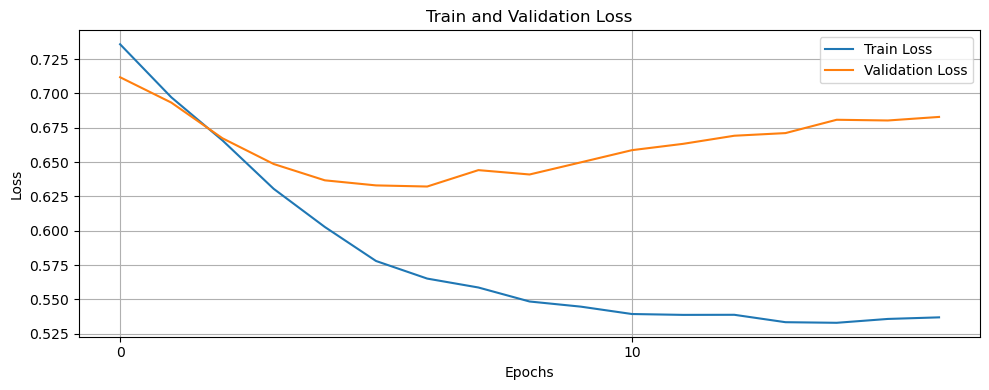

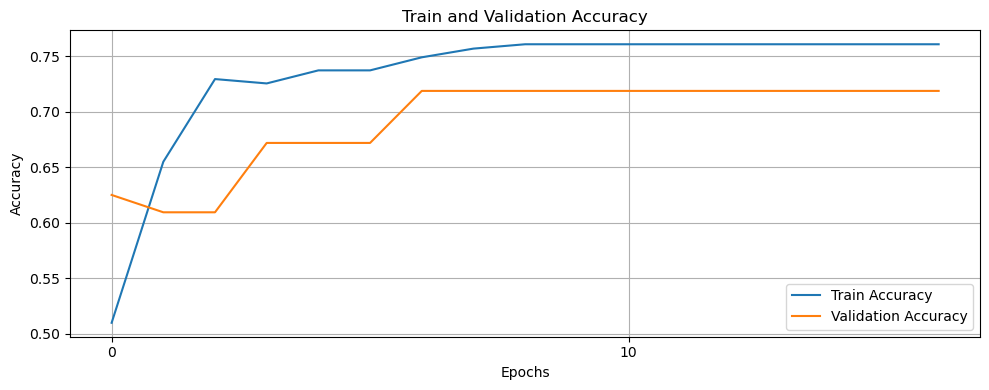

    NN: accuracy = 0.7375, precision = 0.6545, f1 = 0.7742
   ▶️ Run 2/10
Epoch 37: early stopping
Restoring model weights from the end of the best epoch: 27.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


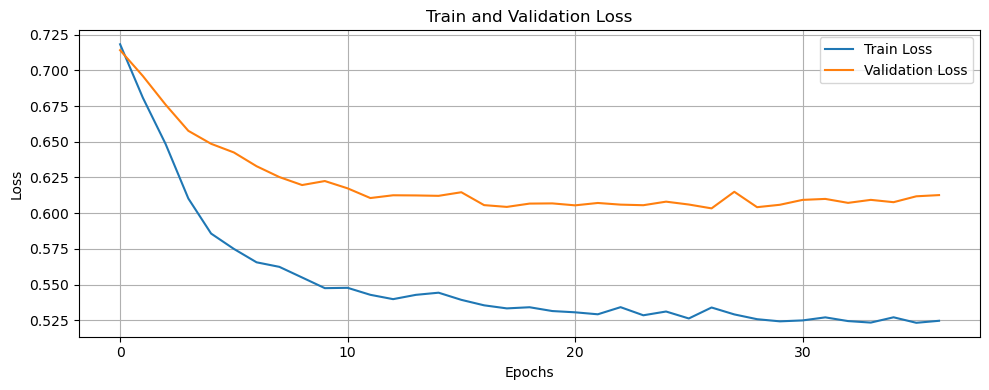

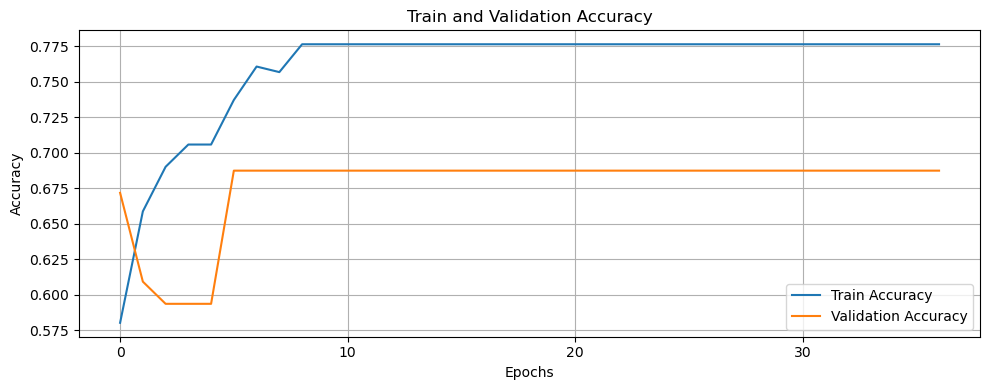

    NN: accuracy = 0.7125, precision = 0.6458, f1 = 0.7294
   ▶️ Run 3/10
Epoch 19: early stopping
Restoring model weights from the end of the best epoch: 9.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


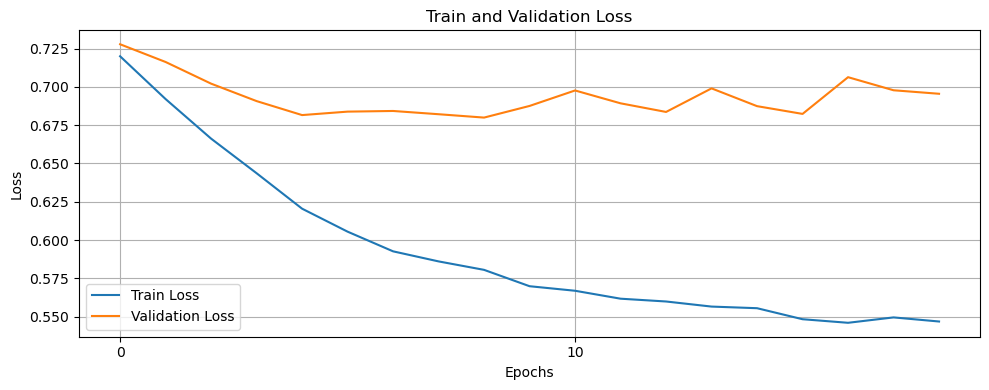

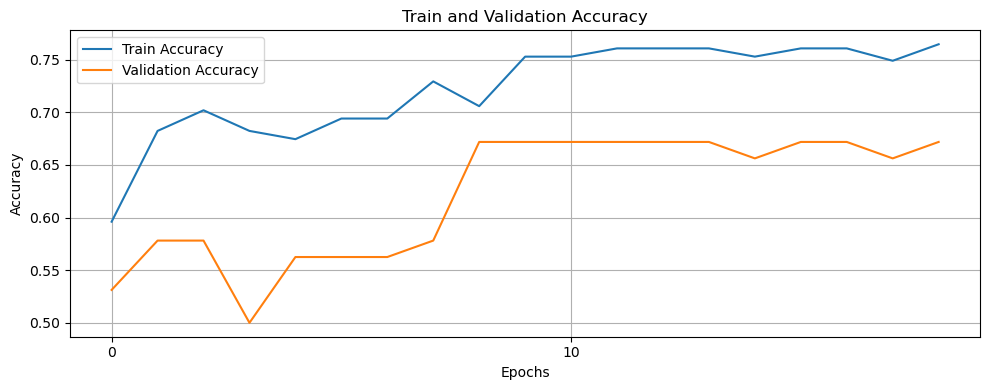

    NN: accuracy = 0.7750, precision = 0.7381, f1 = 0.7750
   ▶️ Run 4/10
Epoch 18: early stopping
Restoring model weights from the end of the best epoch: 8.
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 399ms/step


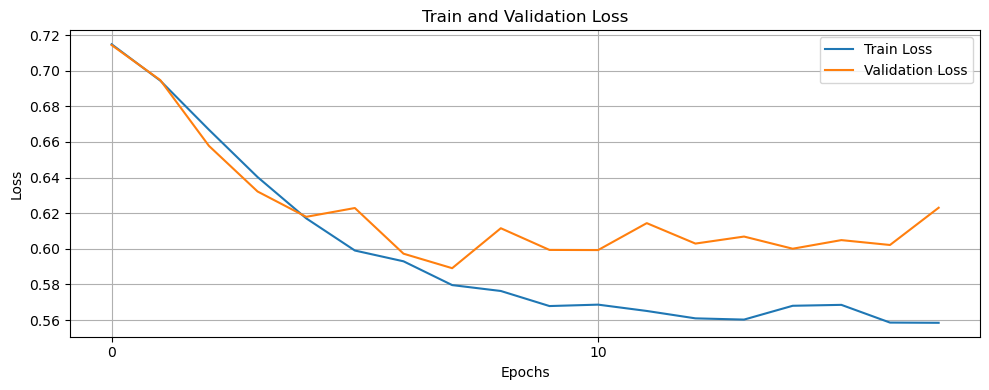

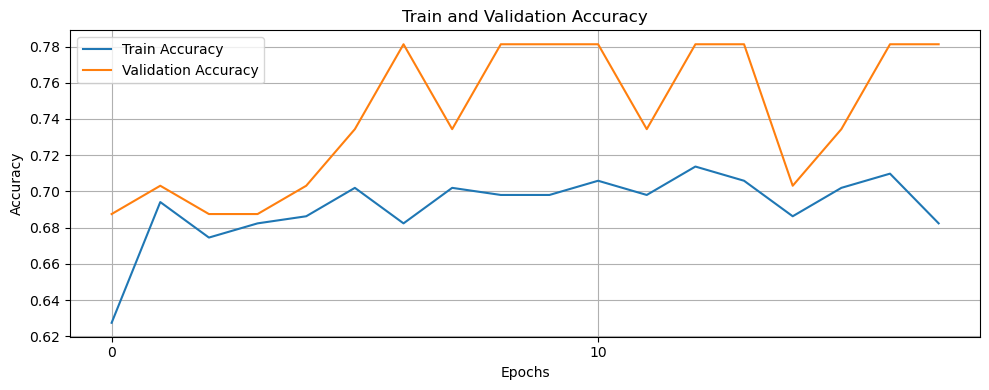

    NN: accuracy = 0.6625, precision = 0.6452, f1 = 0.5970
   ▶️ Run 5/10
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 18.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


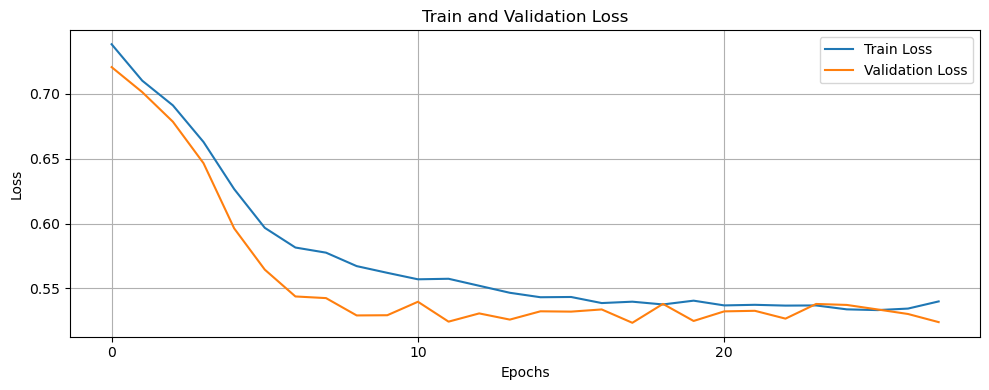

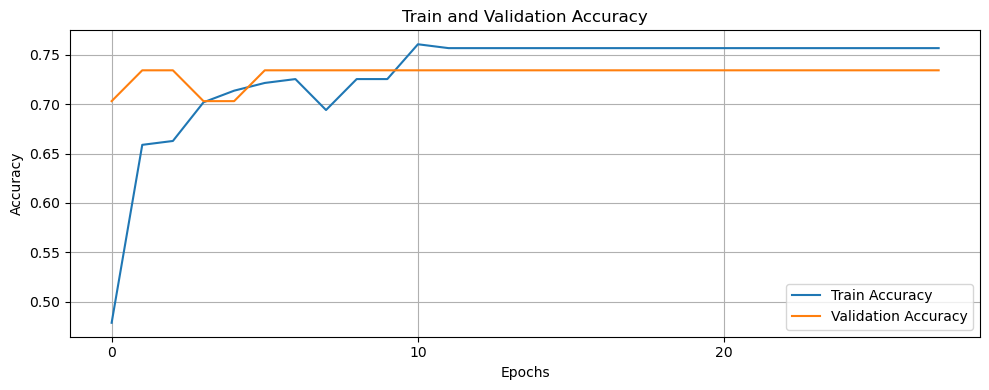

    NN: accuracy = 0.7375, precision = 0.6279, f1 = 0.7200
   ▶️ Run 6/10
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 18.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


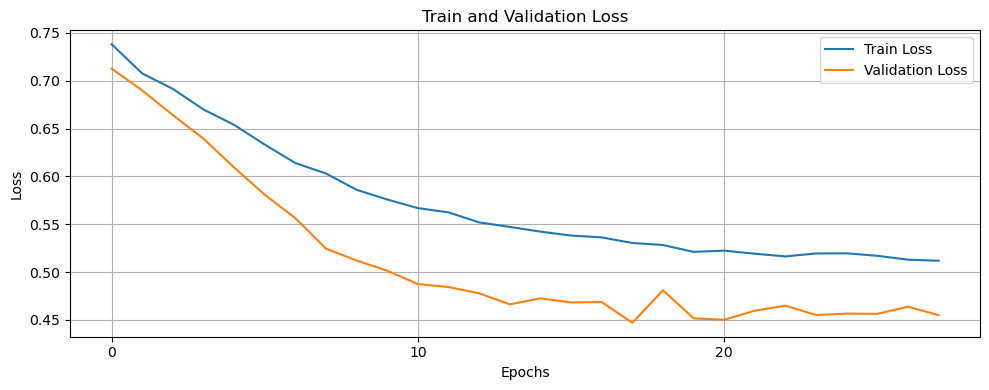

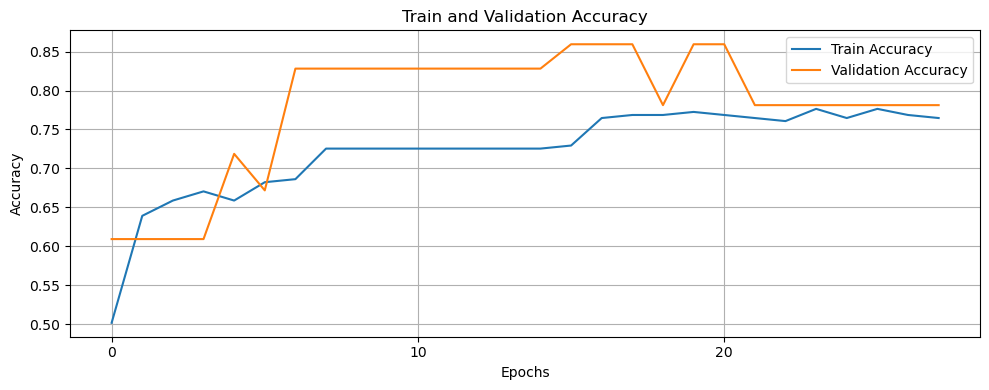

    NN: accuracy = 0.6000, precision = 0.5818, f1 = 0.6667
   ▶️ Run 7/10
Epoch 36: early stopping
Restoring model weights from the end of the best epoch: 26.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


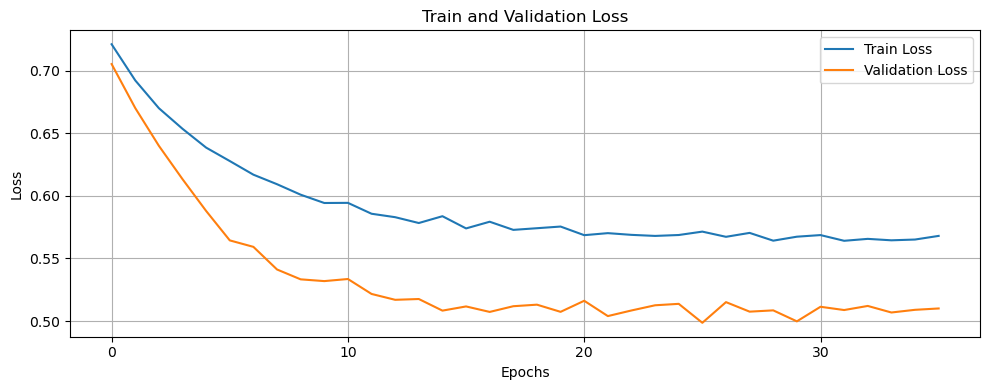

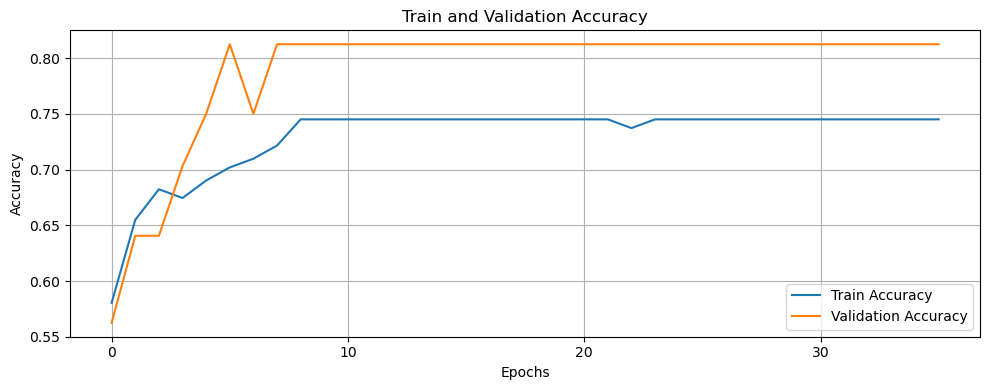

    NN: accuracy = 0.7125, precision = 0.5278, f1 = 0.6230
   ▶️ Run 8/10
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 16.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


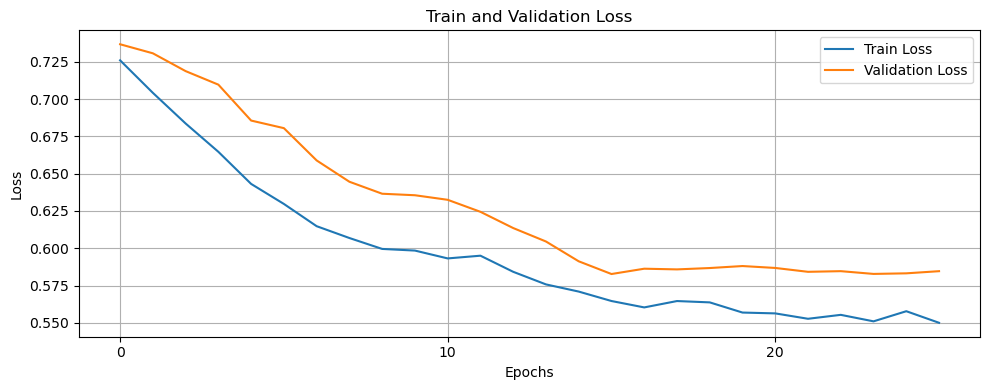

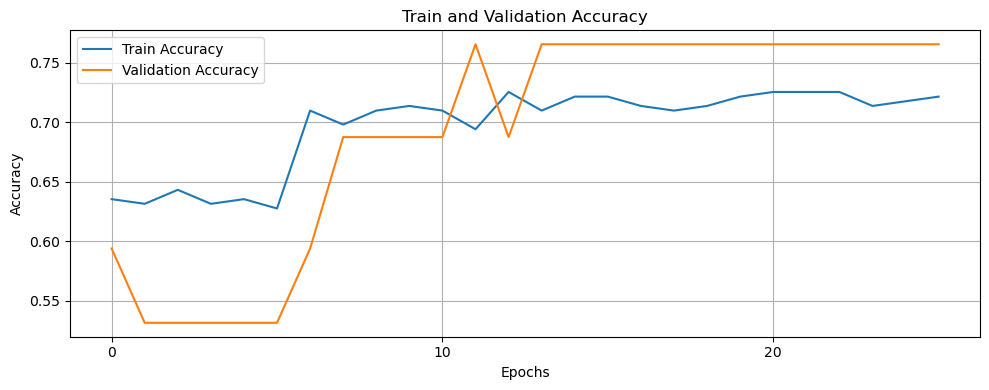

    NN: accuracy = 0.7375, precision = 0.7368, f1 = 0.7273
   ▶️ Run 9/10
Epoch 56: early stopping
Restoring model weights from the end of the best epoch: 46.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


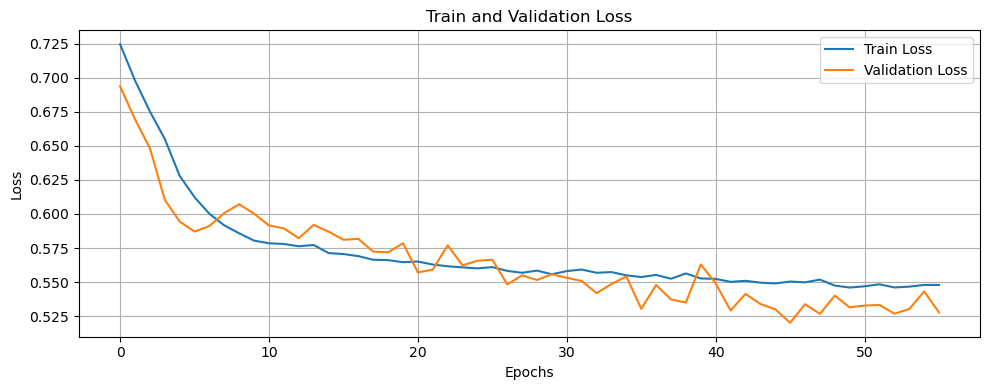

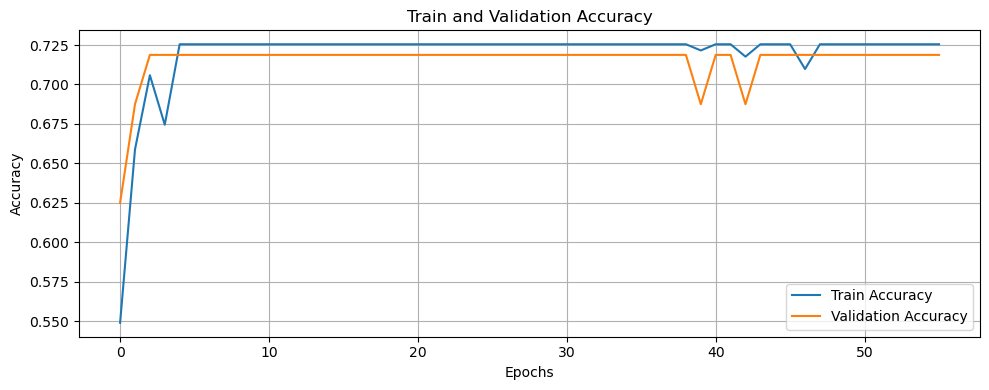

    NN: accuracy = 0.6875, precision = 0.6154, f1 = 0.7191
   ▶️ Run 10/10
Epoch 36: early stopping
Restoring model weights from the end of the best epoch: 26.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


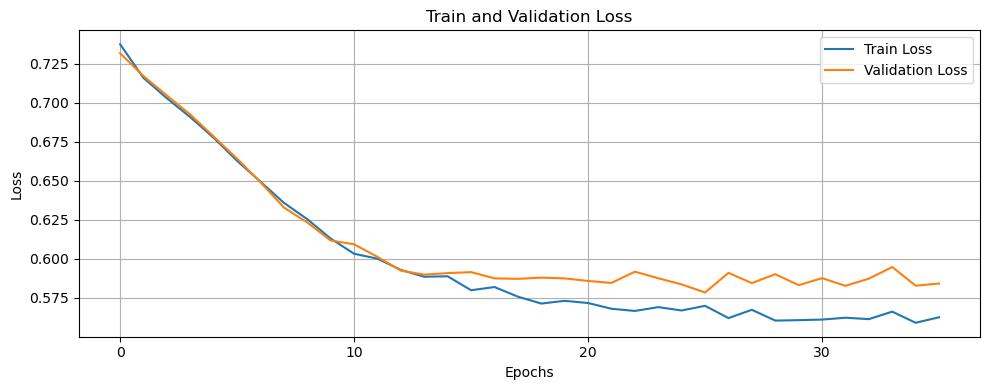

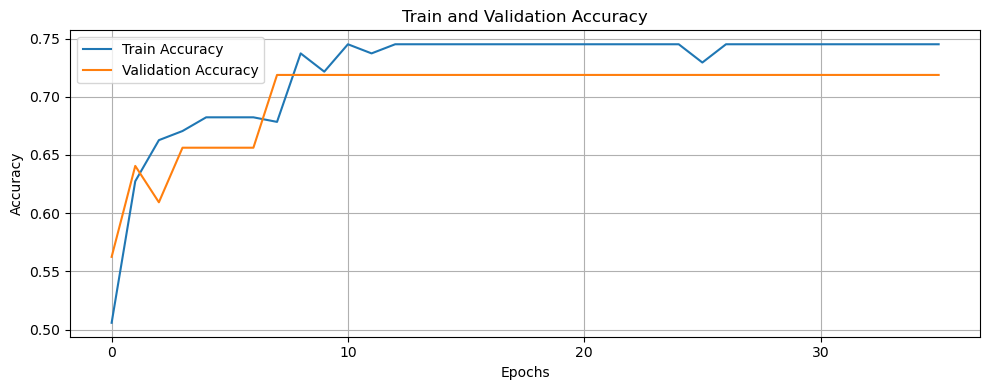

    NN: accuracy = 0.7875, precision = 0.7368, f1 = 0.7671

📊 Moyennes des 10 runs pour Carotte :
    ▶️ NN : Accuracy = 0.7150, Precision = 0.6510, F1-score = 0.7099

🌾 Culture : Laitue
   ▶️ Run 1/10
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 13.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


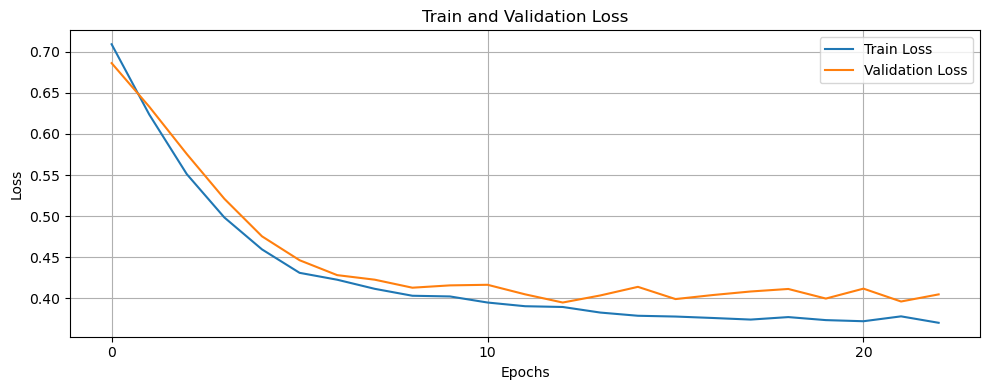

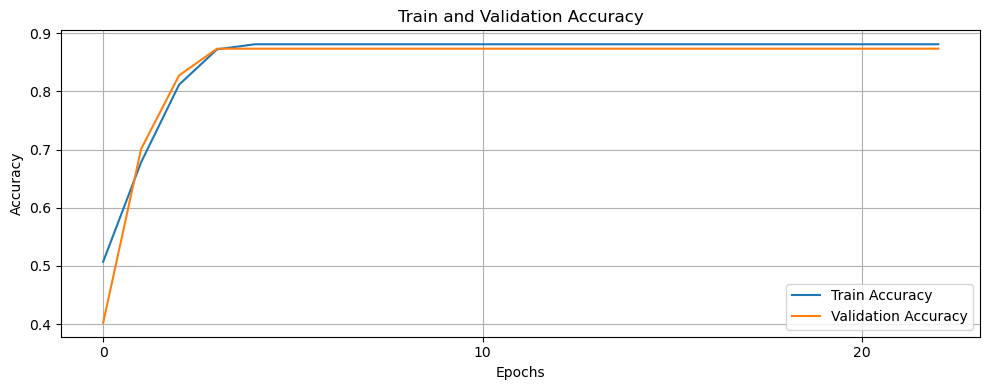

    NN: accuracy = 0.9167, precision = 0.9333, f1 = 0.9256
   ▶️ Run 2/10
Epoch 74: early stopping
Restoring model weights from the end of the best epoch: 64.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


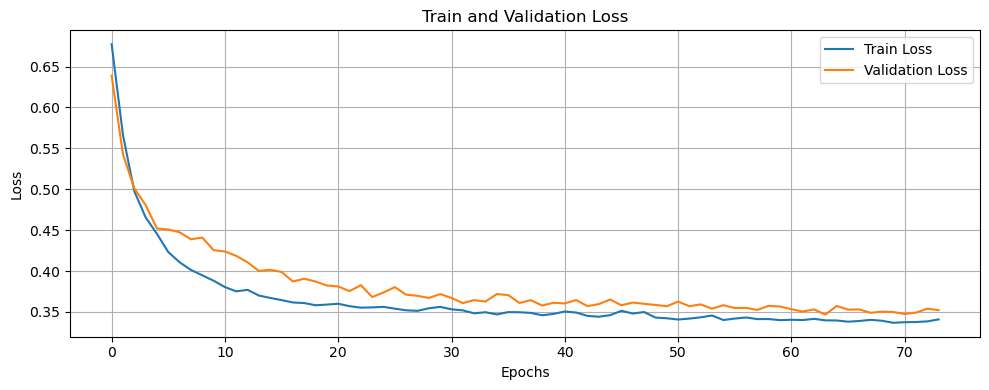

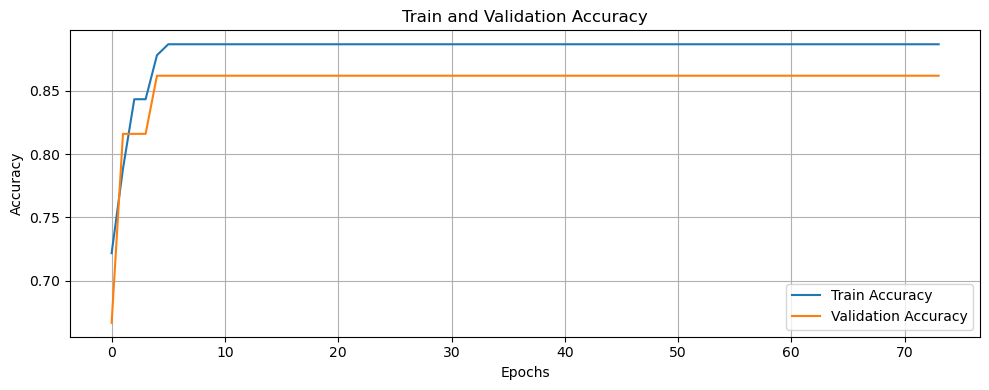

    NN: accuracy = 0.9074, precision = 0.9194, f1 = 0.9194
   ▶️ Run 3/10
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 19.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


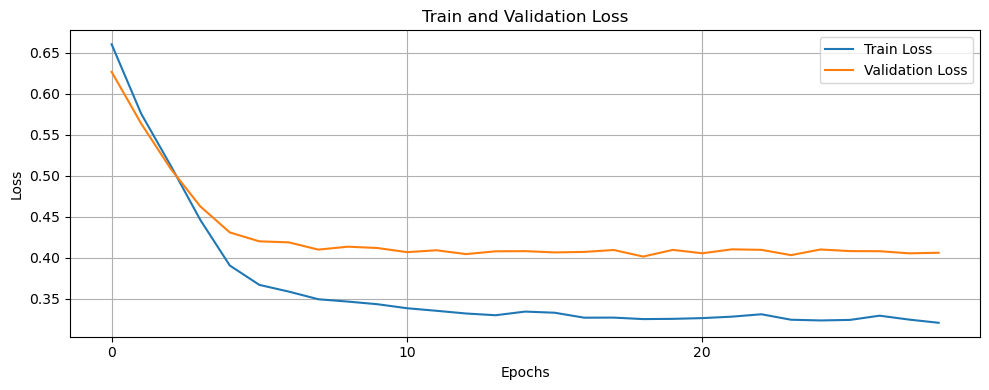

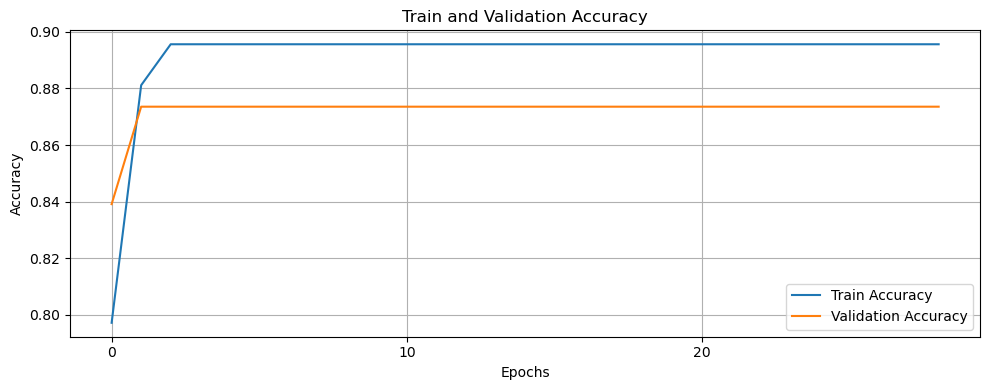

    NN: accuracy = 0.8704, precision = 0.8491, f1 = 0.8654
   ▶️ Run 4/10
Epoch 64: early stopping
Restoring model weights from the end of the best epoch: 54.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


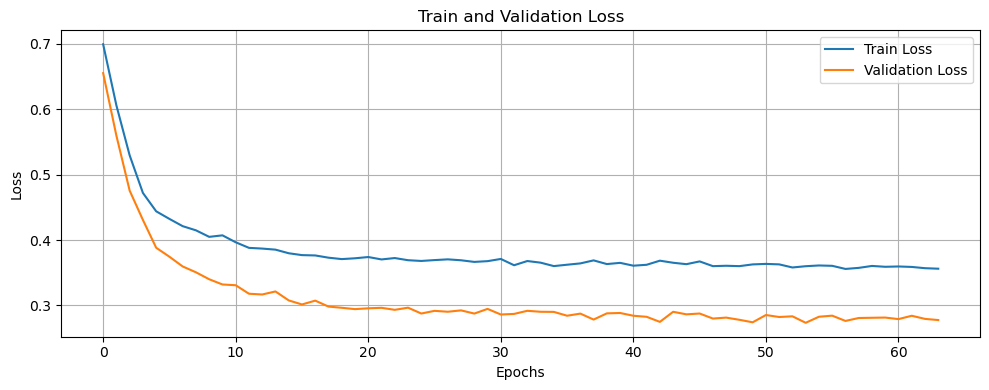

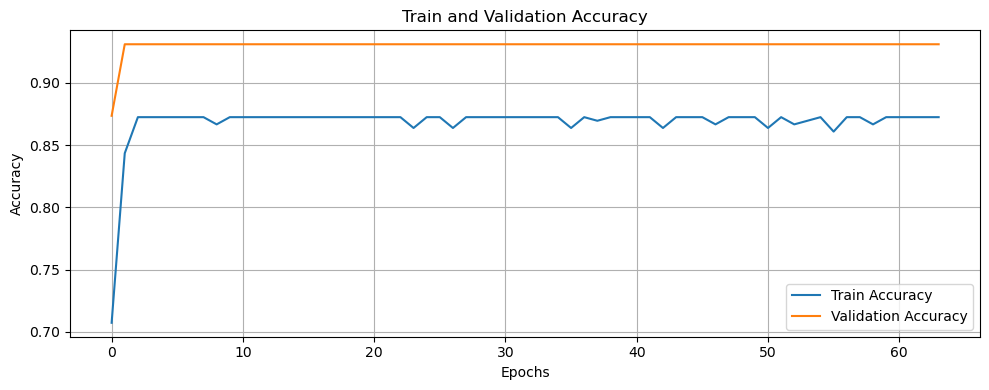

    NN: accuracy = 0.8981, precision = 0.9231, f1 = 0.8972
   ▶️ Run 5/10
Epoch 81: early stopping
Restoring model weights from the end of the best epoch: 71.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


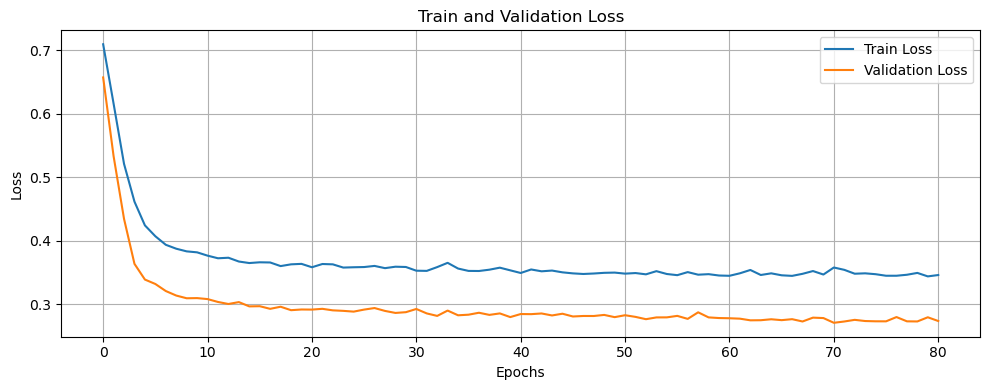

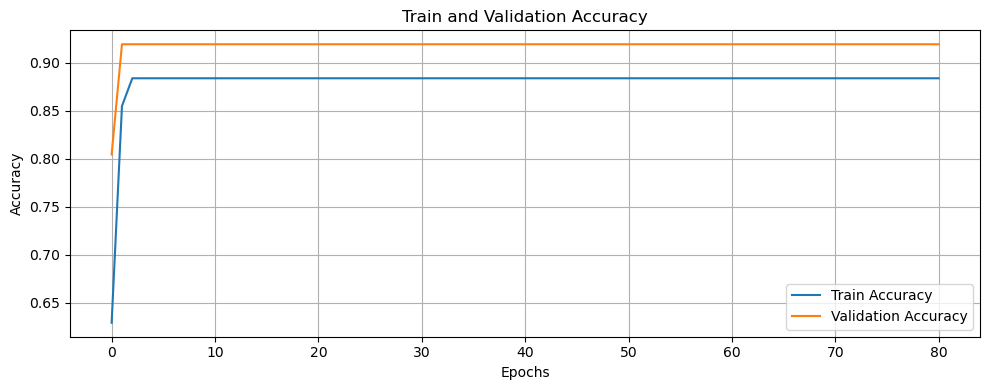

    NN: accuracy = 0.8704, precision = 0.9388, f1 = 0.8679
   ▶️ Run 6/10
Epoch 39: early stopping
Restoring model weights from the end of the best epoch: 29.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


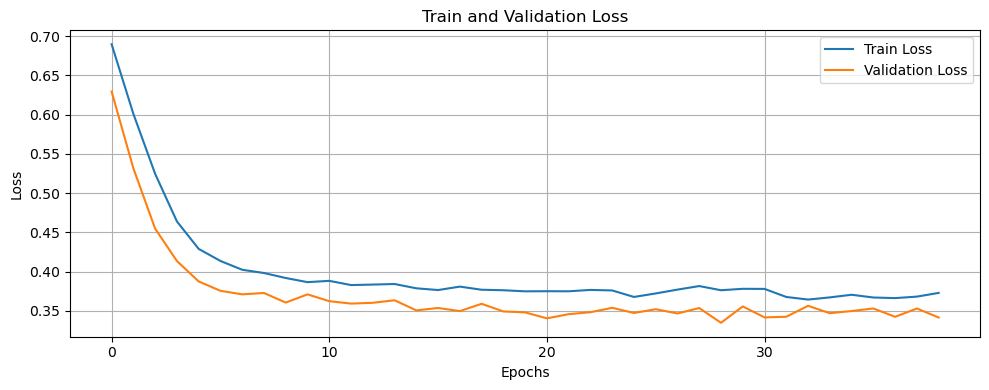

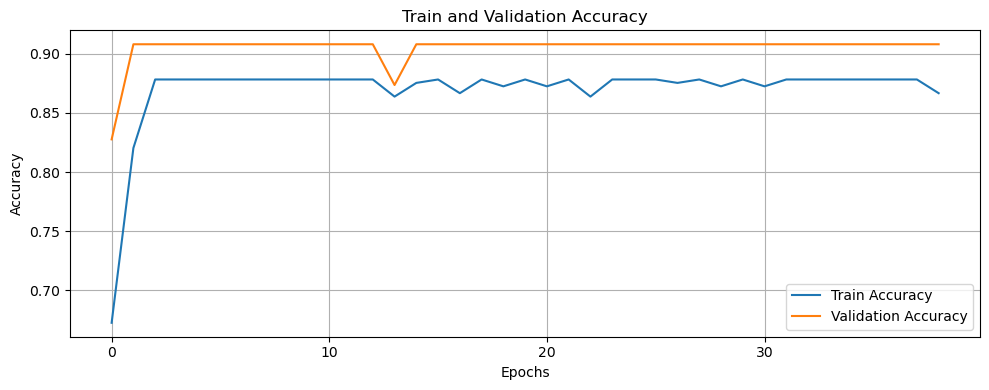

    NN: accuracy = 0.8981, precision = 0.8462, f1 = 0.8889
   ▶️ Run 7/10
Epoch 54: early stopping
Restoring model weights from the end of the best epoch: 44.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


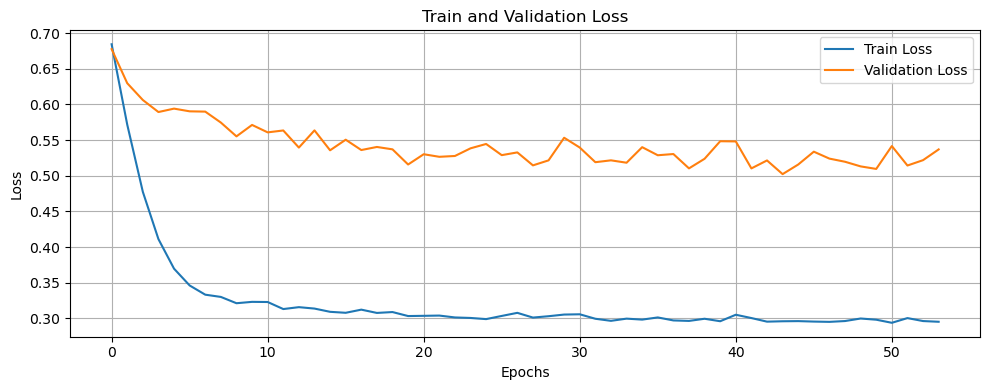

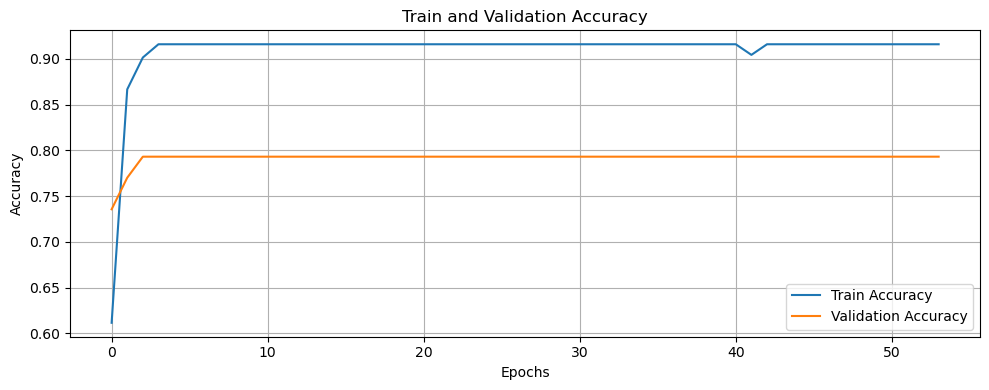

    NN: accuracy = 0.8704, precision = 0.8627, f1 = 0.8627
   ▶️ Run 8/10
Epoch 59: early stopping
Restoring model weights from the end of the best epoch: 49.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


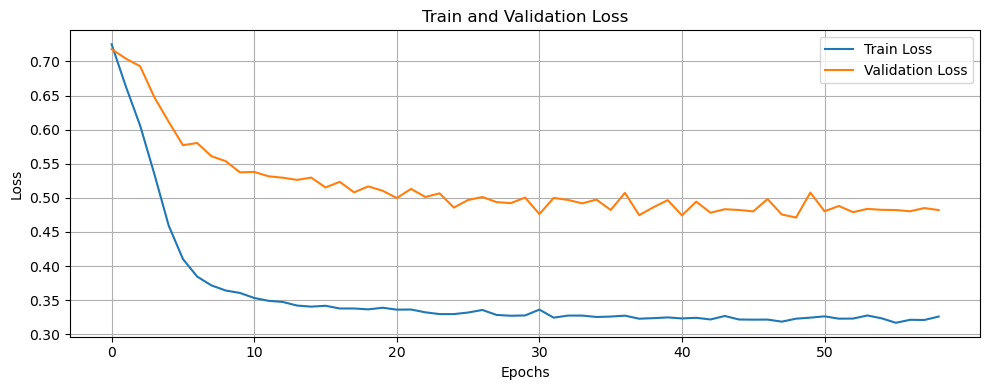

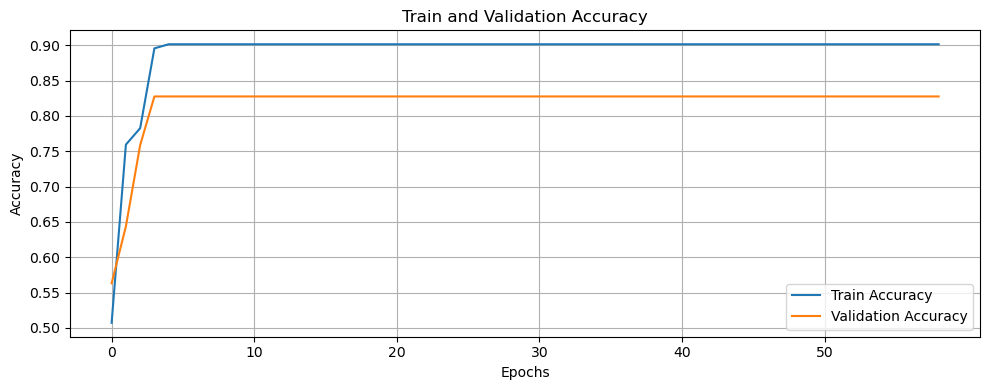

    NN: accuracy = 0.8889, precision = 0.8600, f1 = 0.8776
   ▶️ Run 9/10
Epoch 48: early stopping
Restoring model weights from the end of the best epoch: 38.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


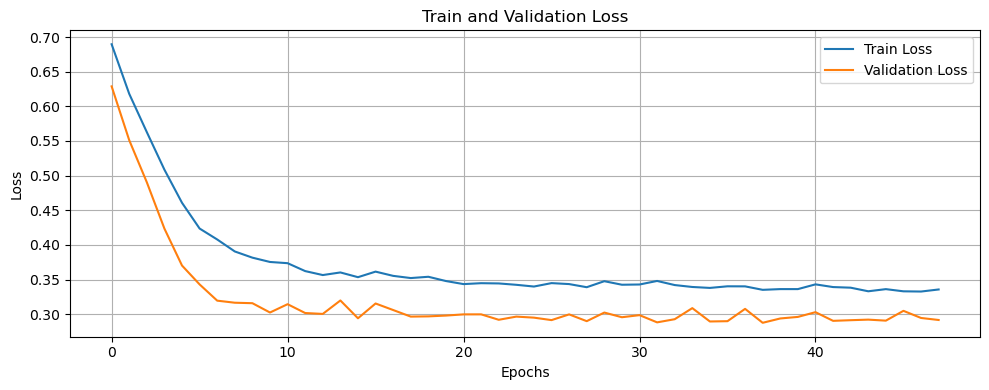

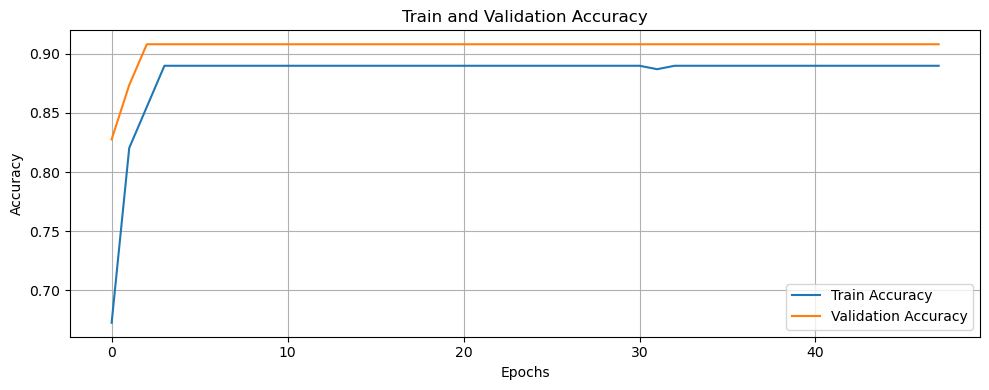

    NN: accuracy = 0.8611, precision = 0.9583, f1 = 0.8598
   ▶️ Run 10/10
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 17.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


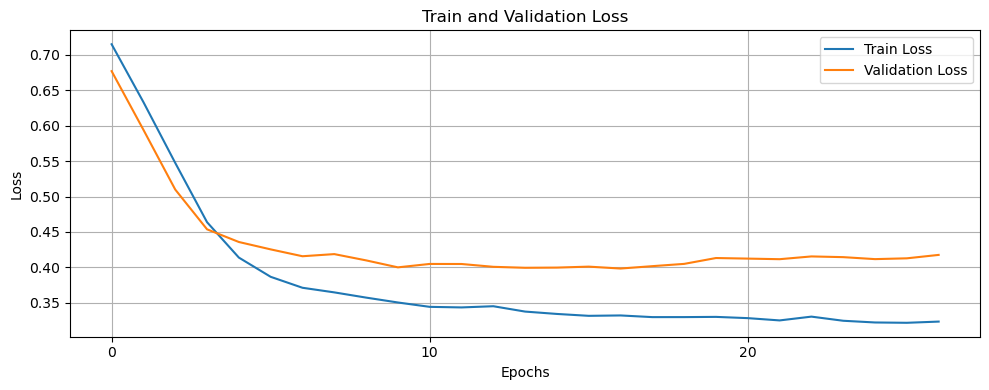

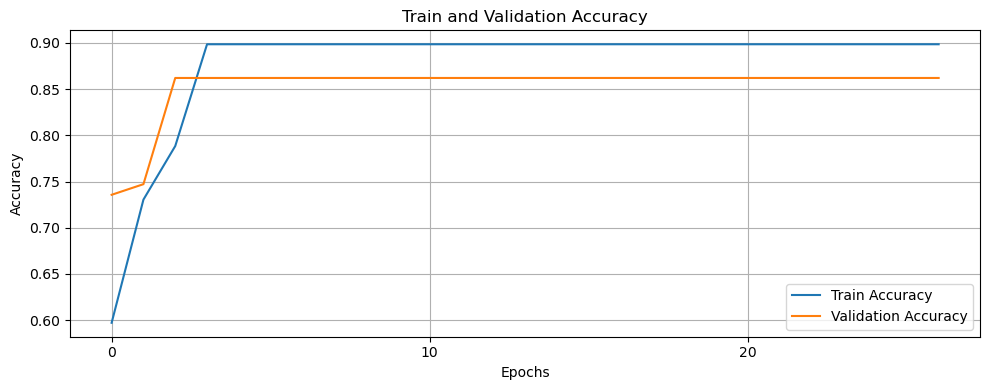

    NN: accuracy = 0.8704, precision = 0.8333, f1 = 0.8654

📊 Moyennes des 10 runs pour Laitue :
    ▶️ NN : Accuracy = 0.8852, Precision = 0.8924, F1-score = 0.8830

🌾 Culture : Oignon
   ▶️ Run 1/10
Epoch 47: early stopping
Restoring model weights from the end of the best epoch: 37.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


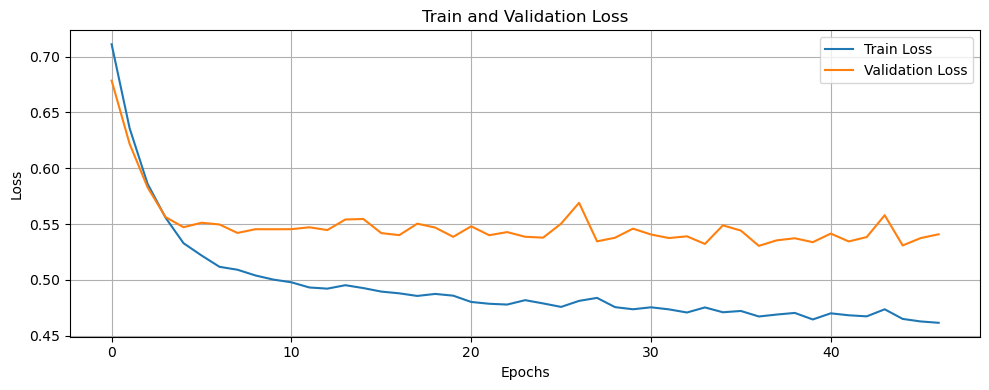

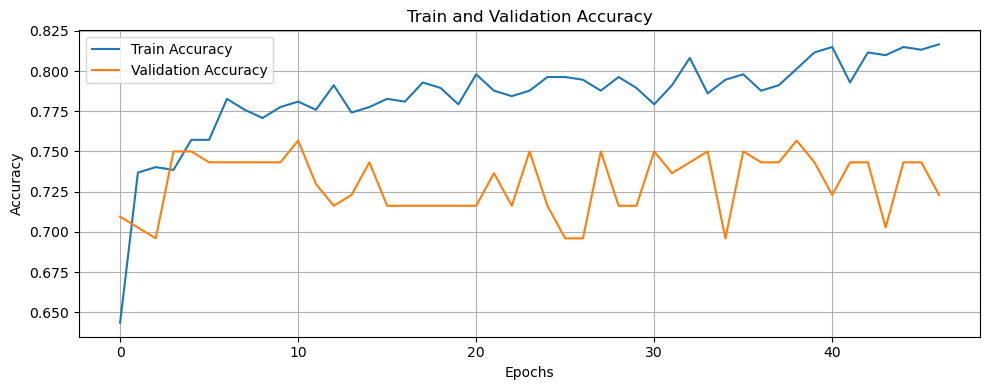

    NN: accuracy = 0.7892, precision = 0.8427, f1 = 0.7937
   ▶️ Run 2/10
Epoch 39: early stopping
Restoring model weights from the end of the best epoch: 29.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


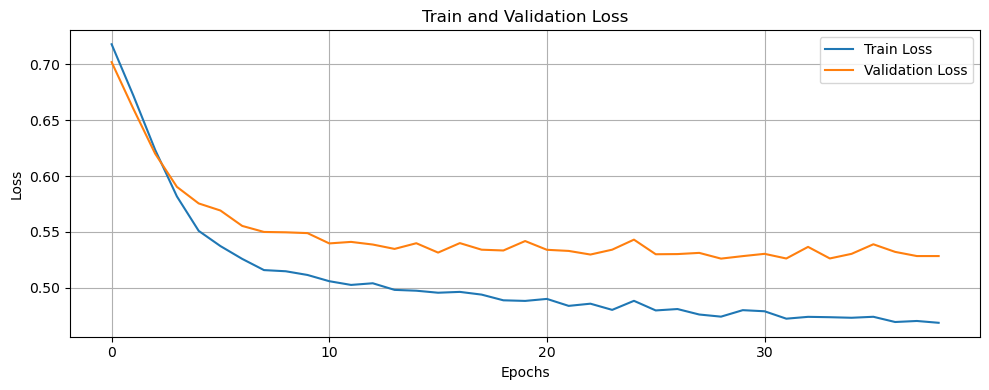

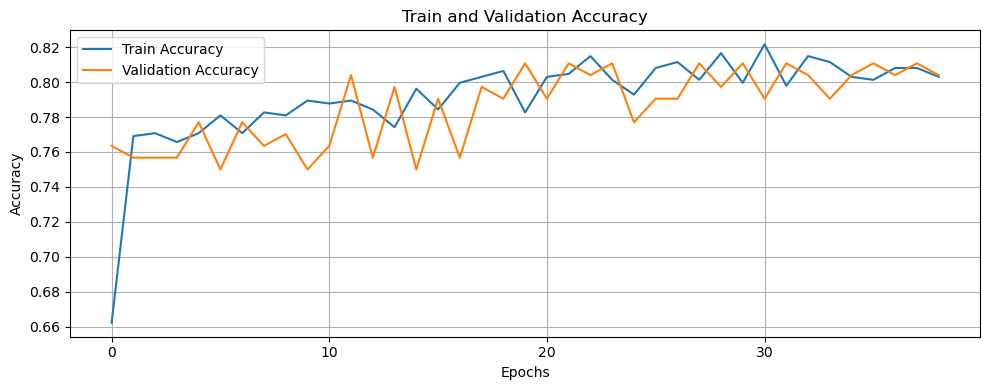

    NN: accuracy = 0.7405, precision = 0.8101, f1 = 0.7273
   ▶️ Run 3/10
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 12.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


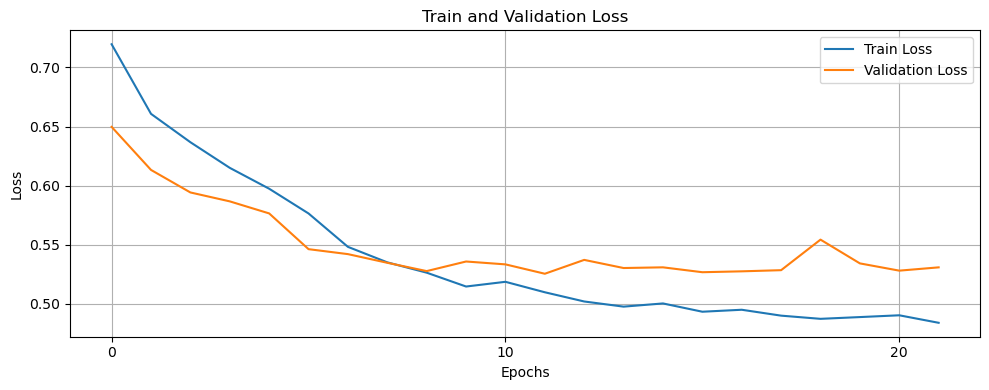

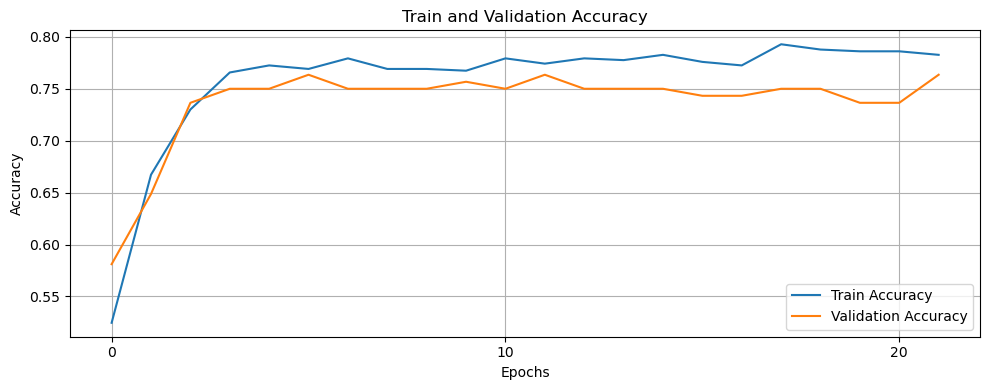

    NN: accuracy = 0.7568, precision = 0.7263, f1 = 0.7541
   ▶️ Run 4/10
Epoch 55: early stopping
Restoring model weights from the end of the best epoch: 45.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


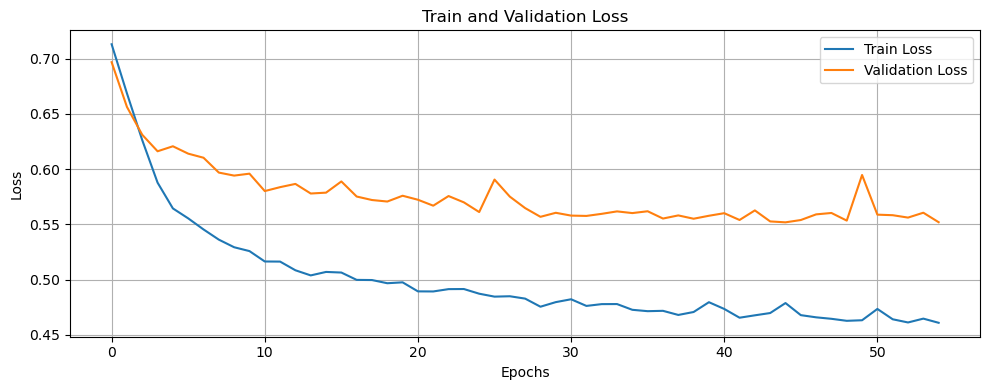

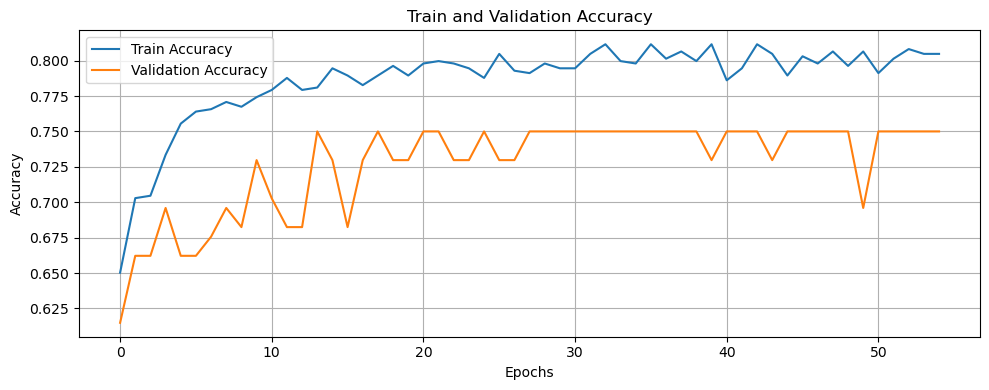

    NN: accuracy = 0.8216, precision = 0.8125, f1 = 0.7975
   ▶️ Run 5/10
Epoch 43: early stopping
Restoring model weights from the end of the best epoch: 33.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


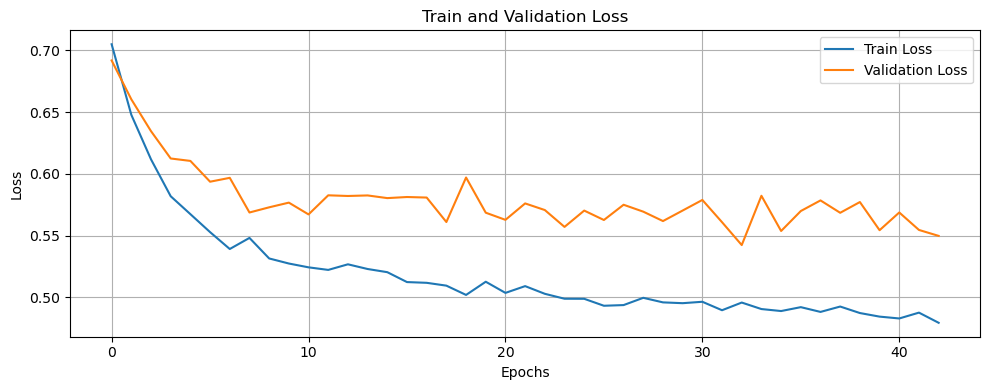

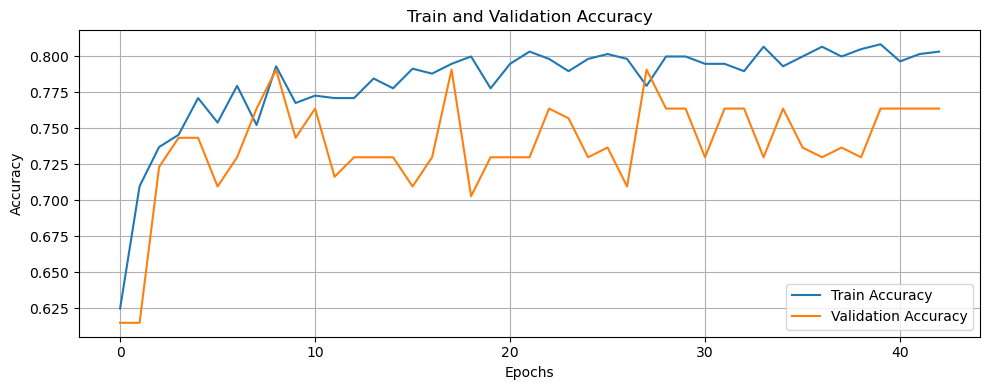

    NN: accuracy = 0.8162, precision = 0.8182, f1 = 0.8090
   ▶️ Run 6/10
Epoch 84: early stopping
Restoring model weights from the end of the best epoch: 74.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


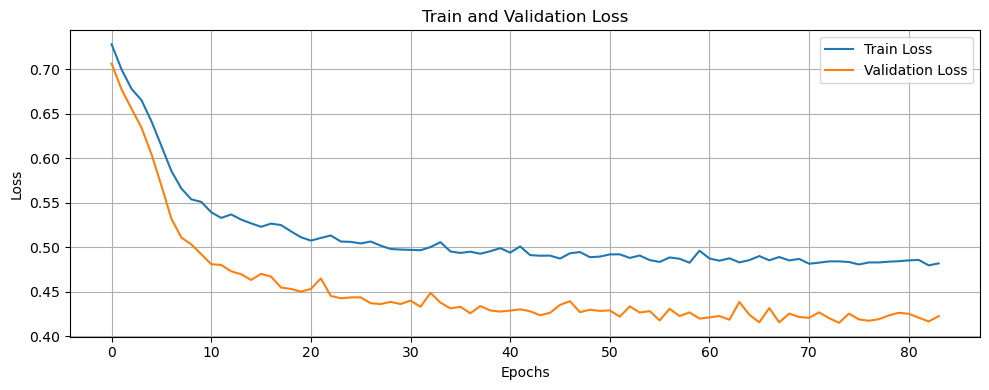

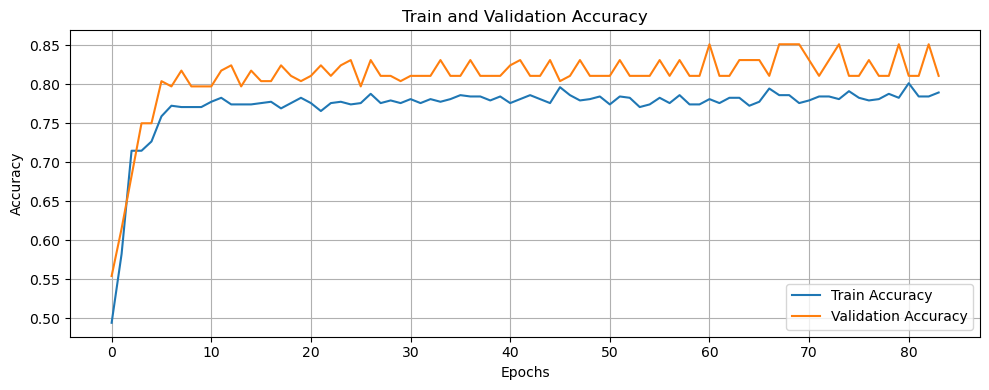

    NN: accuracy = 0.8108, precision = 0.8229, f1 = 0.8187
   ▶️ Run 7/10
Epoch 63: early stopping
Restoring model weights from the end of the best epoch: 53.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


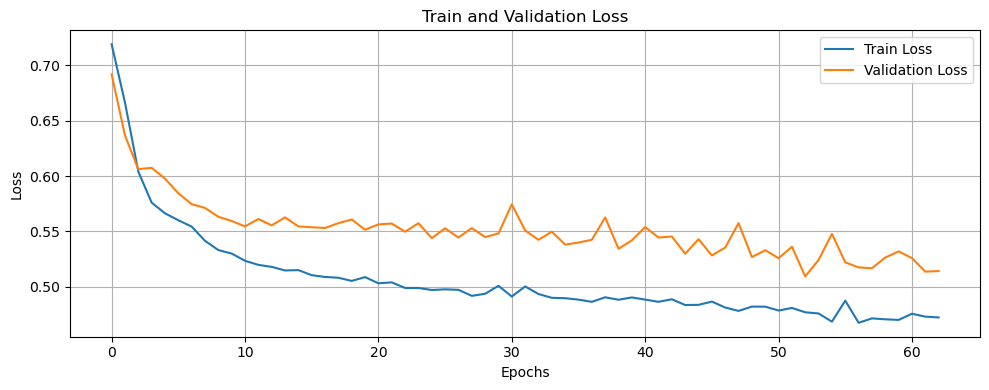

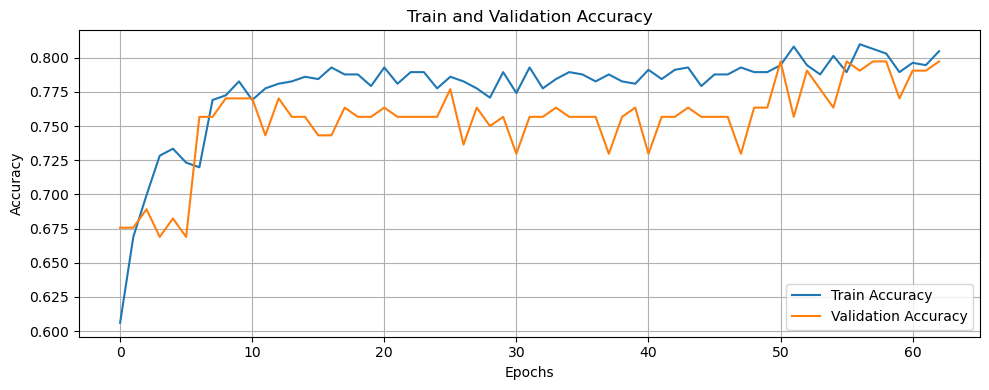

    NN: accuracy = 0.8000, precision = 0.7625, f1 = 0.7673
   ▶️ Run 8/10
Epoch 56: early stopping
Restoring model weights from the end of the best epoch: 46.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


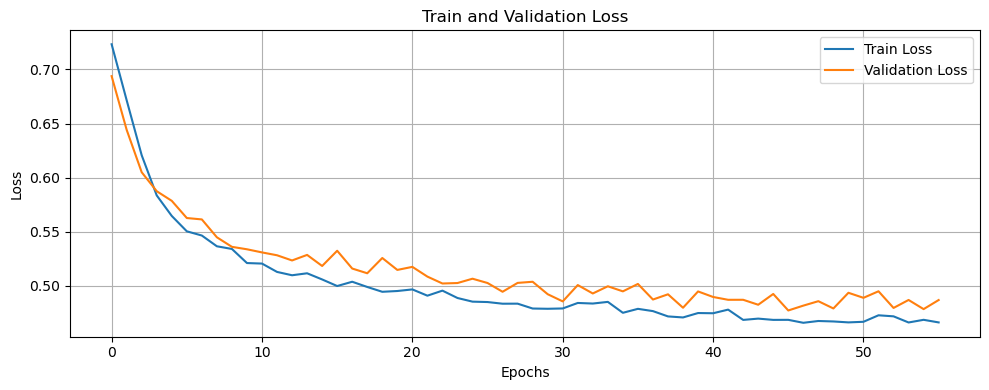

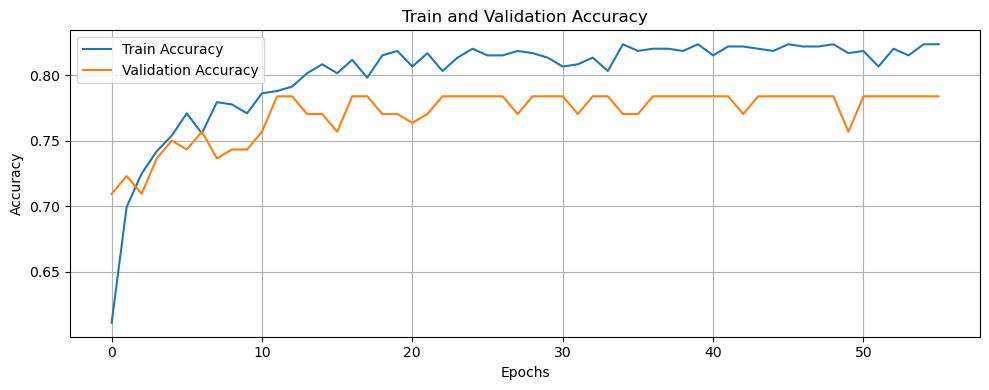

    NN: accuracy = 0.7784, precision = 0.7129, f1 = 0.7784
   ▶️ Run 9/10
Epoch 72: early stopping
Restoring model weights from the end of the best epoch: 62.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


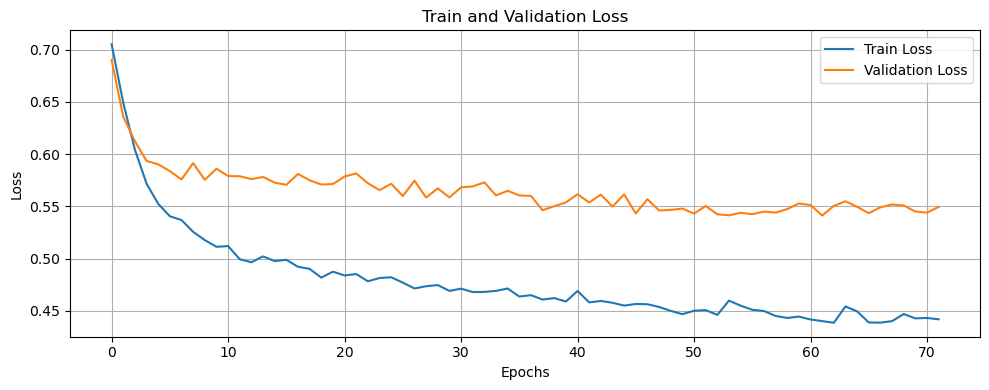

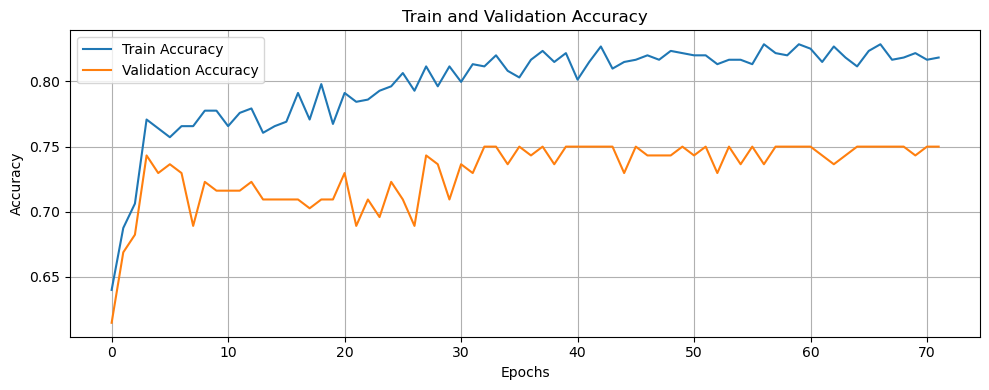

    NN: accuracy = 0.7784, precision = 0.7273, f1 = 0.7574
   ▶️ Run 10/10
Epoch 51: early stopping
Restoring model weights from the end of the best epoch: 41.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


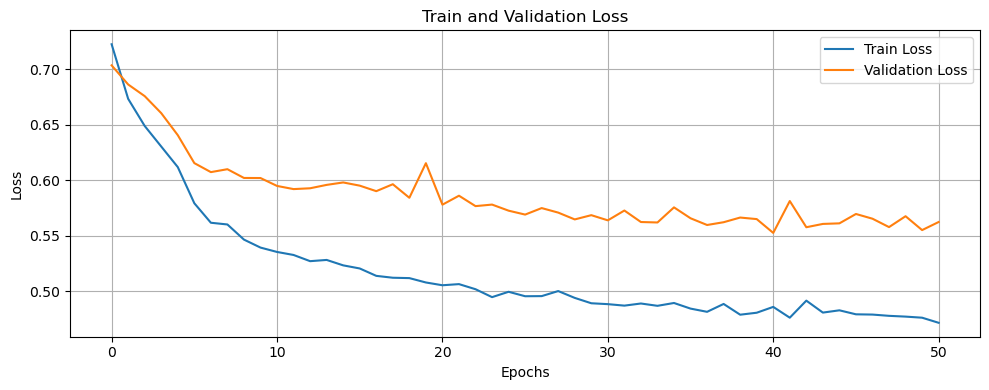

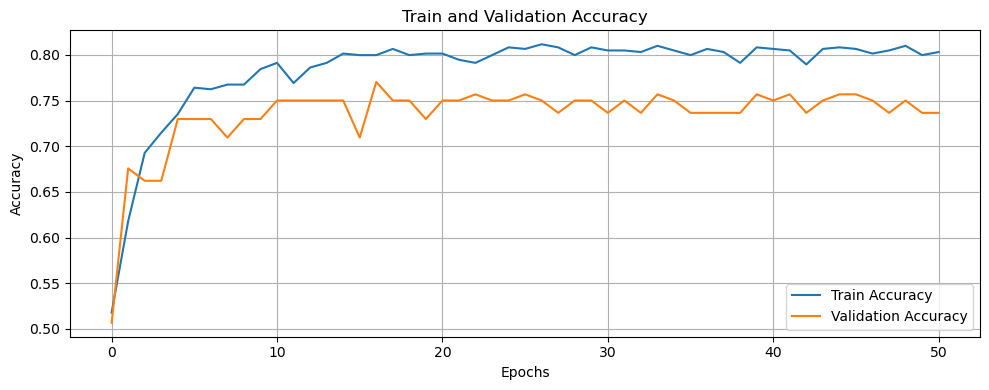

    NN: accuracy = 0.8108, precision = 0.8272, f1 = 0.7929

📊 Moyennes des 10 runs pour Oignon :
    ▶️ NN : Accuracy = 0.7903, Precision = 0.7863, F1-score = 0.7796


In [14]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, f1_score
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt

def NNModel(x, y, show_plot=True):
    scaler = StandardScaler()
    x_scaled = scaler.fit_transform(x)

    # Split
    x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.2, shuffle=True)

    # Model
    model = Sequential([
        Input(shape=(x_train.shape[1],)),
        Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.0001)),
        Dense(32, activation='relu', kernel_regularizer=regularizers.l1(0.0001)),
        Dense(16, activation='relu', kernel_regularizer=regularizers.l1(0.0001)),
        Dense(8, activation='relu', kernel_regularizer=regularizers.l1(0.0001)),
        Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

    # EarlyStopping
    early_stop = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1
    )

    # Fit model
    history = model.fit(
        x_train, y_train,
        validation_split=0.2,
        epochs=100,
        batch_size=16,
        callbacks=[early_stop],
        verbose=0
    )

    # Prédiction
    y_pred = (model.predict(x_test).flatten() >= 0.5).astype(int)

    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Courbes
    if show_plot:
        plt.figure(figsize=(10, 4))
        plt.plot(history.history["loss"], label="Train Loss")
        plt.plot(history.history["val_loss"], label="Validation Loss")
        plt.xticks(np.arange(0, len(history.history['loss']), 10))
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.title("Train and Validation Loss")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(10, 4))
        plt.plot(history.history["accuracy"], label="Train Accuracy")
        plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
        plt.xticks(np.arange(0, len(history.history['accuracy']), 10))
        plt.xlabel("Epochs")
        plt.ylabel("Accuracy")
        plt.title("Train and Validation Accuracy")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    return acc, prec, f1

N_RUNS = 10
models = [("NN", NNModel)]

for crop in DATASETS:
    print(f"\n🌾 Culture : {crop}")
    x, y = preprocess_data_classification(crop, DATASETS[crop]["y"], DATASETS[crop]["x"])

    y = y.values if hasattr(y, 'values') else y
    y = y / max(y)  # Normalisation

    acc_scores = {name: [] for name, _ in models}
    prec_scores = {name: [] for name, _ in models}
    f_scores = {name: [] for name, _ in models}

    for run in range(N_RUNS):
        print(f"   ▶️ Run {run + 1}/{N_RUNS}")
        for name, model in models:
            a, p, f = model(x, y)
            acc_scores[name].append(a)
            prec_scores[name].append(p)
            f_scores[name].append(f)
            print(f"    {name}: accuracy = {a:.4f}, precision = {p:.4f}, f1 = {f:.4f}")

    print(f"\n📊 Moyennes des {N_RUNS} runs pour {crop} :")
    for name in acc_scores:
        acc_mean = np.mean(acc_scores[name])
        prec_mean = np.mean(prec_scores[name])
        f1_mean = np.mean(f_scores[name])
        print(f"    ▶️ {name} : Accuracy = {acc_mean:.4f}, Precision = {prec_mean:.4f}, F1-score = {f1_mean:.4f}")

# LSTM


🌾 Culture : Carotte
   ▶️ Run 1/10
Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - accuracy: 0.5743 - loss: 0.8792 - val_accuracy: 0.5312 - val_loss: 0.8551 - learning_rate: 0.0010
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6007 - loss: 0.8360 - val_accuracy: 0.5625 - val_loss: 0.8212 - learning_rate: 0.0010
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5934 - loss: 0.7975 - val_accuracy: 0.5625 - val_loss: 0.7839 - learning_rate: 0.0010
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6281 - loss: 0.7584 - val_accuracy: 0.5625 - val_loss: 0.7541 - learning_rate: 0.0010
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6990 - loss: 0.6886 - val_accuracy: 0.5781 - val_loss: 0.7281 - learning_rate: 0.0010
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6737 - loss: 0.6709 - val_accuracy: 0.5781 - val_loss: 0.7075 - learning_rate: 0.0010
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - acc

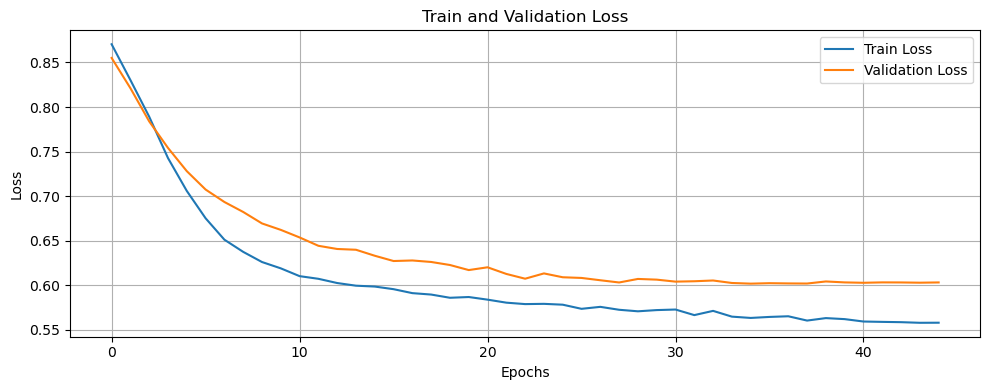

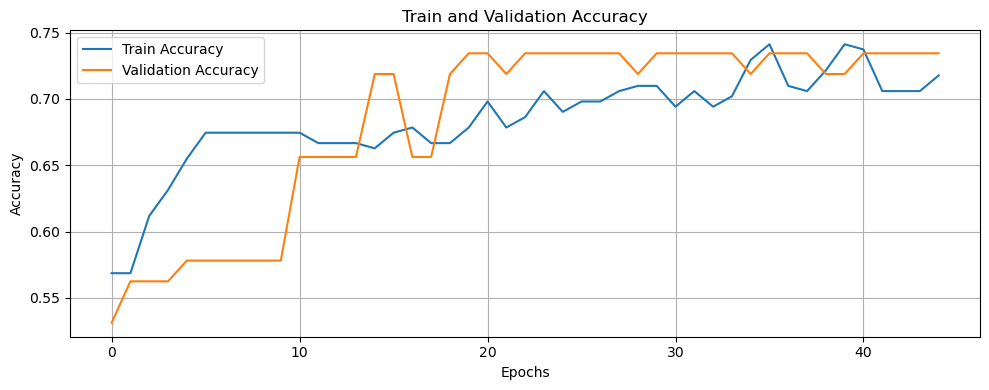

    LSTM (run 1): Accuracy = 0.8000, Precision = 0.8000, F1 = 0.8182
   ▶️ Run 2/10
Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - accuracy: 0.4963 - loss: 0.8843 - val_accuracy: 0.5156 - val_loss: 0.8569 - learning_rate: 0.0010
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5507 - loss: 0.8469 - val_accuracy: 0.5000 - val_loss: 0.8254 - learning_rate: 0.0010
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5515 - loss: 0.8088 - val_accuracy: 0.5781 - val_loss: 0.7905 - learning_rate: 0.0010
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5645 - loss: 0.7718 - val_accuracy: 0.5469 - val_loss: 0.7500 - learning_rate: 0.0010
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6759 - loss: 0.7132 - val_accuracy: 0.6406 - val_loss: 0.7104 - learning_rate: 0.0010
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6808 - loss: 0.6847 - val_accuracy: 0.7031 - val_loss: 0.6711 - learning_rate: 0.0010
Epoch 7/

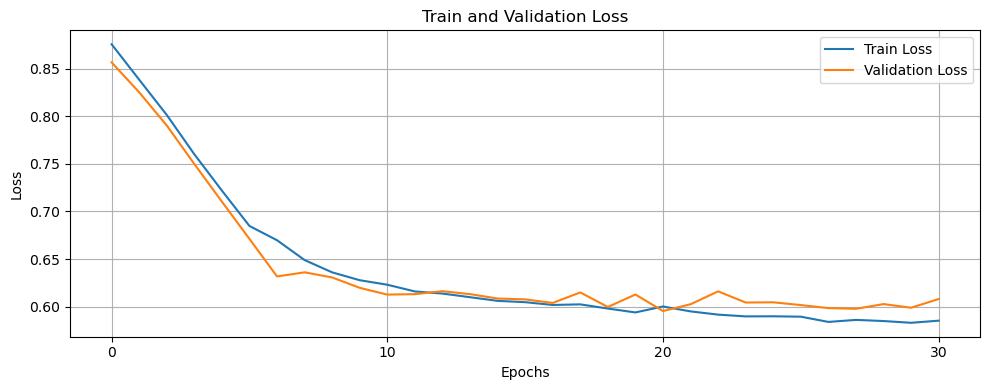

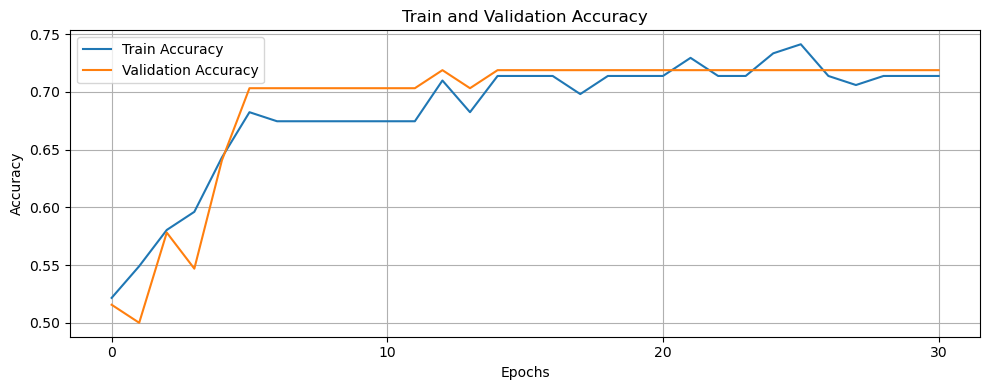

    LSTM (run 2): Accuracy = 0.7250, Precision = 0.7105, F1 = 0.7105
   ▶️ Run 3/10
Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - accuracy: 0.5010 - loss: 0.8828 - val_accuracy: 0.6875 - val_loss: 0.8588 - learning_rate: 0.0010
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5023 - loss: 0.8496 - val_accuracy: 0.6719 - val_loss: 0.8289 - learning_rate: 0.0010
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6374 - loss: 0.8071 - val_accuracy: 0.6719 - val_loss: 0.7934 - learning_rate: 0.0010
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6718 - loss: 0.7690 - val_accuracy: 0.6250 - val_loss: 0.7593 - learning_rate: 0.0010
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7009 - loss: 0.7001 - val_accuracy: 0.6406 - val_loss: 0.7232 - learning_rate: 0.0010
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7154 - loss: 0.6949 - val_accuracy: 0.7031 - val_loss: 0.6872 - learning_rate: 0.0010
Epoch 7/

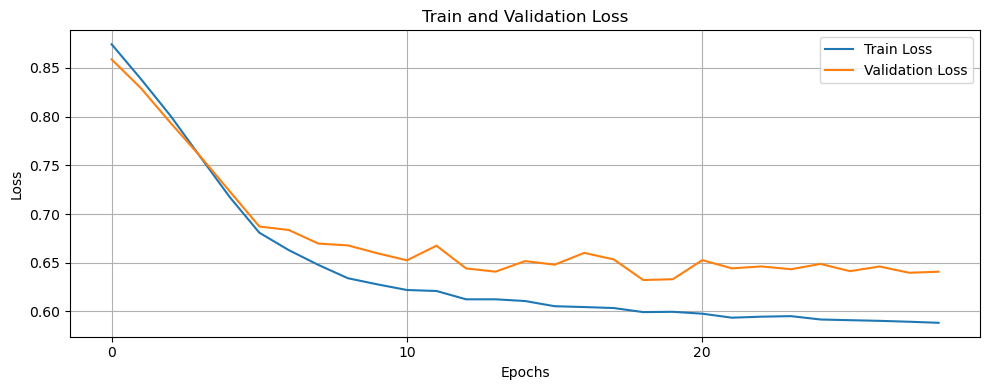

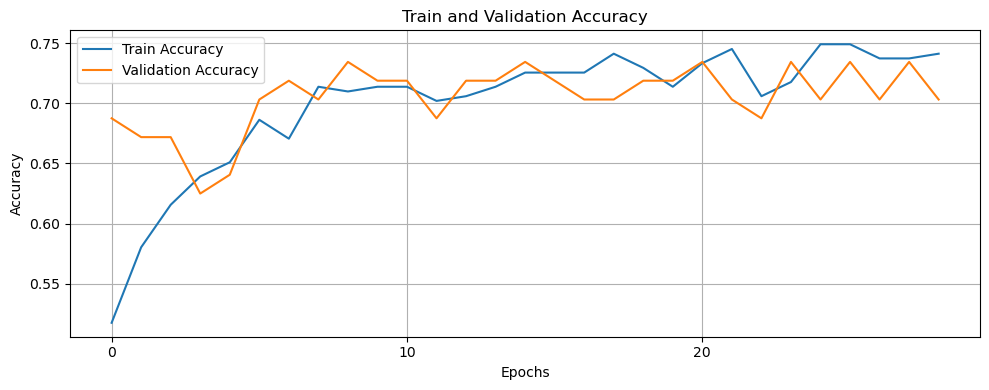

    LSTM (run 3): Accuracy = 0.7250, Precision = 0.6585, F1 = 0.7105
   ▶️ Run 4/10
Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - accuracy: 0.5043 - loss: 0.8827 - val_accuracy: 0.5156 - val_loss: 0.8601 - learning_rate: 0.0010
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5875 - loss: 0.8393 - val_accuracy: 0.5156 - val_loss: 0.8271 - learning_rate: 0.0010
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5626 - loss: 0.7997 - val_accuracy: 0.5469 - val_loss: 0.7872 - learning_rate: 0.0010
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6142 - loss: 0.7548 - val_accuracy: 0.5938 - val_loss: 0.7458 - learning_rate: 0.0010
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6543 - loss: 0.7152 - val_accuracy: 0.6406 - val_loss: 0.7139 - learning_rate: 0.0010
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7160 - loss: 0.6682 - val_accuracy: 0.6406 - val_loss: 0.7022 - learning_rate: 0.0010
Epoch 7/

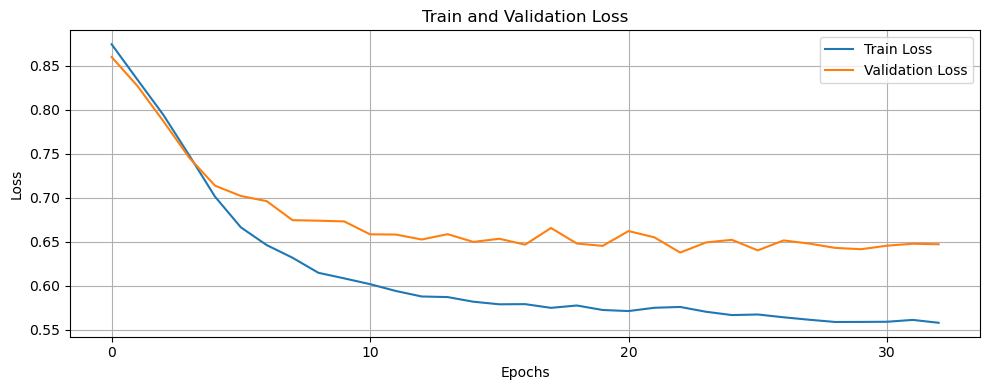

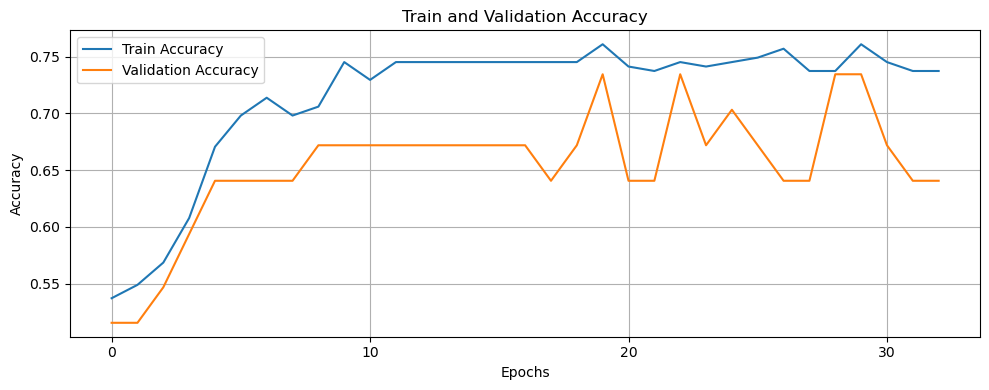

    LSTM (run 4): Accuracy = 0.7250, Precision = 0.6458, F1 = 0.7381
   ▶️ Run 5/10
Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - accuracy: 0.5621 - loss: 0.8805 - val_accuracy: 0.5312 - val_loss: 0.8554 - learning_rate: 0.0010
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5948 - loss: 0.8419 - val_accuracy: 0.5312 - val_loss: 0.8227 - learning_rate: 0.0010
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6430 - loss: 0.8012 - val_accuracy: 0.5312 - val_loss: 0.7910 - learning_rate: 0.0010
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6282 - loss: 0.7524 - val_accuracy: 0.5312 - val_loss: 0.7610 - learning_rate: 0.0010
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6388 - loss: 0.7079 - val_accuracy: 0.5625 - val_loss: 0.7382 - learning_rate: 0.0010
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6871 - loss: 0.6592 - val_accuracy: 0.5469 - val_loss: 0.7179 - learning_rate: 0.0010
Epoch 7/

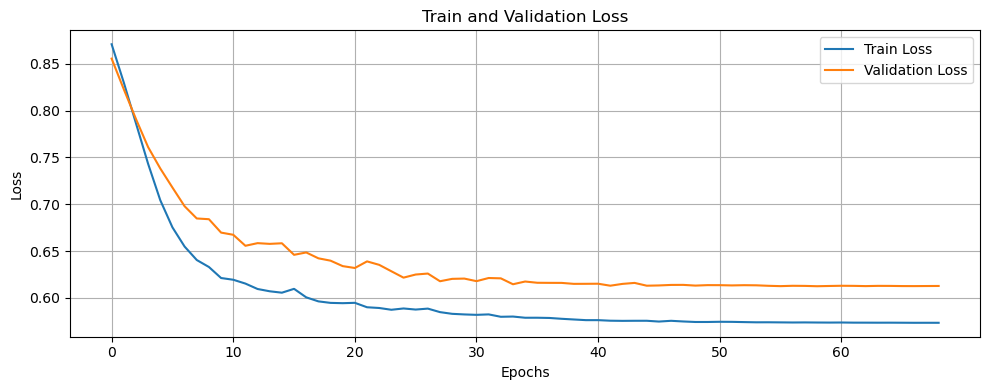

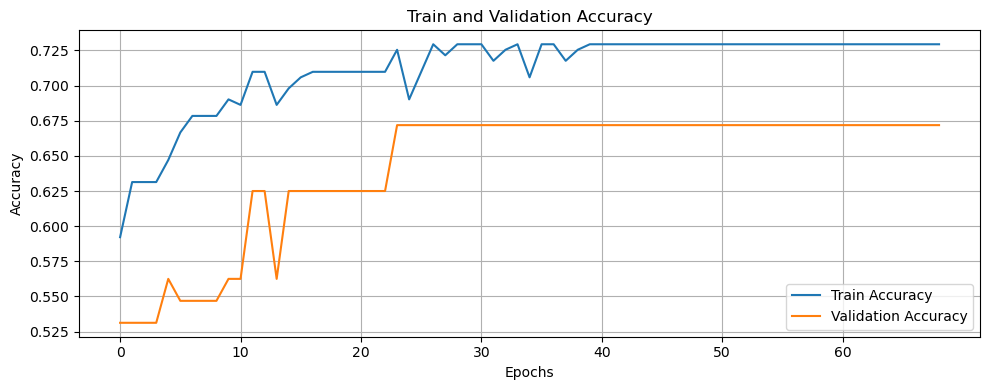

    LSTM (run 5): Accuracy = 0.7125, Precision = 0.7568, F1 = 0.7089
   ▶️ Run 6/10
Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - accuracy: 0.5268 - loss: 0.8816 - val_accuracy: 0.5469 - val_loss: 0.8670 - learning_rate: 0.0010
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5728 - loss: 0.8416 - val_accuracy: 0.5312 - val_loss: 0.8476 - learning_rate: 0.0010
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6497 - loss: 0.7871 - val_accuracy: 0.4688 - val_loss: 0.8371 - learning_rate: 0.0010
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6763 - loss: 0.7416 - val_accuracy: 0.5312 - val_loss: 0.8203 - learning_rate: 0.0010
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6451 - loss: 0.7074 - val_accuracy: 0.5781 - val_loss: 0.7924 - learning_rate: 0.0010
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6988 - loss: 0.6501 - val_accuracy: 0.6562 - val_loss: 0.7656 - learning_rate: 0.0010
Epoch 7/

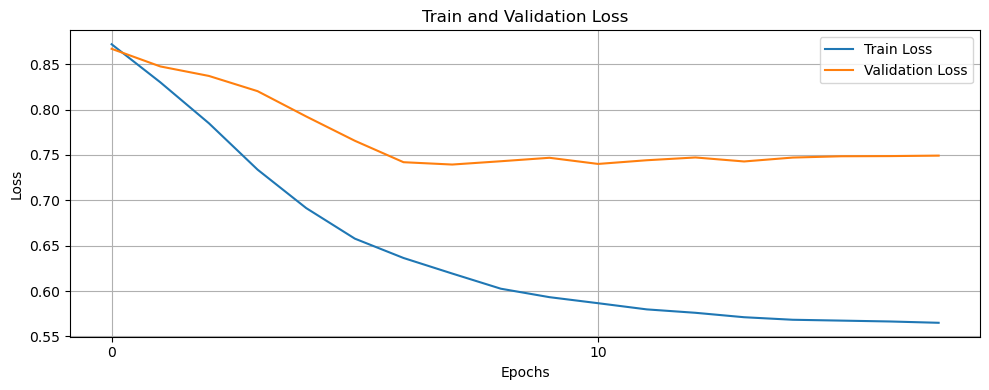

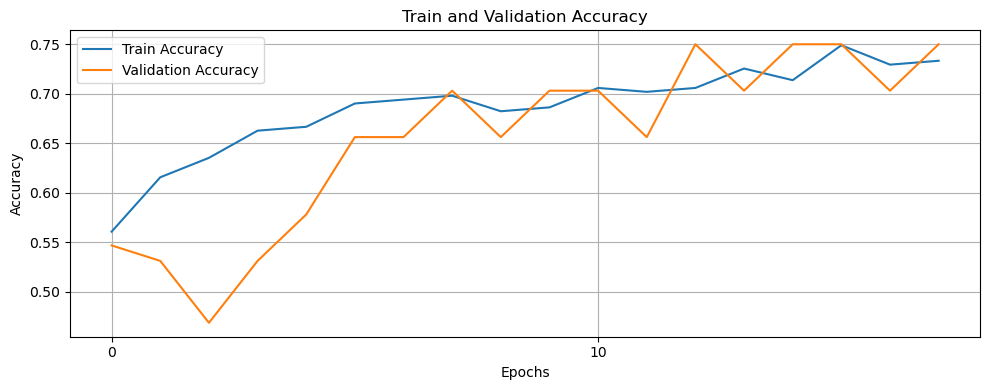

    LSTM (run 6): Accuracy = 0.7000, Precision = 0.6275, F1 = 0.7273
   ▶️ Run 7/10
Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - accuracy: 0.4370 - loss: 0.8858 - val_accuracy: 0.5625 - val_loss: 0.8602 - learning_rate: 0.0010
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5381 - loss: 0.8537 - val_accuracy: 0.5625 - val_loss: 0.8307 - learning_rate: 0.0010
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5097 - loss: 0.8269 - val_accuracy: 0.5312 - val_loss: 0.8031 - learning_rate: 0.0010
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5960 - loss: 0.7983 - val_accuracy: 0.5312 - val_loss: 0.7742 - learning_rate: 0.0010
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6016 - loss: 0.7692 - val_accuracy: 0.5312 - val_loss: 0.7415 - learning_rate: 0.0010
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5694 - loss: 0.7432 - val_accuracy: 0.5469 - val_loss: 0.7104 - learning_rate: 0.0010
Epoch 7/

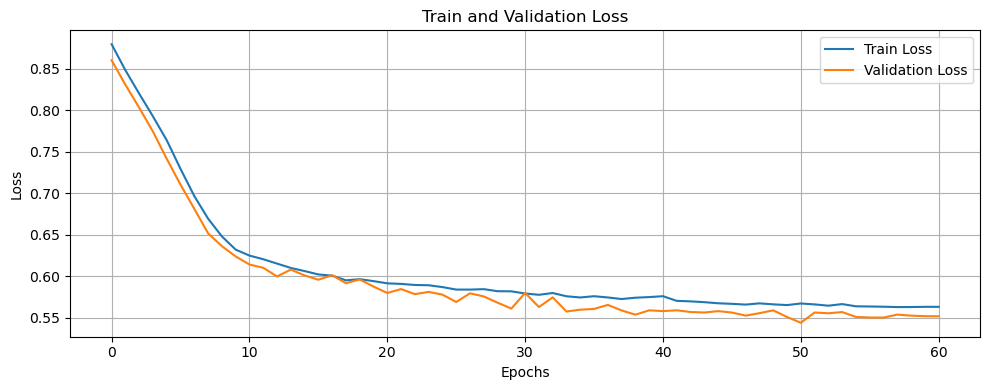

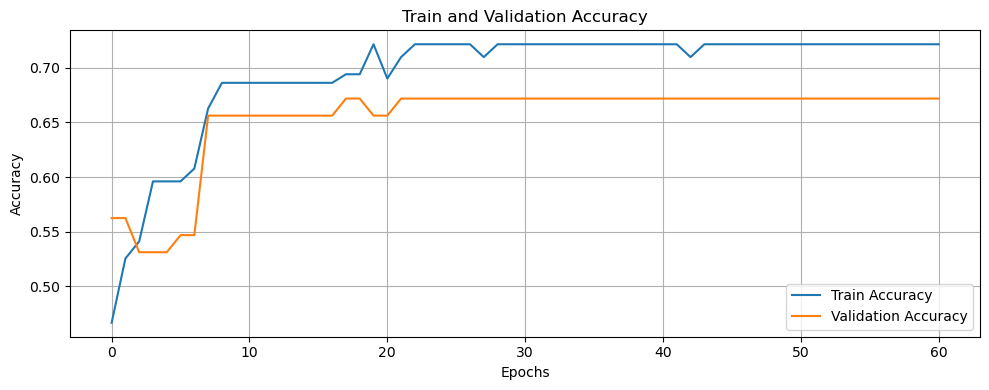

    LSTM (run 7): Accuracy = 0.7375, Precision = 0.6905, F1 = 0.7342
   ▶️ Run 8/10
Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - accuracy: 0.5381 - loss: 0.8799 - val_accuracy: 0.5625 - val_loss: 0.8576 - learning_rate: 0.0010
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6633 - loss: 0.8373 - val_accuracy: 0.5625 - val_loss: 0.8268 - learning_rate: 0.0010
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6269 - loss: 0.7982 - val_accuracy: 0.5781 - val_loss: 0.7955 - learning_rate: 0.0010
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6657 - loss: 0.7595 - val_accuracy: 0.6406 - val_loss: 0.7614 - learning_rate: 0.0010
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6886 - loss: 0.7210 - val_accuracy: 0.6406 - val_loss: 0.7268 - learning_rate: 0.0010
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7219 - loss: 0.6758 - val_accuracy: 0.6406 - val_loss: 0.7048 - learning_rate: 0.0010
Epoch 7/

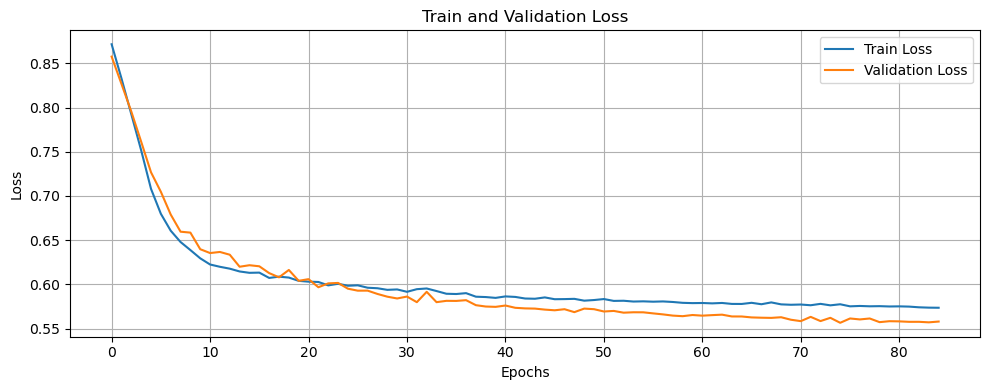

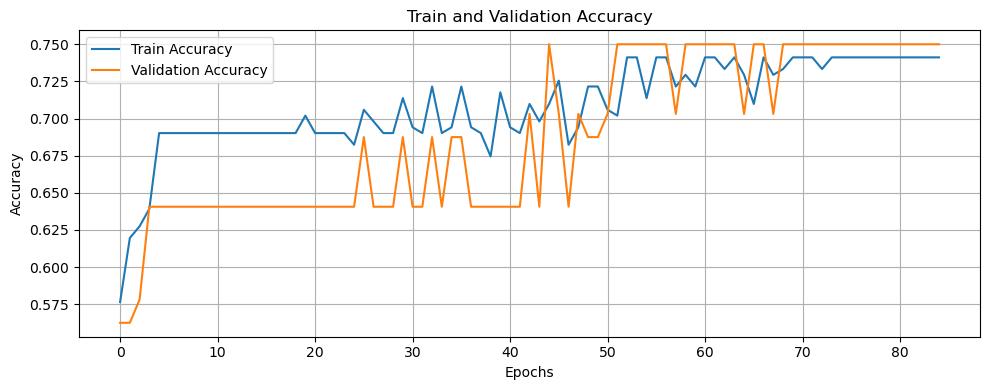

    LSTM (run 8): Accuracy = 0.7750, Precision = 0.7045, F1 = 0.7750
   ▶️ Run 9/10
Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - accuracy: 0.5299 - loss: 0.8835 - val_accuracy: 0.5938 - val_loss: 0.8541 - learning_rate: 0.0010
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6074 - loss: 0.8478 - val_accuracy: 0.5938 - val_loss: 0.8191 - learning_rate: 0.0010
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5763 - loss: 0.8146 - val_accuracy: 0.5938 - val_loss: 0.7816 - learning_rate: 0.0010
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6124 - loss: 0.7705 - val_accuracy: 0.5938 - val_loss: 0.7413 - learning_rate: 0.0010
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6068 - loss: 0.7293 - val_accuracy: 0.6094 - val_loss: 0.7148 - learning_rate: 0.0010
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6491 - loss: 0.6896 - val_accuracy: 0.6719 - val_loss: 0.6966 - learning_rate: 0.0010
Epoch 7/

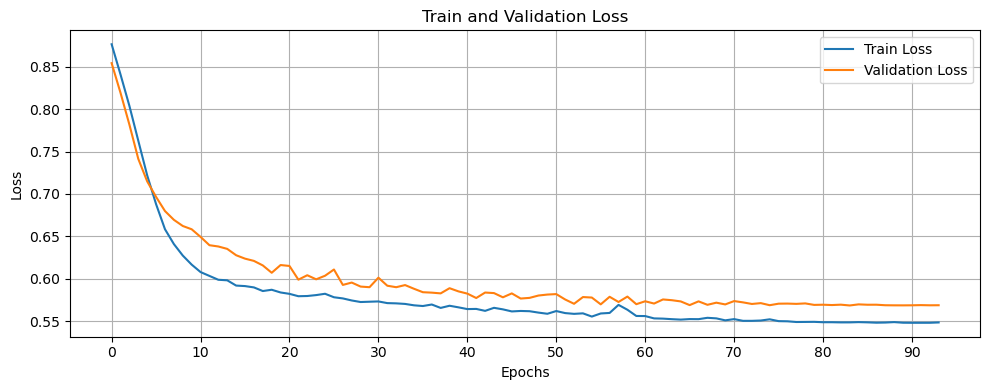

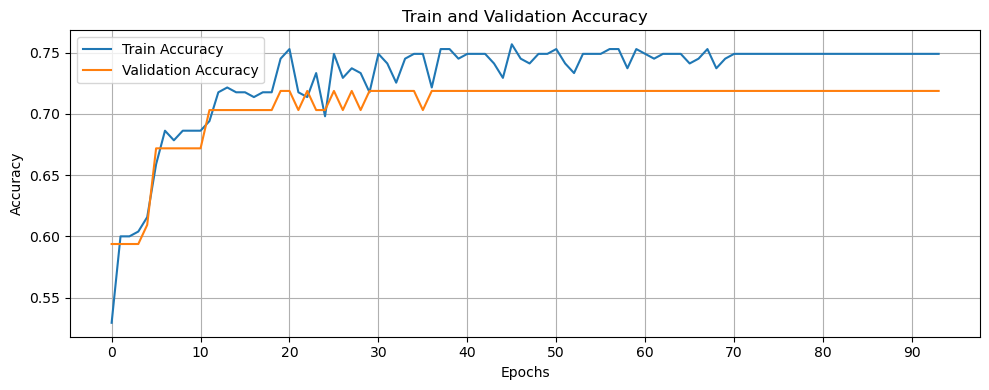

    LSTM (run 9): Accuracy = 0.7000, Precision = 0.6889, F1 = 0.7209
   ▶️ Run 10/10
Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - accuracy: 0.5529 - loss: 0.8810 - val_accuracy: 0.6250 - val_loss: 0.8471 - learning_rate: 0.0010
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6055 - loss: 0.8467 - val_accuracy: 0.6562 - val_loss: 0.8088 - learning_rate: 0.0010
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6380 - loss: 0.8138 - val_accuracy: 0.6875 - val_loss: 0.7618 - learning_rate: 0.0010
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6674 - loss: 0.7816 - val_accuracy: 0.6562 - val_loss: 0.7192 - learning_rate: 0.0010
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6718 - loss: 0.7416 - val_accuracy: 0.6562 - val_loss: 0.6858 - learning_rate: 0.0010
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6852 - loss: 0.6846 - val_accuracy: 0.6562 - val_loss: 0.6846 - learning_rate: 0.0010
Epoch 7

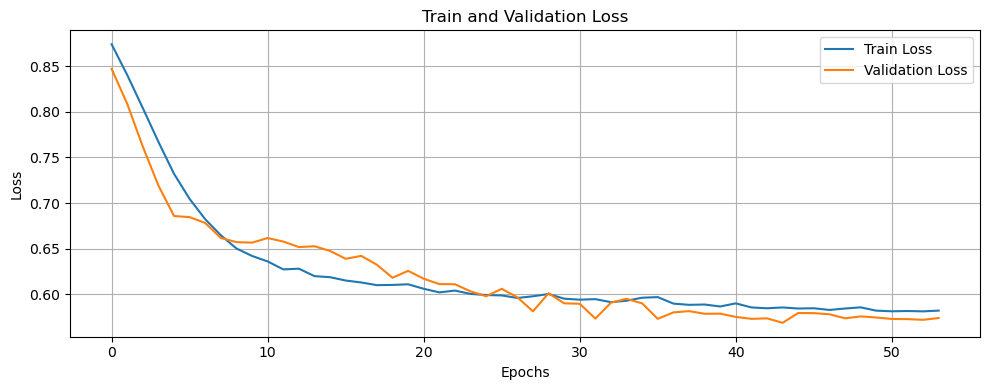

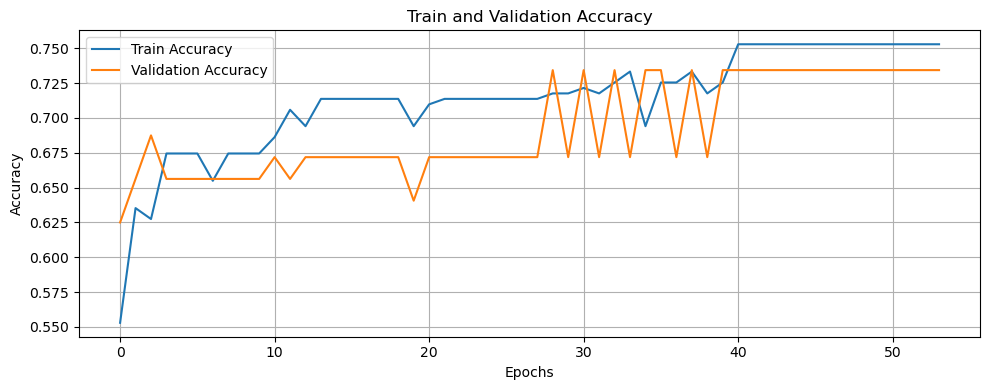

    LSTM (run 10): Accuracy = 0.7500, Precision = 0.6429, F1 = 0.7297

📊 Moyenne des 10 runs pour Carotte :
    ▶️ Accuracy  = 0.7350
    ▶️ Precision = 0.6926
    ▶️ F1-score  = 0.7373

🌾 Culture : Laitue
   ▶️ Run 1/10
Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5402 - loss: 0.8682 - val_accuracy: 0.7701 - val_loss: 0.8123 - learning_rate: 0.0010
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8445 - loss: 0.7897 - val_accuracy: 0.8506 - val_loss: 0.6918 - learning_rate: 0.0010
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8336 - loss: 0.6787 - val_accuracy: 0.8506 - val_loss: 0.5715 - learning_rate: 0.0010
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7905 - loss: 0.6059 - val_accuracy: 0.8506 - val_loss: 0.5217 - learning_rate: 0.0010
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8110 - loss: 0.5767 - val_accuracy: 0.8506 - val_loss: 0.5000 - learning_rate: 0.0010
Epoch 6/100
22/22 ━━━━

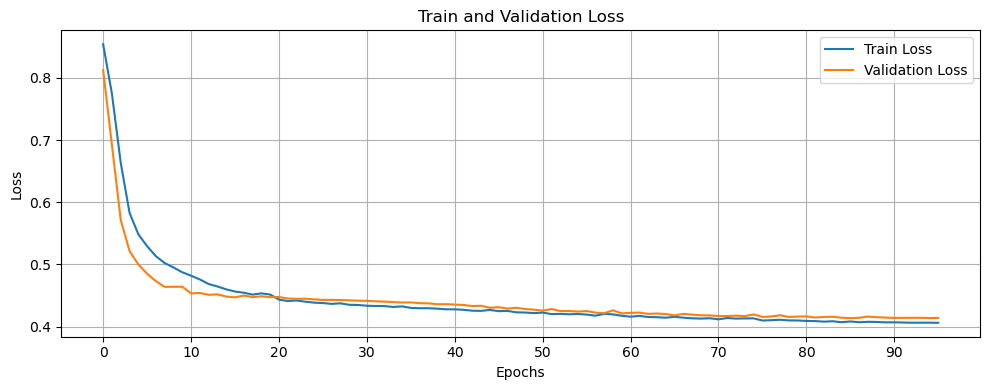

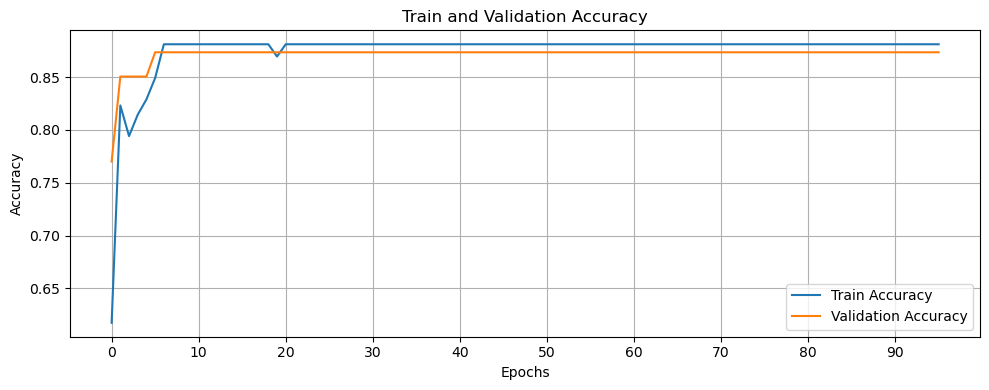

    LSTM (run 1): Accuracy = 0.9167, Precision = 0.9583, F1 = 0.9109
   ▶️ Run 2/10
Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.5381 - loss: 0.8711 - val_accuracy: 0.6782 - val_loss: 0.8268 - learning_rate: 0.0010
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7901 - loss: 0.7901 - val_accuracy: 0.7701 - val_loss: 0.7355 - learning_rate: 0.0010
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7922 - loss: 0.6843 - val_accuracy: 0.8161 - val_loss: 0.6422 - learning_rate: 0.0010
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8853 - loss: 0.5301 - val_accuracy: 0.8161 - val_loss: 0.6199 - learning_rate: 0.0010
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8494 - loss: 0.5188 - val_accuracy: 0.8506 - val_loss: 0.5973 - learning_rate: 0.0010
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9057 - loss: 0.4717 - val_accuracy: 0.8506 - val_loss: 0.5871 - learning_rate: 0.0010
Epoch 7/

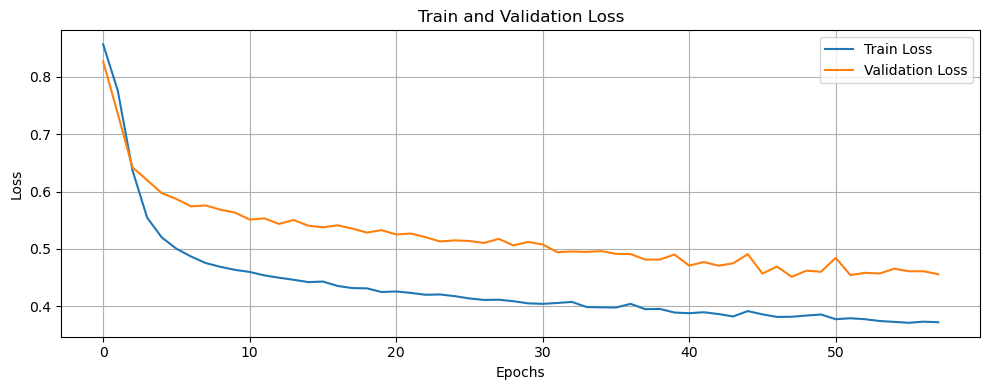

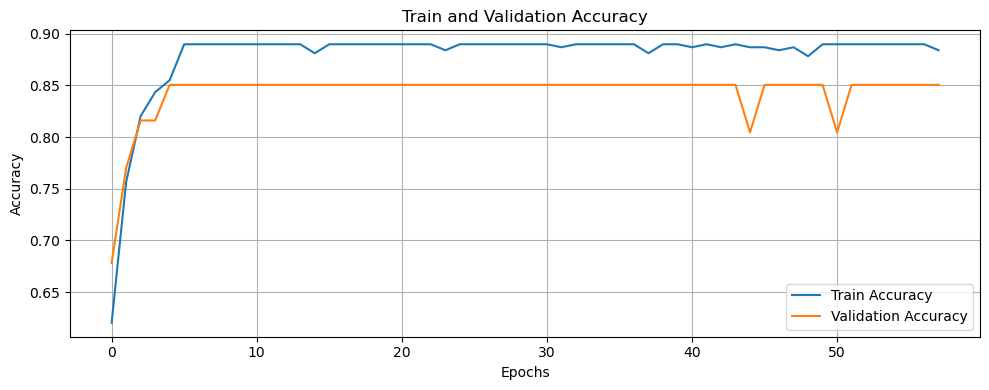

    LSTM (run 2): Accuracy = 0.9074, Precision = 0.8909, F1 = 0.9074
   ▶️ Run 3/10
Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6545 - loss: 0.8673 - val_accuracy: 0.7356 - val_loss: 0.8132 - learning_rate: 0.0010
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7835 - loss: 0.7914 - val_accuracy: 0.7356 - val_loss: 0.6944 - learning_rate: 0.0010
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7901 - loss: 0.6666 - val_accuracy: 0.8851 - val_loss: 0.5314 - learning_rate: 0.0010
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8118 - loss: 0.6045 - val_accuracy: 0.8851 - val_loss: 0.4473 - learning_rate: 0.0010
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8330 - loss: 0.5522 - val_accuracy: 0.8851 - val_loss: 0.4014 - learning_rate: 0.0010
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8420 - loss: 0.5052 - val_accuracy: 0.9425 - val_loss: 0.3798 - learning_rate: 0.0010
Epoch 7/

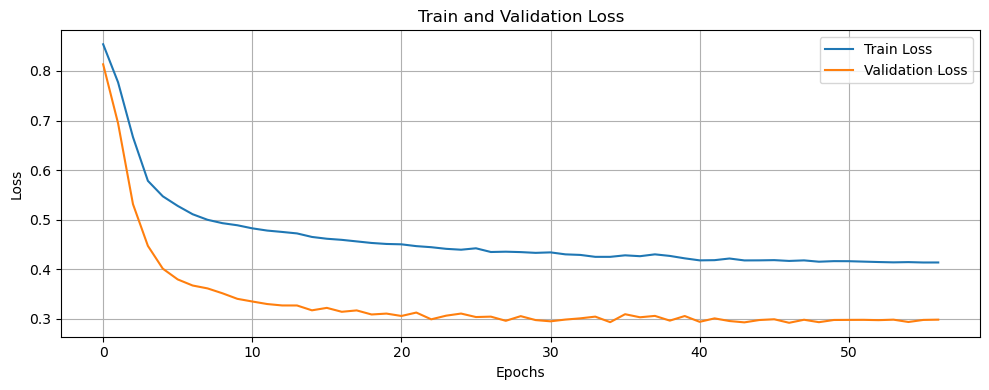

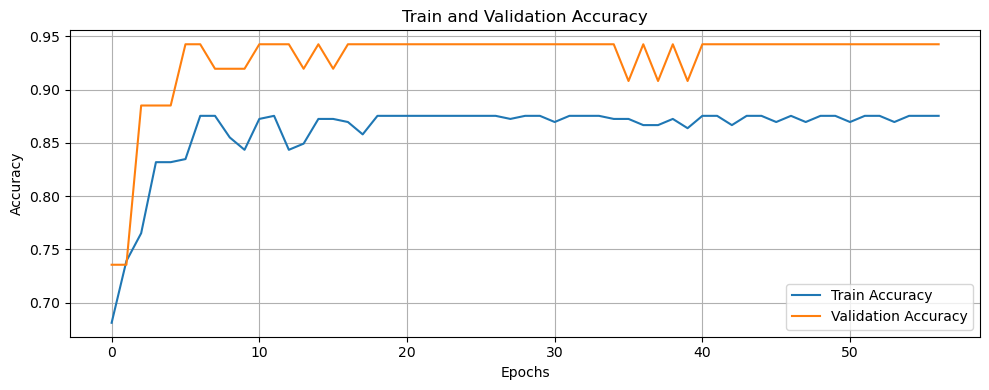

    LSTM (run 3): Accuracy = 0.8796, Precision = 0.8868, F1 = 0.8785
   ▶️ Run 4/10
Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6690 - loss: 0.8697 - val_accuracy: 0.6437 - val_loss: 0.8276 - learning_rate: 0.0010
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6819 - loss: 0.8073 - val_accuracy: 0.6437 - val_loss: 0.7492 - learning_rate: 0.0010
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7157 - loss: 0.7015 - val_accuracy: 0.7471 - val_loss: 0.6510 - learning_rate: 0.0010
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8305 - loss: 0.5554 - val_accuracy: 0.7931 - val_loss: 0.5996 - learning_rate: 0.0010
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8242 - loss: 0.5872 - val_accuracy: 0.7931 - val_loss: 0.5848 - learning_rate: 0.0010
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.8245 - loss: 0.5495 - val_accuracy: 0.8391 - val_loss: 0.5737 - learning_rate: 0.0010
Epoch 7/

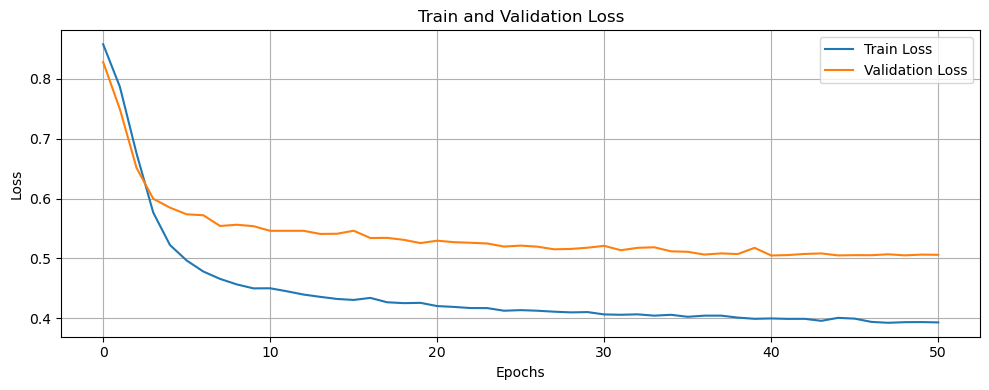

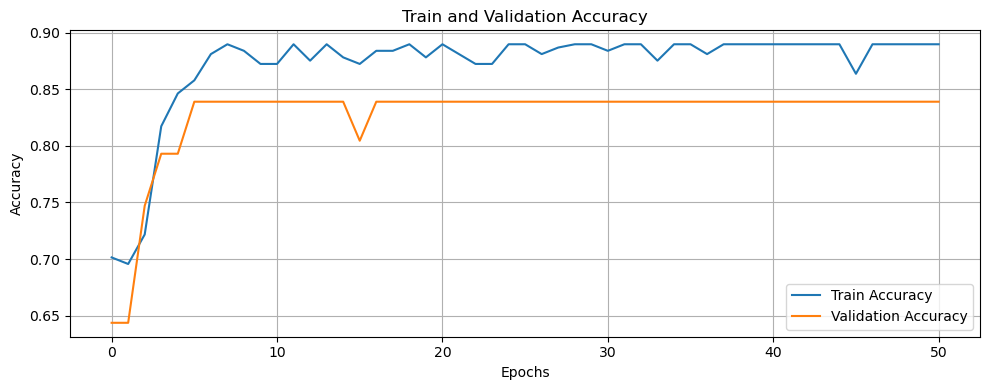

    LSTM (run 4): Accuracy = 0.9167, Precision = 0.9091, F1 = 0.9174
   ▶️ Run 5/10
Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6690 - loss: 0.8679 - val_accuracy: 0.7471 - val_loss: 0.8240 - learning_rate: 0.0010
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7597 - loss: 0.8024 - val_accuracy: 0.7011 - val_loss: 0.7297 - learning_rate: 0.0010
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7528 - loss: 0.6826 - val_accuracy: 0.7471 - val_loss: 0.6321 - learning_rate: 0.0010
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7942 - loss: 0.5792 - val_accuracy: 0.8161 - val_loss: 0.5935 - learning_rate: 0.0010
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8423 - loss: 0.5304 - val_accuracy: 0.8506 - val_loss: 0.5652 - learning_rate: 0.0010
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.8629 - loss: 0.5805 - val_accuracy: 0.8506 - val_loss: 0.5510 - learning_rate: 0.0010
Epoch 7/

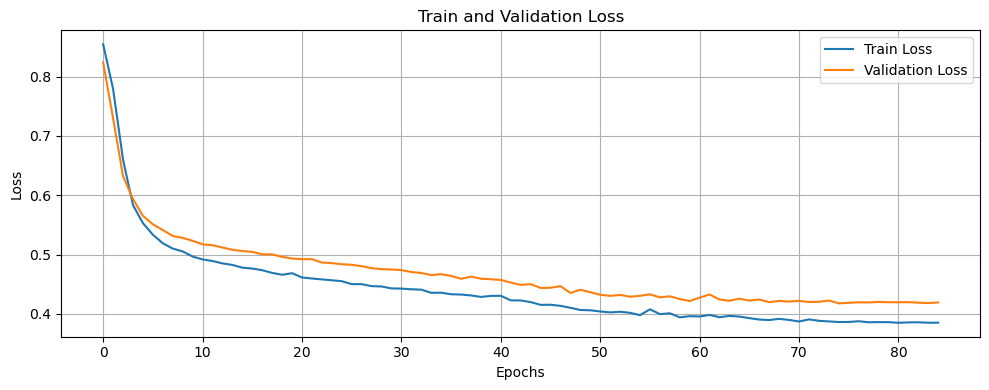

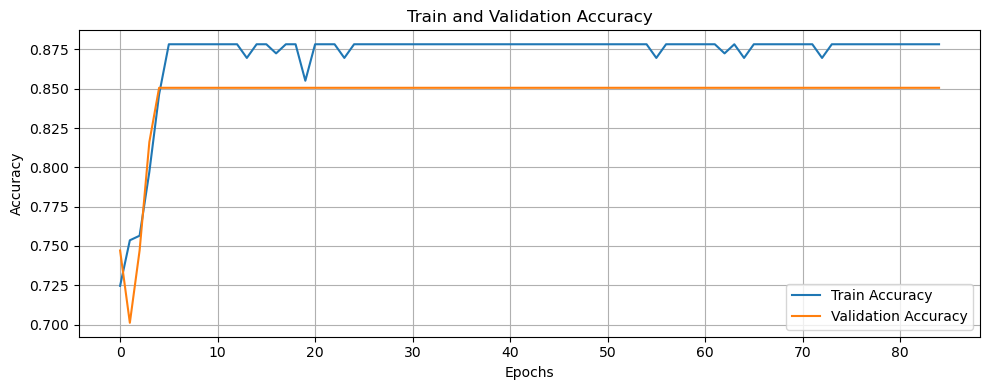

    LSTM (run 5): Accuracy = 0.9444, Precision = 0.9344, F1 = 0.9500
   ▶️ Run 6/10
Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6468 - loss: 0.8630 - val_accuracy: 0.8276 - val_loss: 0.8083 - learning_rate: 0.0010
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.8148 - loss: 0.7840 - val_accuracy: 0.8736 - val_loss: 0.6828 - learning_rate: 0.0010
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8187 - loss: 0.6668 - val_accuracy: 0.8736 - val_loss: 0.5527 - learning_rate: 0.0010
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8515 - loss: 0.5412 - val_accuracy: 0.8736 - val_loss: 0.4896 - learning_rate: 0.0010
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8812 - loss: 0.4921 - val_accuracy: 0.9195 - val_loss: 0.4782 - learning_rate: 0.0010
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8829 - loss: 0.4962 - val_accuracy: 0.9195 - val_loss: 0.4617 - learning_rate: 0.0010
Epoch 7/

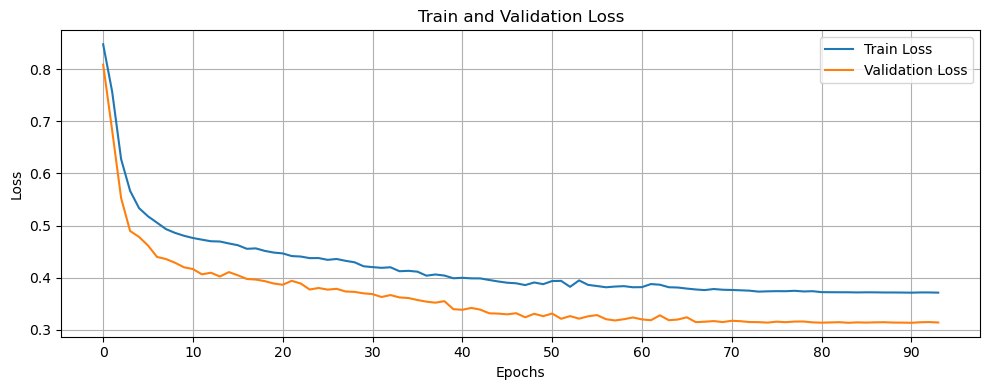

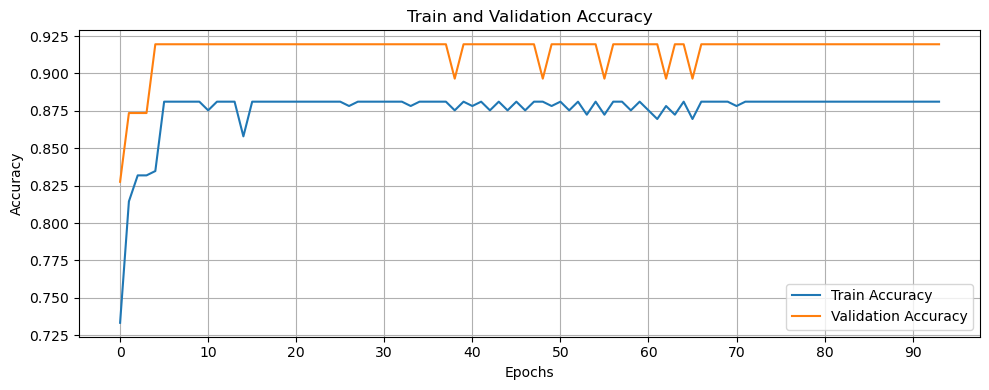

    LSTM (run 6): Accuracy = 0.8796, Precision = 0.9038, F1 = 0.8785
   ▶️ Run 7/10
Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6833 - loss: 0.8699 - val_accuracy: 0.7356 - val_loss: 0.8321 - learning_rate: 0.0010
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7553 - loss: 0.8061 - val_accuracy: 0.7126 - val_loss: 0.7584 - learning_rate: 0.0010
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8098 - loss: 0.6998 - val_accuracy: 0.7241 - val_loss: 0.6733 - learning_rate: 0.0010
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8568 - loss: 0.5478 - val_accuracy: 0.7816 - val_loss: 0.6479 - learning_rate: 0.0010
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8523 - loss: 0.4779 - val_accuracy: 0.8046 - val_loss: 0.6294 - learning_rate: 0.0010
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9095 - loss: 0.4598 - val_accuracy: 0.8046 - val_loss: 0.6208 - learning_rate: 0.0010
Epoch 7

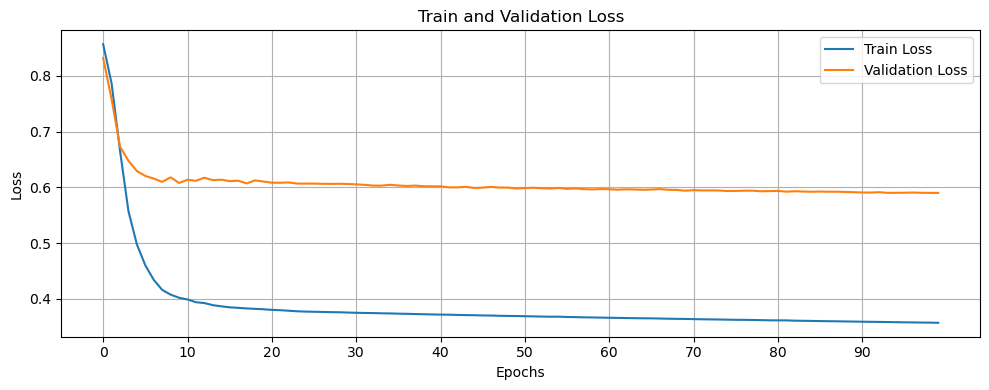

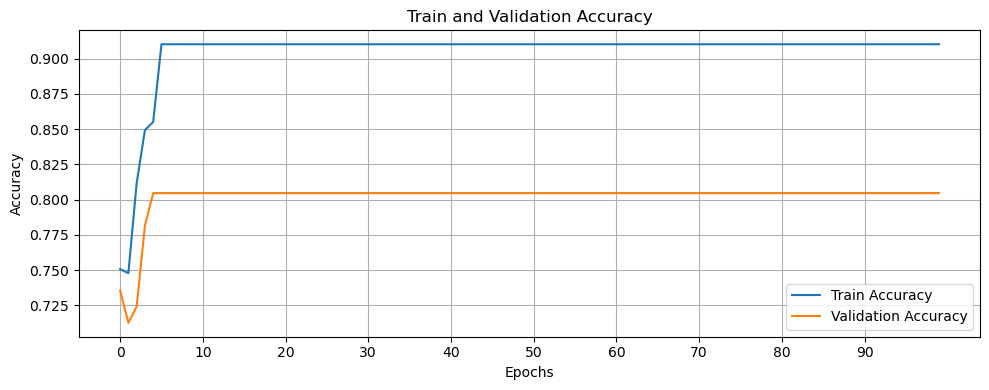

    LSTM (run 7): Accuracy = 0.8796, Precision = 0.8889, F1 = 0.8807
   ▶️ Run 8/10
Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.7027 - loss: 0.8675 - val_accuracy: 0.8046 - val_loss: 0.8288 - learning_rate: 0.0010
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8478 - loss: 0.8045 - val_accuracy: 0.8046 - val_loss: 0.7508 - learning_rate: 0.0010
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8400 - loss: 0.7012 - val_accuracy: 0.8046 - val_loss: 0.6556 - learning_rate: 0.0010
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8360 - loss: 0.5763 - val_accuracy: 0.8046 - val_loss: 0.6287 - learning_rate: 0.0010
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8302 - loss: 0.5490 - val_accuracy: 0.8046 - val_loss: 0.6145 - learning_rate: 0.0010
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8670 - loss: 0.4514 - val_accuracy: 0.8506 - val_loss: 0.6076 - learning_rate: 0.0010
Epoch 7

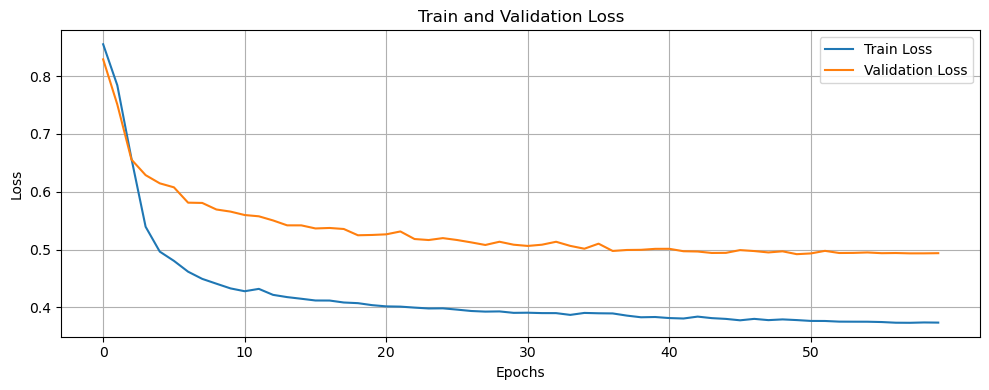

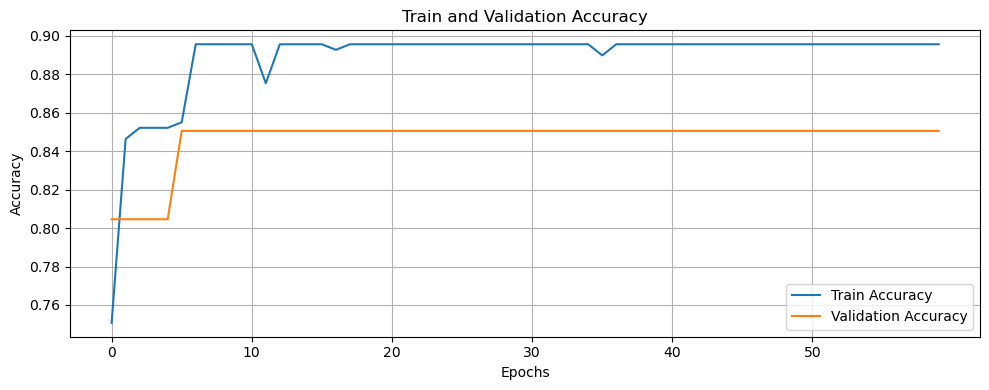

    LSTM (run 8): Accuracy = 0.8889, Precision = 0.8966, F1 = 0.8966
   ▶️ Run 9/10
Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6023 - loss: 0.8700 - val_accuracy: 0.8391 - val_loss: 0.8204 - learning_rate: 0.0010
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8662 - loss: 0.7958 - val_accuracy: 0.8621 - val_loss: 0.7169 - learning_rate: 0.0010
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8037 - loss: 0.7097 - val_accuracy: 0.8161 - val_loss: 0.5738 - learning_rate: 0.0010
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8288 - loss: 0.5761 - val_accuracy: 0.8391 - val_loss: 0.5194 - learning_rate: 0.0010
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8533 - loss: 0.5138 - val_accuracy: 0.8391 - val_loss: 0.4944 - learning_rate: 0.0010
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8713 - loss: 0.4784 - val_accuracy: 0.8391 - val_loss: 0.4758 - learning_rate: 0.0010
Epoch 7/

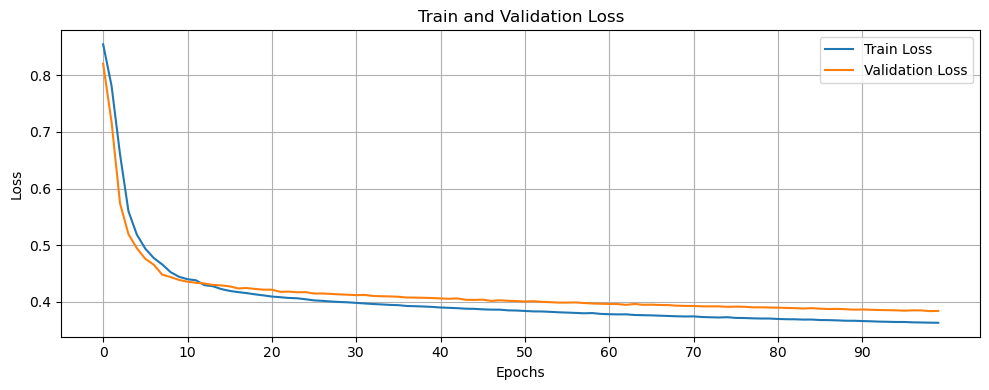

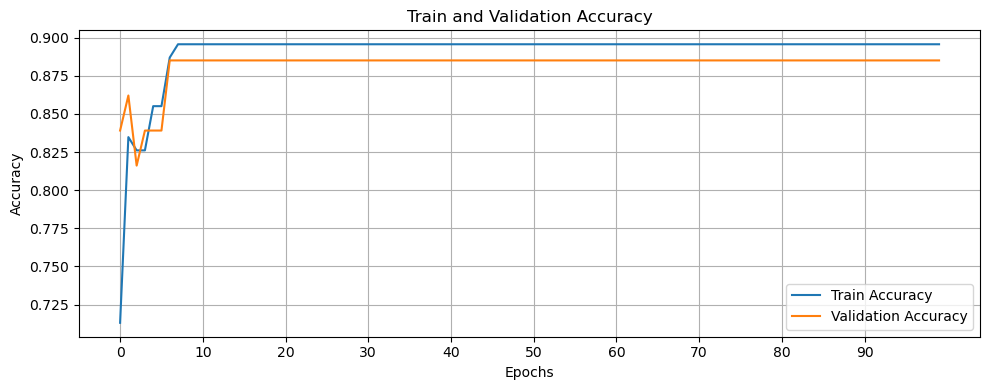

    LSTM (run 9): Accuracy = 0.8611, Precision = 0.8500, F1 = 0.8718
   ▶️ Run 10/10
Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6351 - loss: 0.8652 - val_accuracy: 0.7816 - val_loss: 0.8111 - learning_rate: 0.0010
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8603 - loss: 0.7706 - val_accuracy: 0.7931 - val_loss: 0.6925 - learning_rate: 0.0010
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8337 - loss: 0.6539 - val_accuracy: 0.8276 - val_loss: 0.5738 - learning_rate: 0.0010
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8890 - loss: 0.5068 - val_accuracy: 0.8276 - val_loss: 0.5221 - learning_rate: 0.0010
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9067 - loss: 0.4166 - val_accuracy: 0.8276 - val_loss: 0.5010 - learning_rate: 0.0010
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9033 - loss: 0.4523 - val_accuracy: 0.8966 - val_loss: 0.4768 - learning_rate: 0.0010
Epoch 7

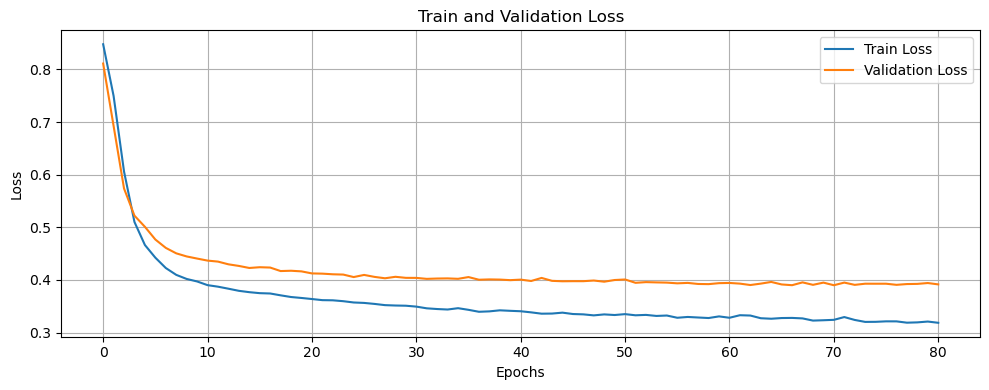

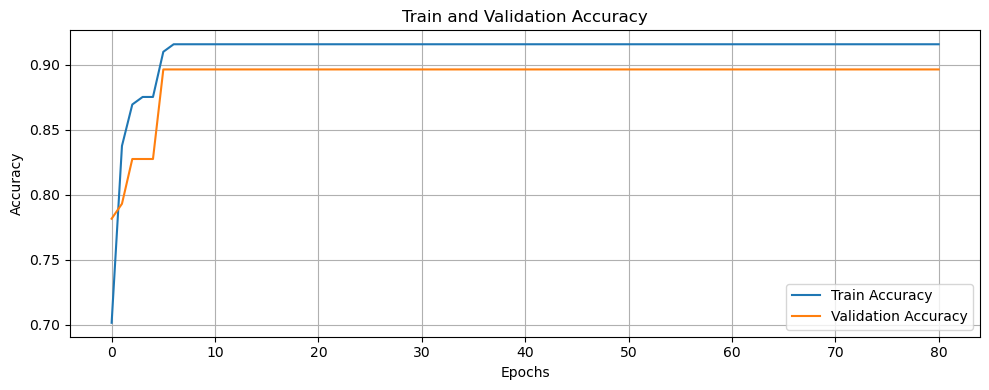

    LSTM (run 10): Accuracy = 0.7870, Precision = 0.8654, F1 = 0.7965

📊 Moyenne des 10 runs pour Laitue :
    ▶️ Accuracy  = 0.8861
    ▶️ Precision = 0.8984
    ▶️ F1-score  = 0.8888

🌾 Culture : Oignon
   ▶️ Run 1/10
Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1744s 39ms/step - accuracy: 0.5301 - loss: 0.8748 - val_accuracy: 0.6351 - val_loss: 0.8216 - learning_rate: 0.0010
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6672 - loss: 0.8011 - val_accuracy: 0.6486 - val_loss: 0.7443 - learning_rate: 0.0010
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6453 - loss: 0.7286 - val_accuracy: 0.6486 - val_loss: 0.7004 - learning_rate: 0.0010
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6416 - loss: 0.6987 - val_accuracy: 0.6486 - val_loss: 0.6839 - learning_rate: 0.0010
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6318 - loss: 0.6854 - val_accuracy: 0.6486 - val_loss: 0.6728 - learning_rate: 0.0010
Epoch 6/100
37/37 ━━━

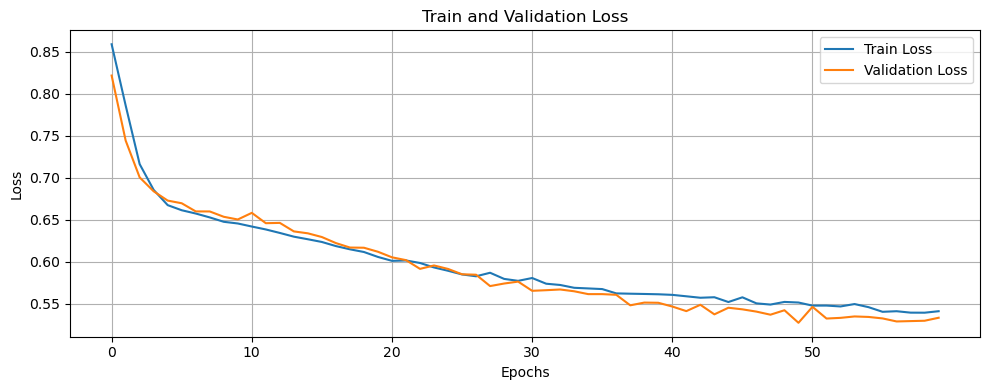

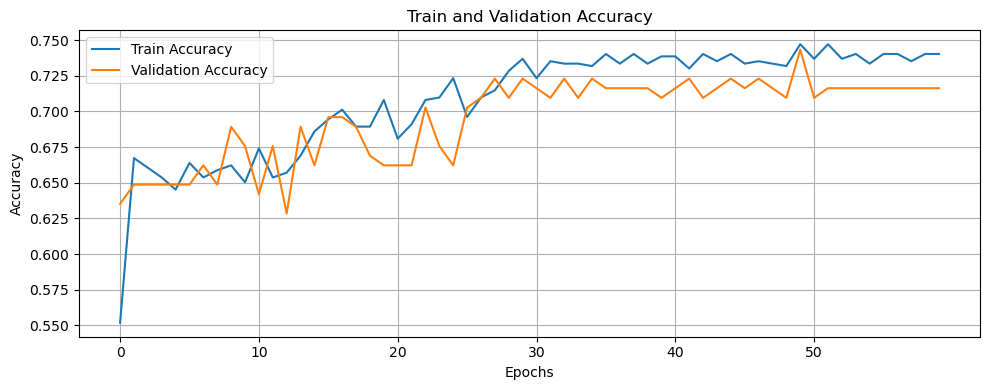

    LSTM (run 1): Accuracy = 0.7514, Precision = 0.7935, F1 = 0.7604
   ▶️ Run 2/10
Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - accuracy: 0.5749 - loss: 0.8706 - val_accuracy: 0.5946 - val_loss: 0.8097 - learning_rate: 0.0010
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6511 - loss: 0.7825 - val_accuracy: 0.6014 - val_loss: 0.7399 - learning_rate: 0.0010
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6465 - loss: 0.7033 - val_accuracy: 0.6284 - val_loss: 0.7122 - learning_rate: 0.0010
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6546 - loss: 0.6696 - val_accuracy: 0.6149 - val_loss: 0.6959 - learning_rate: 0.0010
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6489 - loss: 0.6673 - val_accuracy: 0.6284 - val_loss: 0.6906 - learning_rate: 0.0010
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6535 - loss: 0.6457 - val_accuracy: 0.6014 - val_loss: 0.6923 - learning_rate: 0.0010
Epoch 7/

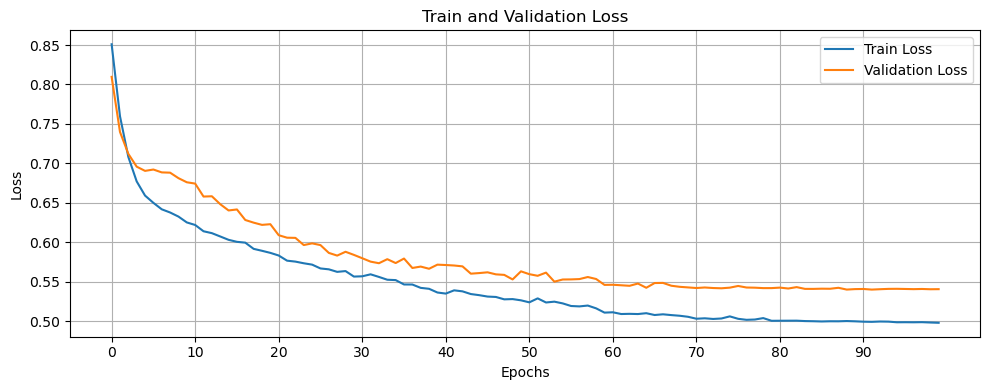

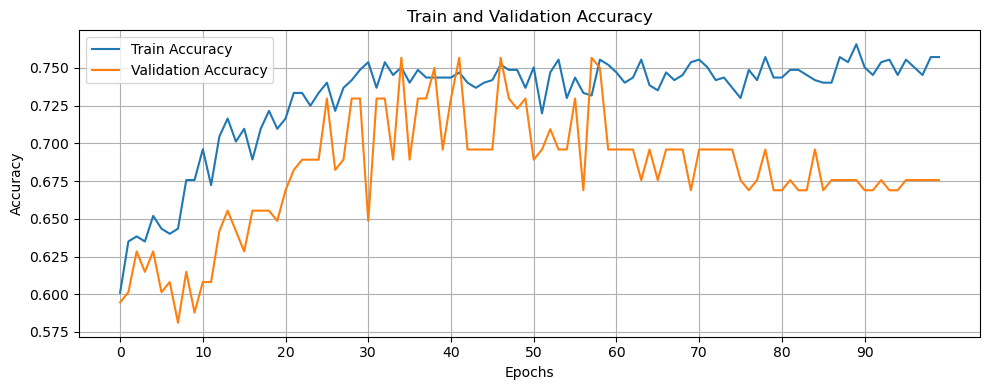

    LSTM (run 2): Accuracy = 0.6919, Precision = 0.7711, F1 = 0.6919
   ▶️ Run 3/10
Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - accuracy: 0.5589 - loss: 0.8741 - val_accuracy: 0.6689 - val_loss: 0.8201 - learning_rate: 0.0010
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6695 - loss: 0.7984 - val_accuracy: 0.6284 - val_loss: 0.7436 - learning_rate: 0.0010
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6989 - loss: 0.7148 - val_accuracy: 0.6284 - val_loss: 0.6986 - learning_rate: 0.0010
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6879 - loss: 0.6770 - val_accuracy: 0.6284 - val_loss: 0.6757 - learning_rate: 0.0010
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7008 - loss: 0.6440 - val_accuracy: 0.6284 - val_loss: 0.6647 - learning_rate: 0.0010
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6628 - loss: 0.6572 - val_accuracy: 0.6284 - val_loss: 0.6594 - learning_rate: 0.0010
Epoch 7/

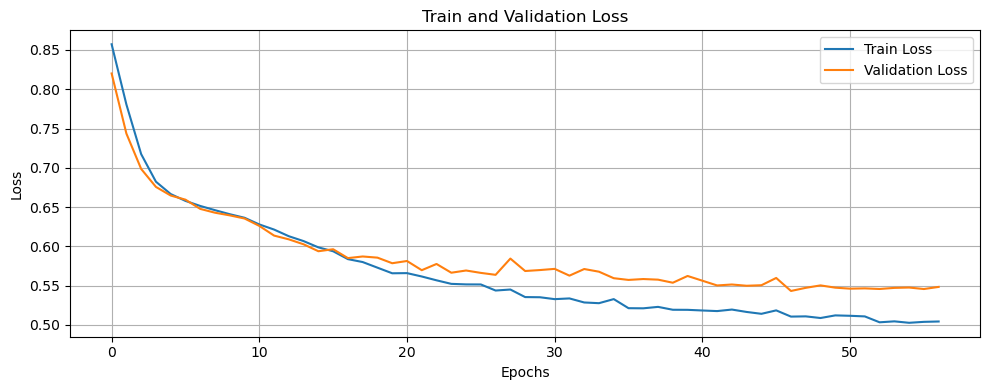

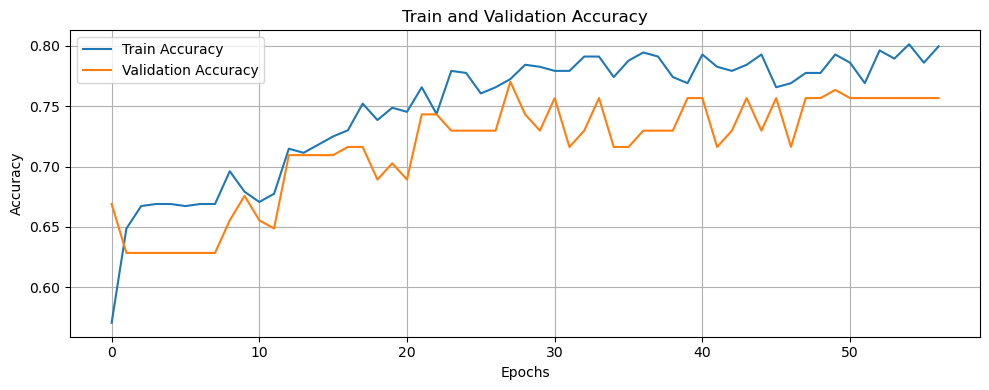

    LSTM (run 3): Accuracy = 0.6595, Precision = 0.7600, F1 = 0.6441
   ▶️ Run 4/10
Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.5493 - loss: 0.8753 - val_accuracy: 0.7838 - val_loss: 0.8101 - learning_rate: 0.0010
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6749 - loss: 0.7838 - val_accuracy: 0.7838 - val_loss: 0.7018 - learning_rate: 0.0010
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6656 - loss: 0.7180 - val_accuracy: 0.7297 - val_loss: 0.6558 - learning_rate: 0.0010
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7123 - loss: 0.6790 - val_accuracy: 0.7838 - val_loss: 0.6349 - learning_rate: 0.0010
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6922 - loss: 0.6814 - val_accuracy: 0.7905 - val_loss: 0.6190 - learning_rate: 0.0010
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6699 - loss: 0.6672 - val_accuracy: 0.7162 - val_loss: 0.6199 - learning_rate: 0.0010
Epoch 7/

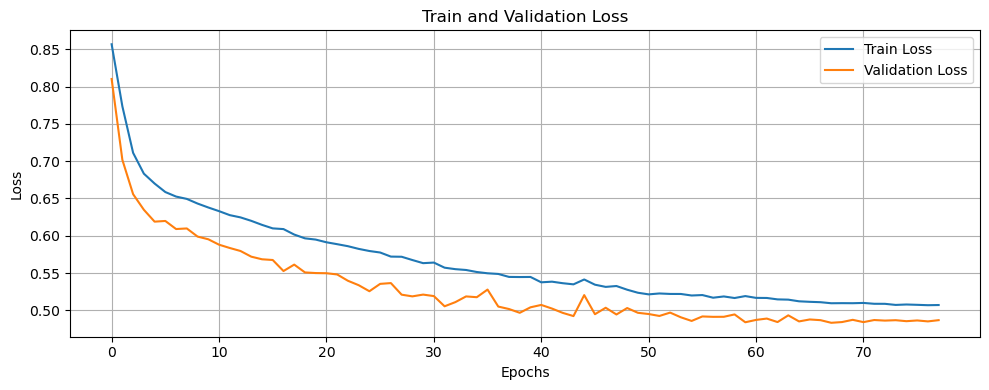

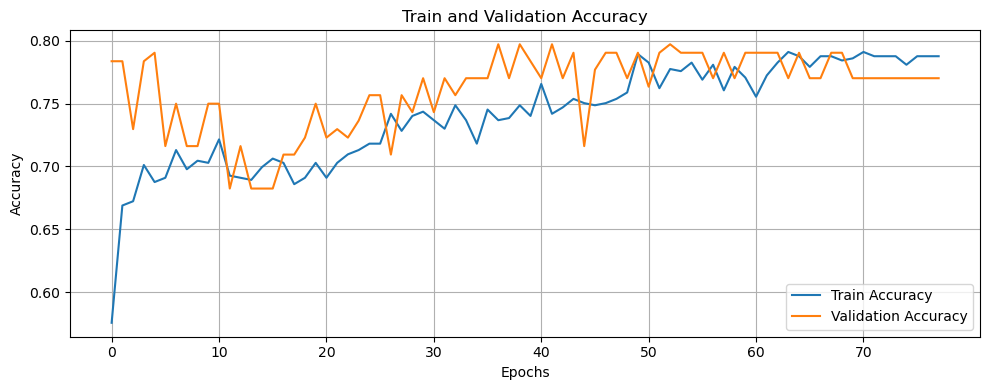

    LSTM (run 4): Accuracy = 0.7568, Precision = 0.7900, F1 = 0.7783
   ▶️ Run 5/10
Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.5191 - loss: 0.8734 - val_accuracy: 0.5676 - val_loss: 0.8245 - learning_rate: 0.0010
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7267 - loss: 0.7981 - val_accuracy: 0.5946 - val_loss: 0.7595 - learning_rate: 0.0010
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6632 - loss: 0.7227 - val_accuracy: 0.5878 - val_loss: 0.7185 - learning_rate: 0.0010
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6904 - loss: 0.6657 - val_accuracy: 0.5946 - val_loss: 0.7034 - learning_rate: 0.0010
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6792 - loss: 0.6612 - val_accuracy: 0.5878 - val_loss: 0.6909 - learning_rate: 0.0010
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6654 - loss: 0.6475 - val_accuracy: 0.5946 - val_loss: 0.6874 - learning_rate: 0.0010
Epoch 7/

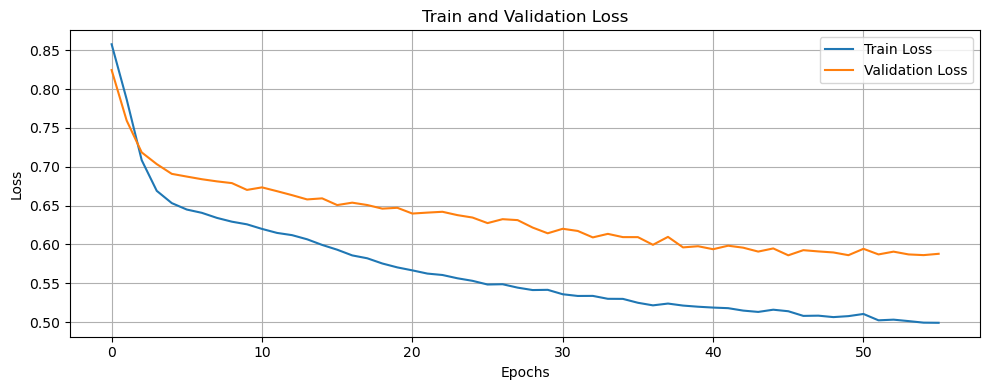

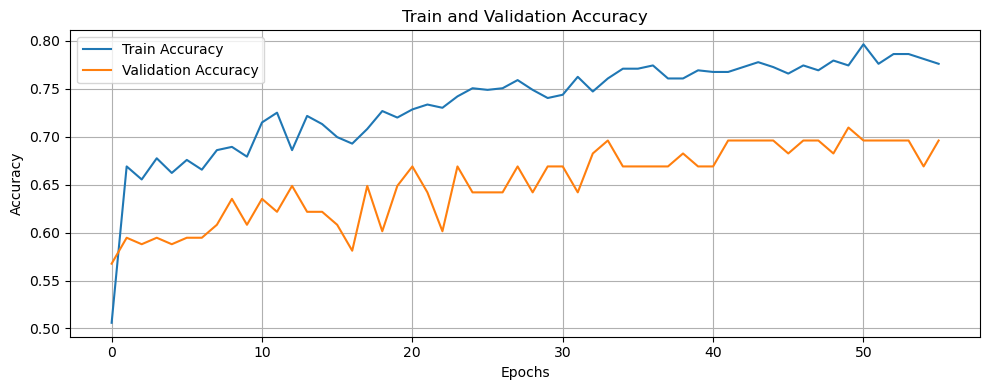

    LSTM (run 5): Accuracy = 0.7027, Precision = 0.7024, F1 = 0.6821
   ▶️ Run 6/10
Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - accuracy: 0.5559 - loss: 0.8714 - val_accuracy: 0.6554 - val_loss: 0.8254 - learning_rate: 0.0010
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6717 - loss: 0.7779 - val_accuracy: 0.6081 - val_loss: 0.7639 - learning_rate: 0.0010
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6770 - loss: 0.7157 - val_accuracy: 0.5811 - val_loss: 0.7311 - learning_rate: 0.0010
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6697 - loss: 0.6829 - val_accuracy: 0.6081 - val_loss: 0.7079 - learning_rate: 0.0010
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6666 - loss: 0.6528 - val_accuracy: 0.6081 - val_loss: 0.6958 - learning_rate: 0.0010
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6618 - loss: 0.6665 - val_accuracy: 0.6081 - val_loss: 0.6970 - learning_rate: 0.0010
Epoch 7/

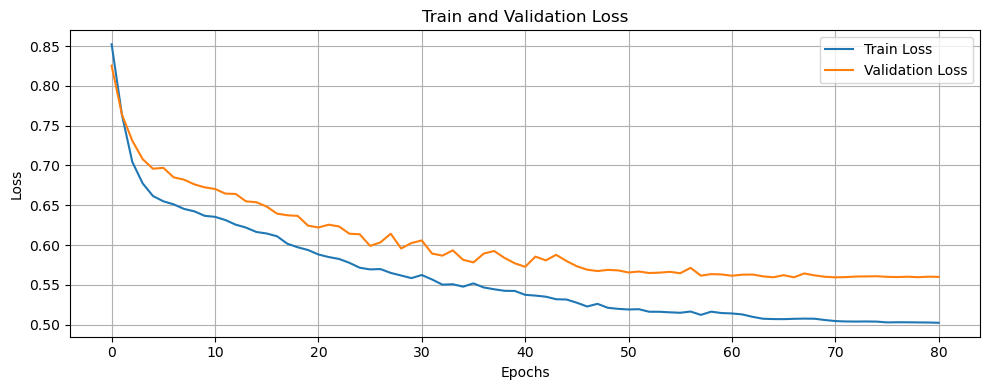

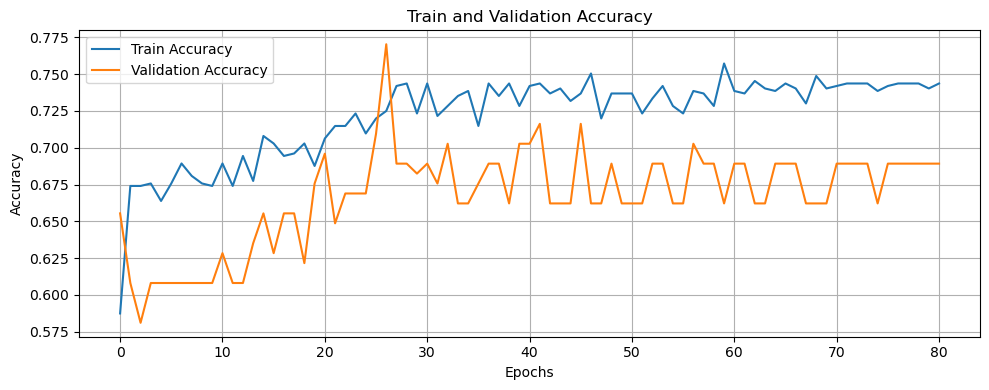

    LSTM (run 6): Accuracy = 0.6973, Precision = 0.7867, F1 = 0.6782
   ▶️ Run 7/10
Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - accuracy: 0.5554 - loss: 0.8738 - val_accuracy: 0.5811 - val_loss: 0.8224 - learning_rate: 0.0010
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6649 - loss: 0.7904 - val_accuracy: 0.5946 - val_loss: 0.7565 - learning_rate: 0.0010
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6735 - loss: 0.7054 - val_accuracy: 0.5946 - val_loss: 0.7382 - learning_rate: 0.0010
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6545 - loss: 0.6848 - val_accuracy: 0.5946 - val_loss: 0.7098 - learning_rate: 0.0010
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6476 - loss: 0.6688 - val_accuracy: 0.5946 - val_loss: 0.7055 - learning_rate: 0.0010
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6340 - loss: 0.6529 - val_accuracy: 0.5608 - val_loss: 0.6983 - learning_rate: 0.0010
Epoch 7/

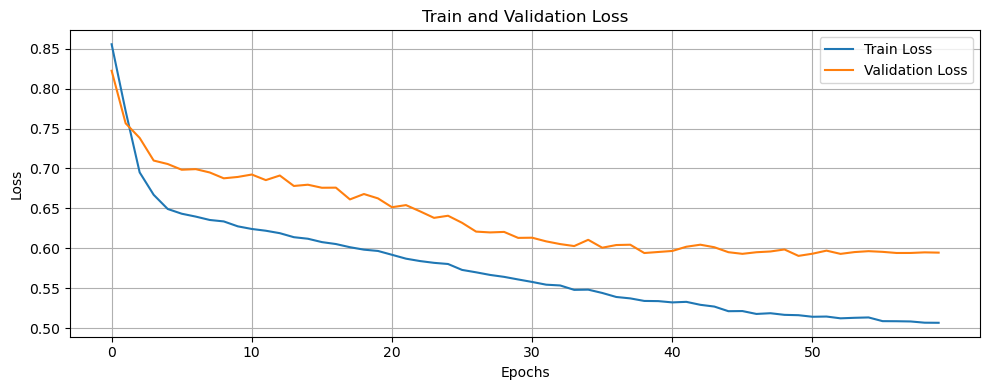

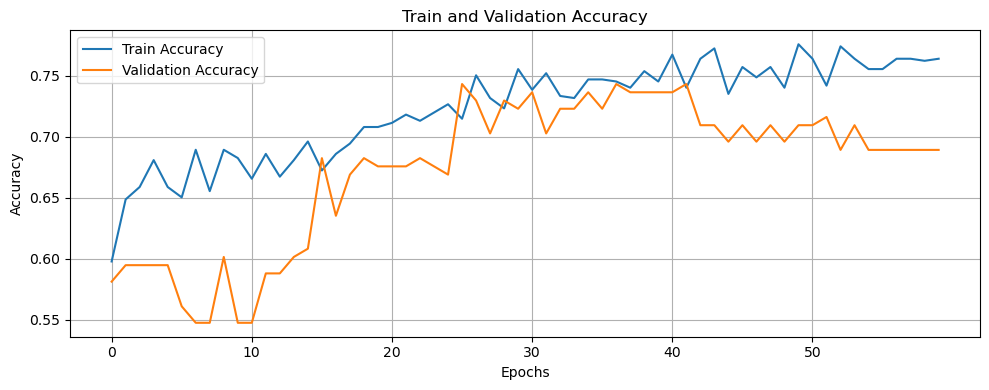

    LSTM (run 7): Accuracy = 0.7351, Precision = 0.7470, F1 = 0.7168
   ▶️ Run 8/10
Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - accuracy: 0.5118 - loss: 0.8755 - val_accuracy: 0.6014 - val_loss: 0.8159 - learning_rate: 0.0010
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6410 - loss: 0.7852 - val_accuracy: 0.6216 - val_loss: 0.7270 - learning_rate: 0.0010
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6308 - loss: 0.7139 - val_accuracy: 0.6689 - val_loss: 0.6788 - learning_rate: 0.0010
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6282 - loss: 0.6797 - val_accuracy: 0.6216 - val_loss: 0.6603 - learning_rate: 0.0010
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6625 - loss: 0.6574 - val_accuracy: 0.6689 - val_loss: 0.6493 - learning_rate: 0.0010
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6662 - loss: 0.6431 - val_accuracy: 0.6689 - val_loss: 0.6418 - learning_rate: 0.0010
Epoch 7/

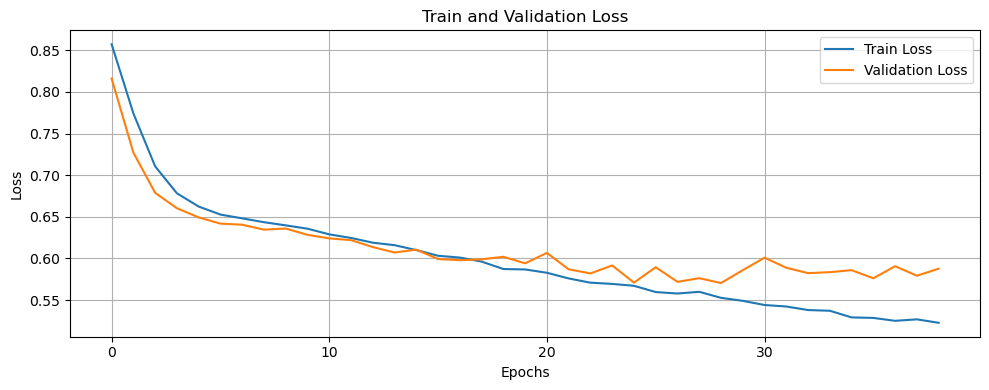

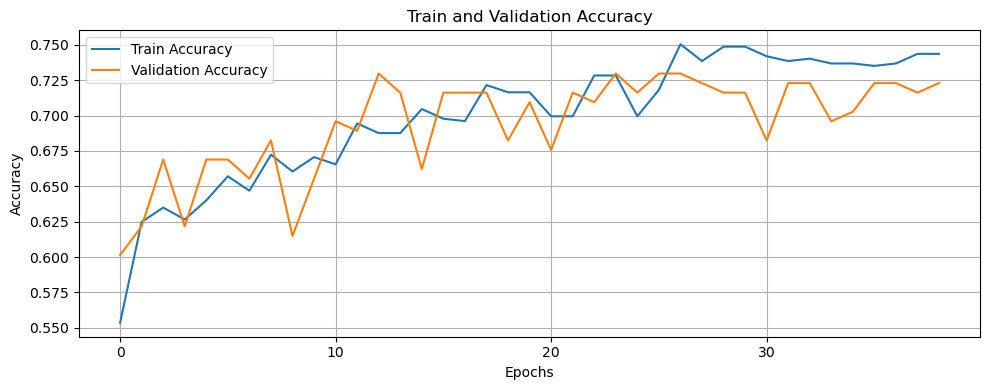

    LSTM (run 8): Accuracy = 0.7514, Precision = 0.8571, F1 = 0.7416
   ▶️ Run 9/10
Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - accuracy: 0.5836 - loss: 0.8750 - val_accuracy: 0.6216 - val_loss: 0.8239 - learning_rate: 0.0010
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6881 - loss: 0.8035 - val_accuracy: 0.6486 - val_loss: 0.7524 - learning_rate: 0.0010
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6594 - loss: 0.7269 - val_accuracy: 0.6216 - val_loss: 0.6927 - learning_rate: 0.0010
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6382 - loss: 0.6894 - val_accuracy: 0.6216 - val_loss: 0.6706 - learning_rate: 0.0010
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6618 - loss: 0.6542 - val_accuracy: 0.6216 - val_loss: 0.6650 - learning_rate: 0.0010
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6513 - loss: 0.6441 - val_accuracy: 0.6081 - val_loss: 0.6571 - learning_rate: 0.0010
Epoch 7/

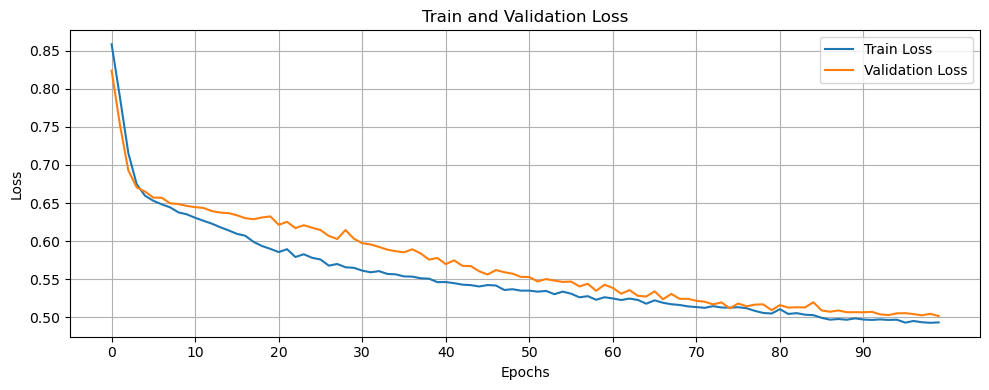

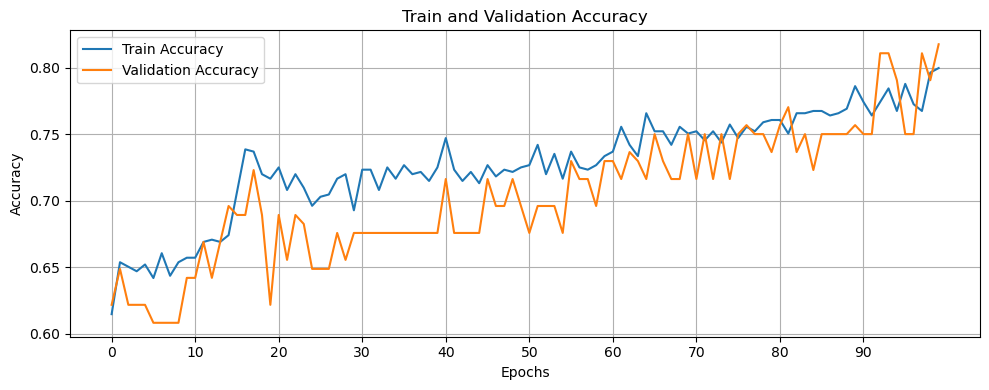

    LSTM (run 9): Accuracy = 0.8000, Precision = 0.7653, F1 = 0.8021
   ▶️ Run 10/10
Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.4968 - loss: 0.8776 - val_accuracy: 0.6284 - val_loss: 0.8266 - learning_rate: 0.0010
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6227 - loss: 0.8001 - val_accuracy: 0.6014 - val_loss: 0.7559 - learning_rate: 0.0010
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6076 - loss: 0.7338 - val_accuracy: 0.6081 - val_loss: 0.7244 - learning_rate: 0.0010
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6449 - loss: 0.6843 - val_accuracy: 0.6284 - val_loss: 0.6987 - learning_rate: 0.0010
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6698 - loss: 0.6599 - val_accuracy: 0.6554 - val_loss: 0.6903 - learning_rate: 0.0010
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6848 - loss: 0.6612 - val_accuracy: 0.6554 - val_loss: 0.6830 - learning_rate: 0.0010
Epoch 7

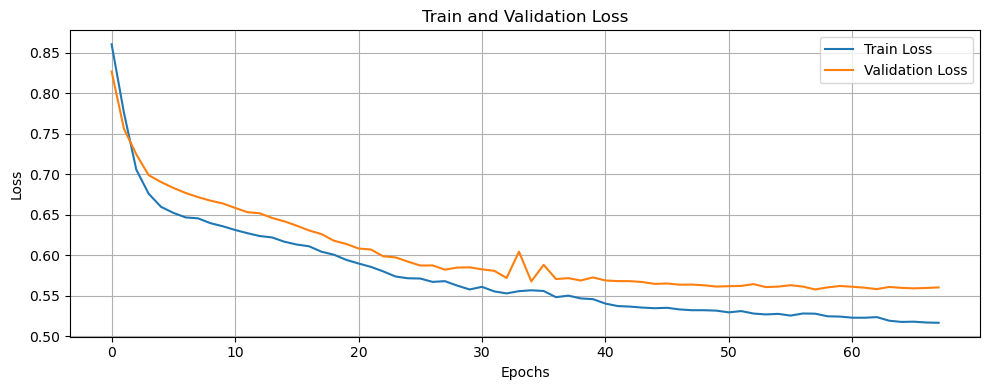

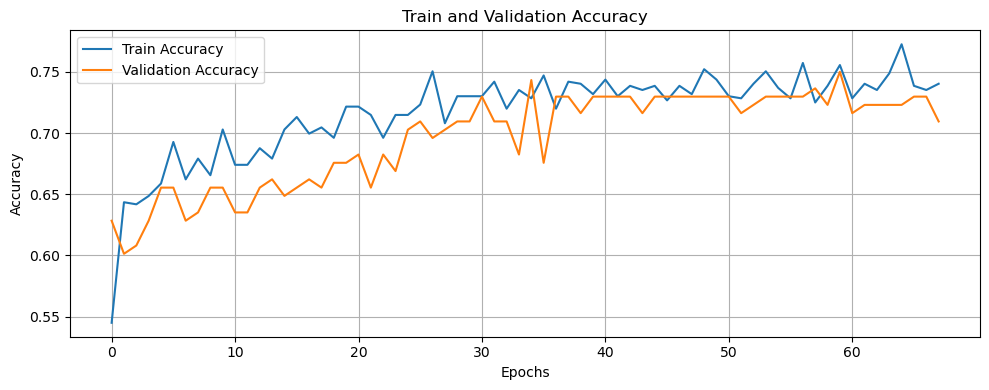

    LSTM (run 10): Accuracy = 0.7676, Precision = 0.8043, F1 = 0.7749

📊 Moyenne des 10 runs pour Oignon :
    ▶️ Accuracy  = 0.7314
    ▶️ Precision = 0.7777
    ▶️ F1-score  = 0.7270


In [17]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, f1_score
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras import regularizers
import tensorflow as tf
import numpy as np

def LSTMClassificationModel(x, y, show_plot=False):
    from sklearn.decomposition import PCA
    from sklearn.preprocessing import StandardScaler, MinMaxScaler
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import accuracy_score, precision_score, f1_score
    import tensorflow as tf
    import matplotlib.pyplot as plt

    # 1. Standardisation
    scaler_std = StandardScaler()
    x_std = scaler_std.fit_transform(x)

    # 4. y → numpy array + binarisation
    y = y.values if hasattr(y, 'values') else y
    y = (y >= 0.5).astype(int)

    # 5. Split train/test
    x_train, x_test, y_train, y_test = train_test_split(x_std, y, test_size=0.2, shuffle=True)

    # 6. Reshape pour LSTM (timesteps=1)
    x_train = x_train.reshape((x_train.shape[0], 1, x_train.shape[1]))
    x_test = x_test.reshape((x_test.shape[0], 1, x_test.shape[1]))

    # 7. Modèle LSTM
    model = tf.keras.Sequential([
        tf.keras.Input(shape=(1, x_train.shape[2])),
        tf.keras.layers.LSTM(64, return_sequences=True, kernel_regularizer=regularizers.l1(0.0002)),
        tf.keras.layers.LSTM(32, return_sequences=False, kernel_regularizer=regularizers.l1(0.0002)),
        #tf.keras.layers.BatchNormalization(),
        #tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(16, activation='tanh', kernel_regularizer=regularizers.l1(0.0002)),
        tf.keras.layers.Dense(8, activation='tanh', kernel_regularizer=regularizers.l1(0.0002)),
        #tf.keras.layers.BatchNormalization(),
        #tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # 8. Early stopping
    early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True,  verbose=1)

    # 9. Entraînement
    reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',       # métrique à surveiller
    factor=0.5,               # multiplier le lr par ce facteur (ex: 0.001 ➝ 0.0005)
    patience=5,               # attendre 5 epochs sans amélioration
    min_lr=1e-6,              # ne pas descendre en-dessous de cette valeur
    verbose=1
)
    
    history = model.fit(
        x_train, y_train,
        epochs=100,
        batch_size=16,
        validation_split=0.2,
        callbacks=[reduce_lr, early_stop],
    )

    # 10. Évaluation
    y_pred = (model.predict(x_test).flatten() >= 0.5).astype(int)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # 11. Affichage des courbes
    if show_plot:
        plt.figure(figsize=(10, 4))
        plt.plot(history.history["loss"], label="Train Loss")
        plt.plot(history.history["val_loss"], label="Validation Loss")
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.title("Train and Validation Loss")
        plt.xticks(np.arange(0, len(history.history['loss']), 10))  # ✅ ici
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(10, 4))
        plt.plot(history.history["accuracy"], label="Train Accuracy")
        plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
        plt.xlabel("Epochs")
        plt.ylabel("Accuracy")
        plt.title("Train and Validation Accuracy")
        plt.xticks(np.arange(0, len(history.history['accuracy']), 10))  # ✅ ici
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    return acc, prec, f1
    
N_RUNS = 10
for crop in DATASETS:
    print(f"\n🌾 Culture : {crop}")
    x, y = preprocess_data_classification(crop, DATASETS[crop]["y"], DATASETS[crop]["x"])

    acc_list, prec_list, f1_list = [], [], []

    for run in range(N_RUNS):
        print(f"   ▶️ Run {run + 1}/{N_RUNS}")
        acc, prec, f1 = LSTMClassificationModel(x, y, show_plot=True)
        acc_list.append(acc)
        prec_list.append(prec)
        f1_list.append(f1)
        print(f"    LSTM (run {run+1}): Accuracy = {acc:.4f}, Precision = {prec:.4f}, F1 = {f1:.4f}")

    # Moyennes
    print(f"\n📊 Moyenne des {N_RUNS} runs pour {crop} :")
    print(f"    ▶️ Accuracy  = {np.mean(acc_list):.4f}")
    print(f"    ▶️ Precision = {np.mean(prec_list):.4f}")
    print(f"    ▶️ F1-score  = {np.mean(f1_list):.4f}")

# RNN GRU

In [18]:
# Re-import necessary libraries after kernel reset
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, f1_score
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt

# Fix random seed
torch.manual_seed(32)
np.random.seed(32)


###################################
## Modèle GRU pour classification
###################################


#Define the GRU classifier model
class GRUClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim=64, num_layers=2, dropout=0.3):
        super(GRUClassifier, self).__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, num_layers,
                          batch_first=True, dropout=dropout)
        self.fc = nn.Sequential(
            nn.Linear(hidden_dim, 32),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        _, h_n = self.gru(x)
        return self.fc(h_n[-1])

# Define the training and evaluation function

def train_gru_classification_model(x, y, n_runs=10):
    acc_list, prec_list, f1_list = [], [], []
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    for run in range(n_runs):
        print(f"▶️ Run {run+1}/{n_runs}")
        
        scaler = StandardScaler()
        x_scaled = scaler.fit_transform(x)
        x = x_scaled
        y = y.values if hasattr(y, 'values') else y
        y = (y / max(y)).astype(np.float32)

        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True)

        x_train = torch.tensor(x_train[:, np.newaxis, :], dtype=torch.float32)
        x_test = torch.tensor(x_test[:, np.newaxis, :], dtype=torch.float32)
        y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
        y_test = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)

        train_dataset = TensorDataset(x_train, y_train)
        test_dataset = TensorDataset(x_test, y_test)
        train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
        test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

        model = GRUClassifier(input_dim=x.shape[1]).to(device)
        criterion = nn.BCELoss()
        optimizer = optim.Adam(model.parameters(), lr=0.001)

        # 🟡 Suivi des pertes pour les courbes
        train_losses = []
        val_losses = []
        train_accuracies = []
        val_accuracies = []

        model.train()

        patience = 5
        best_val_loss = float('inf')
        epochs_no_improve = 0
        best_model_state = None
        
        for epoch in range(100):
            epoch_loss = 0
            all_preds, all_trues = [], []

            # --- Entraînement ---
            model.train()
            for inputs, targets in train_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, targets)

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                epoch_loss += loss.item()
                all_preds += outputs.detach().cpu().numpy().flatten().tolist()
                all_trues += targets.cpu().numpy().flatten().tolist()

            # 🟩 Accuracy entraînement
            preds_bin = (np.array(all_preds) >= 0.5).astype(int)
            acc_epoch = accuracy_score(all_trues, preds_bin)

            train_losses.append(epoch_loss / len(train_loader))
            train_accuracies.append(acc_epoch)

            # --- Validation (test) ---
            model.eval()
            val_loss = 0
            val_preds, val_trues = [], []
            with torch.no_grad():
                for inputs, targets in test_loader:
                    inputs, targets = inputs.to(device), targets.to(device)
                    outputs = model(inputs)
                    loss = criterion(outputs, targets)
                    val_loss += loss.item()
                    val_preds += outputs.cpu().numpy().flatten().tolist()
                    val_trues += targets.cpu().numpy().flatten().tolist()

            val_preds_bin = (np.array(val_preds) >= 0.5).astype(int)
            val_acc = accuracy_score(val_trues, val_preds_bin)

            val_losses.append(val_loss / len(test_loader))
            val_accuracies.append(val_acc)

            # ✅ Ajouter ceci juste après l'évaluation
            acc_list.append(val_acc)
            prec_list.append(precision_score(val_trues, val_preds_bin))
            f1_list.append(f1_score(val_trues, val_preds_bin))

            # === Early Stopping check (✅ À placer ici)
            if val_losses[-1] < best_val_loss:
                best_val_loss = val_losses[-1]
                epochs_no_improve = 0
                best_model_state = model.state_dict()
            else:
               epochs_no_improve += 1
               if epochs_no_improve >= patience:
                   print(f"⏹️ Early stopping triggered at epoch {epoch + 1}")
                   break


            # Charger le meilleur modèle si applicable
            if best_model_state is not None:
                 model.load_state_dict(best_model_state)

            if run == n_runs - 1:
                plt.figure(figsize=(10, 4))
                plt.plot(train_losses, label="Train Loss")
                plt.plot(val_losses, label="Validation Loss")
                plt.xticks(np.arange(0, len(train_losses), 10))
                plt.title("Train and Validation Loss")
                plt.xlabel("Epochs")
                plt.ylabel("Loss")
                plt.grid(True)
                plt.legend()
                plt.tight_layout()
                plt.show()
 
                plt.figure(figsize=(10, 4))
                plt.plot(train_accuracies, label="Train Accuracy")
                plt.plot(val_accuracies, label="Validation Accuracy")
                plt.xticks(np.arange(0, len(train_accuracies), 10))
                plt.title(" Train and Validation Accuracy")
                plt.xlabel("Epochs")
                plt.ylabel("Accuracy")
                plt.grid(True)
                plt.legend()
                plt.tight_layout()
                plt.show
                
    return np.mean(acc_list), np.mean(prec_list), np.mean(f1_list)

C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\torch\utils\_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(



🌾 Culture : Carotte
▶️ Run 1/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


⏹️ Early stopping triggered at epoch 29
▶️ Run 2/10
⏹️ Early stopping triggered at epoch 39
▶️ Run 3/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


⏹️ Early stopping triggered at epoch 9
▶️ Run 4/10
⏹️ Early stopping triggered at epoch 44
▶️ Run 5/10
⏹️ Early stopping triggered at epoch 14
▶️ Run 6/10
⏹️ Early stopping triggered at epoch 18
▶️ Run 7/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


⏹️ Early stopping triggered at epoch 10
▶️ Run 8/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


⏹️ Early stopping triggered at epoch 10
▶️ Run 9/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


⏹️ Early stopping triggered at epoch 14
▶️ Run 10/10


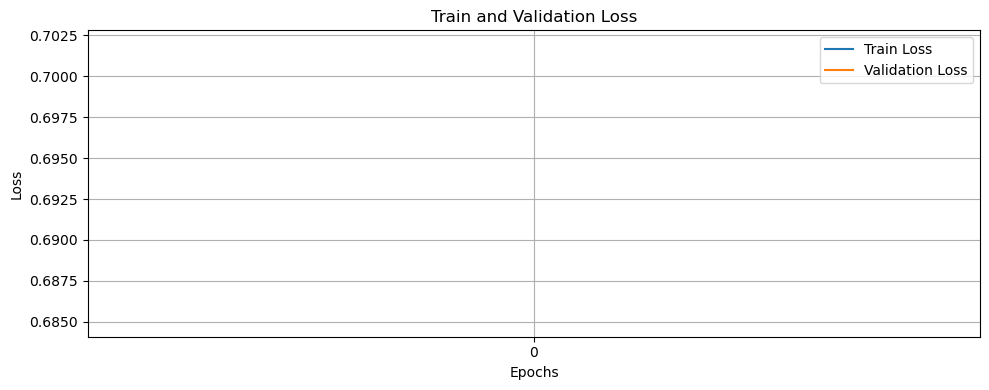

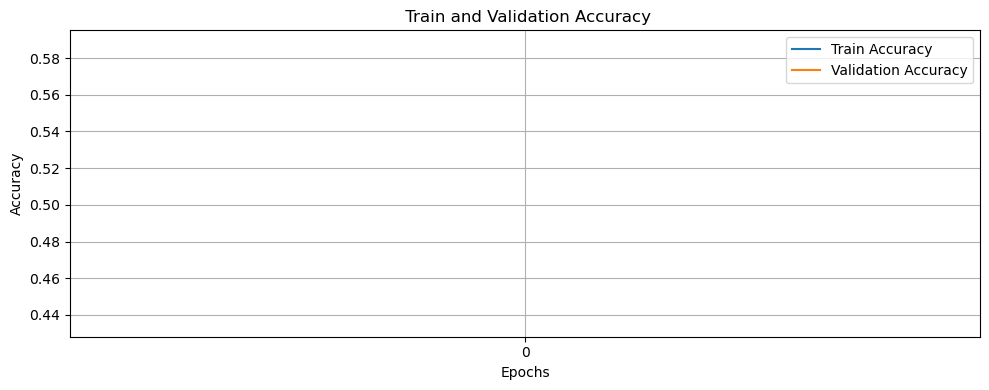

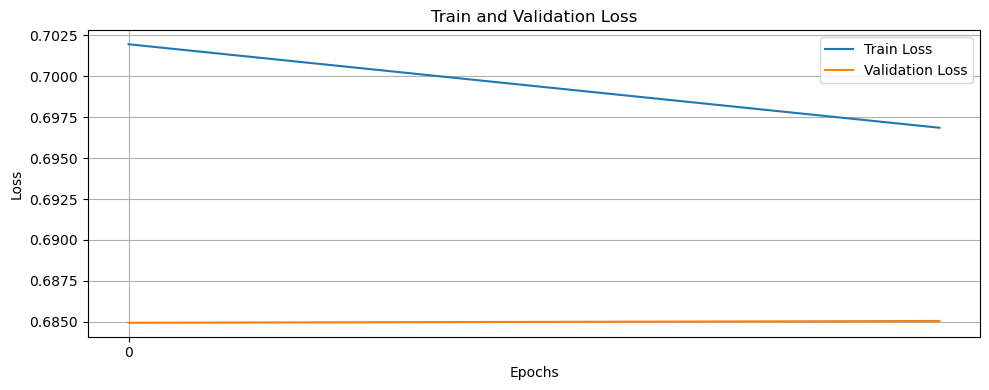

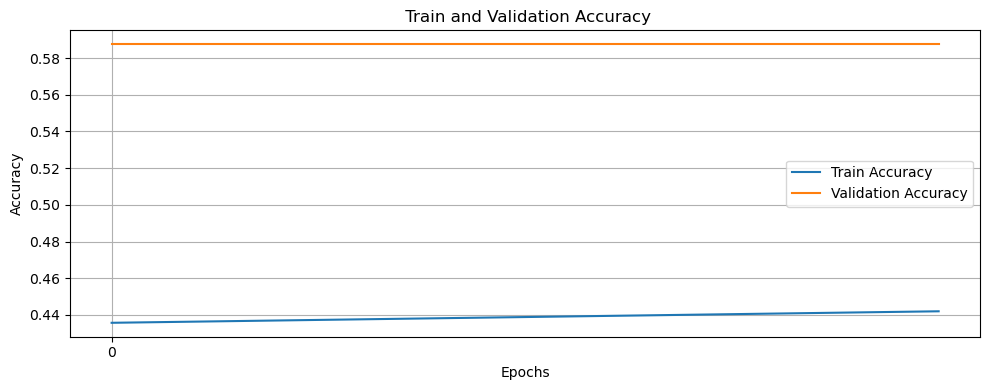

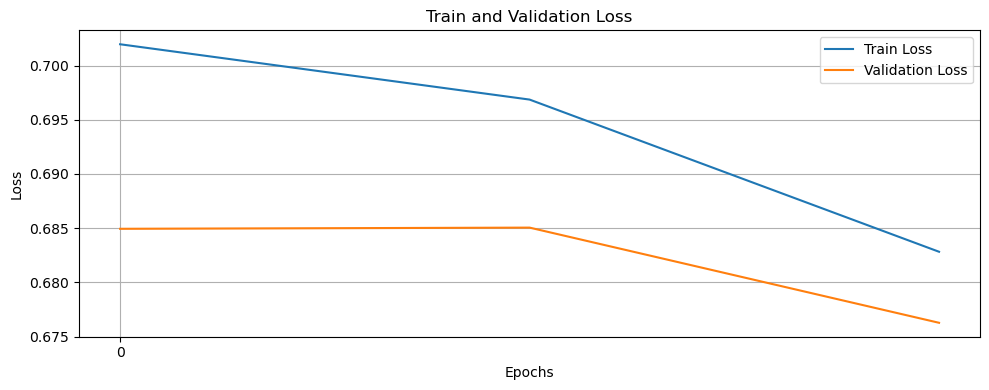

...

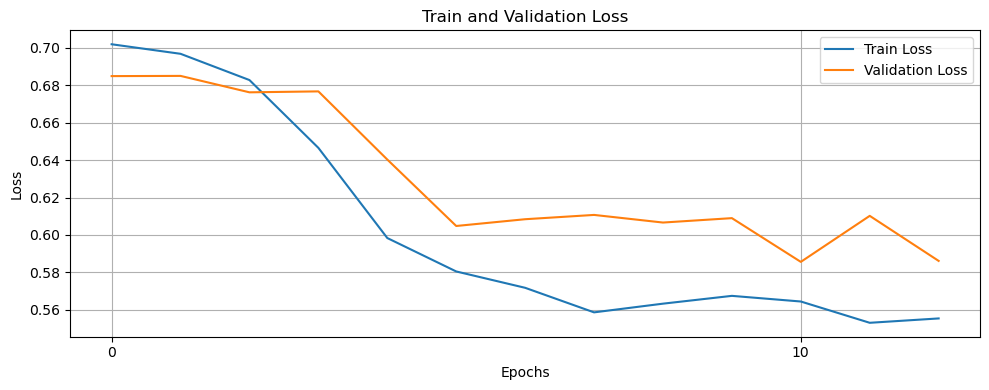

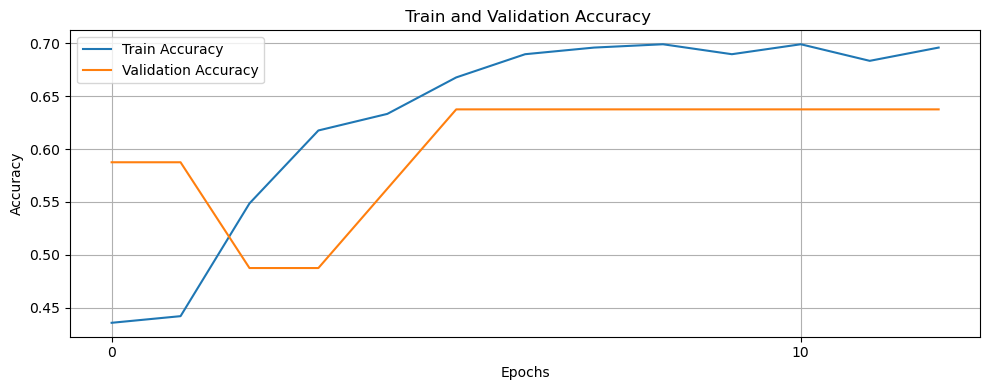

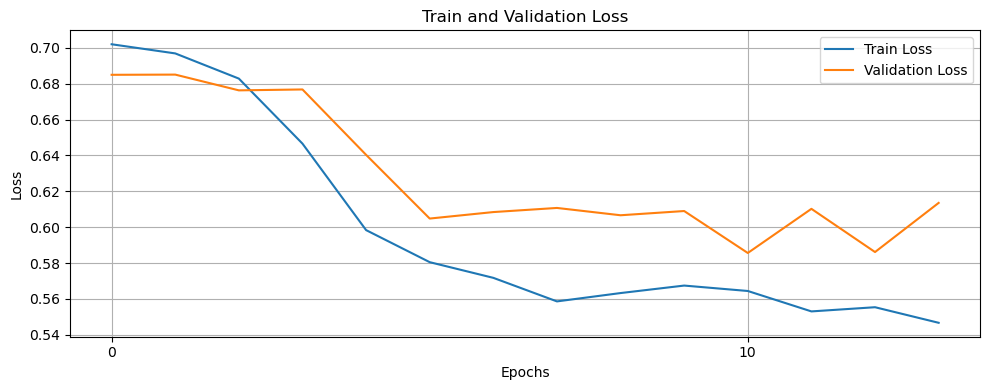

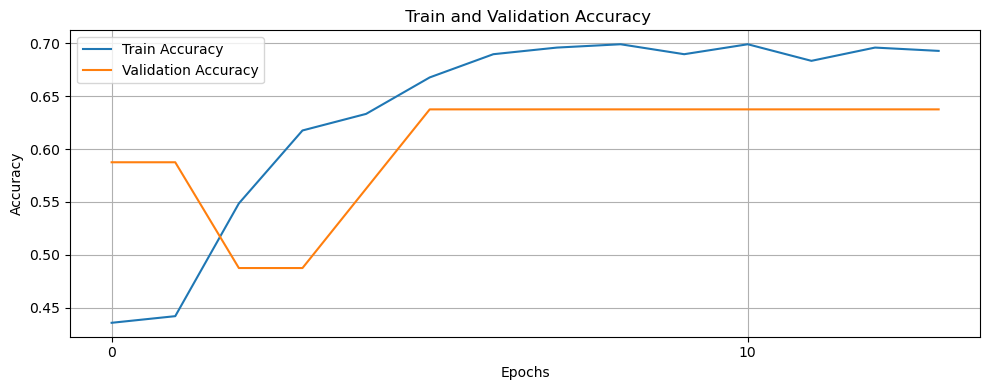

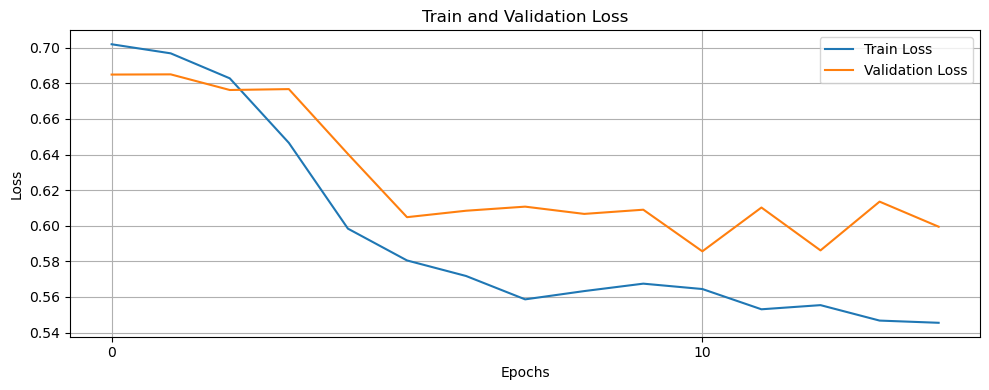

⏹️ Early stopping triggered at epoch 16
📊 Moyennes pour Carotte après 10 runs :
    Accuracy  = 0.6946
    Precision = 0.6133
    F1-score  = 0.6696

🌾 Culture : Laitue
▶️ Run 1/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


⏹️ Early stopping triggered at epoch 27
▶️ Run 2/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


⏹️ Early stopping triggered at epoch 36
▶️ Run 3/10
⏹️ Early stopping triggered at epoch 42
▶️ Run 4/10
⏹️ Early stopping triggered at epoch 40
▶️ Run 5/10
⏹️ Early stopping triggered at epoch 42
▶️ Run 6/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


⏹️ Early stopping triggered at epoch 51
▶️ Run 7/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


⏹️ Early stopping triggered at epoch 41
▶️ Run 8/10
⏹️ Early stopping triggered at epoch 37
▶️ Run 9/10
⏹️ Early stopping triggered at epoch 26
▶️ Run 10/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


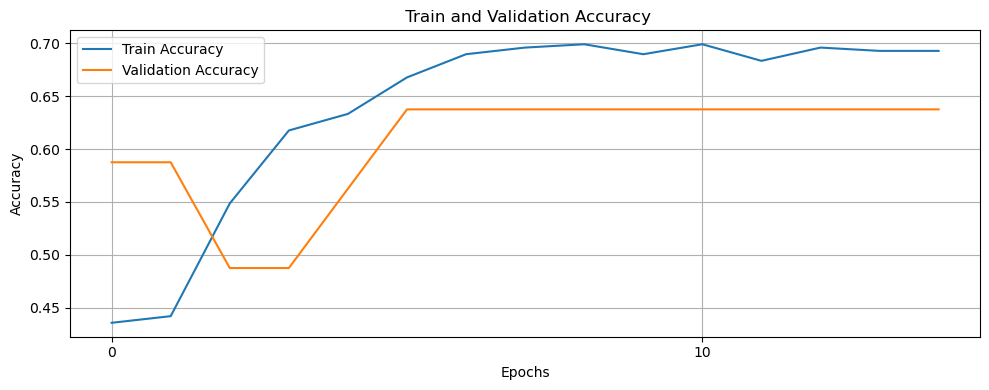

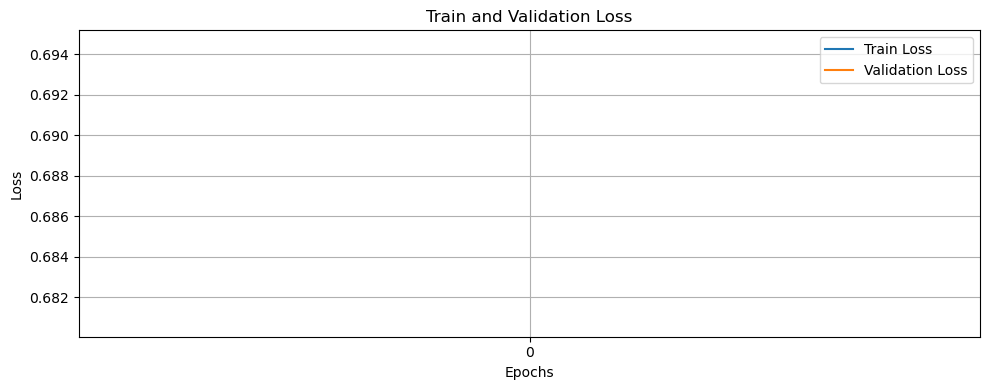

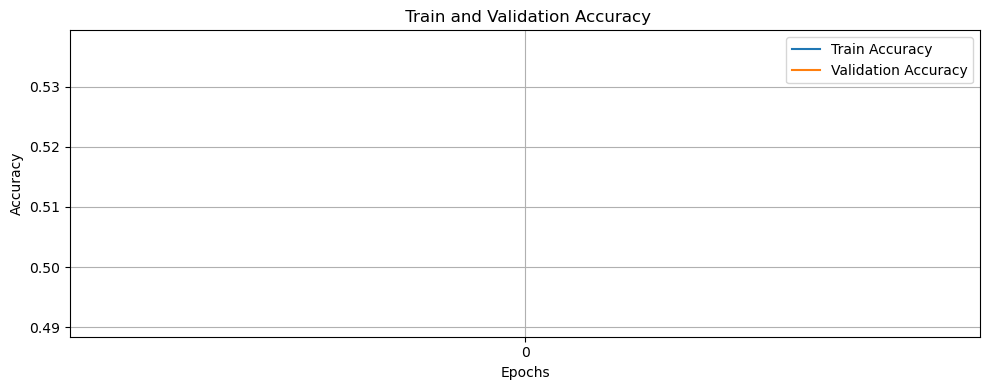

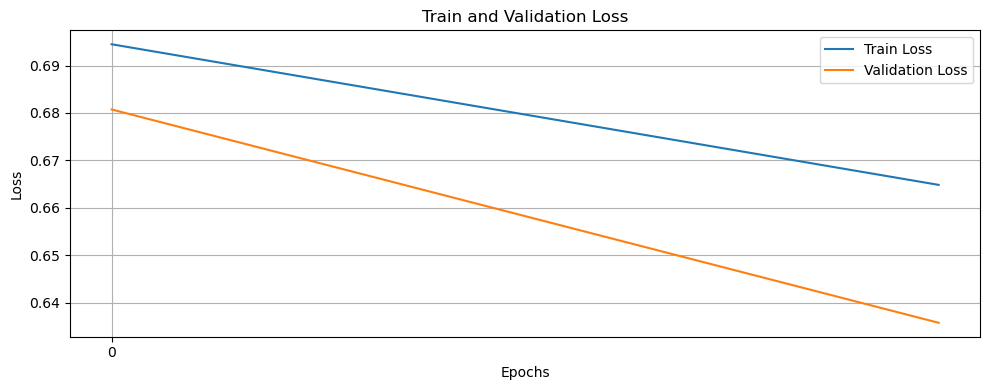

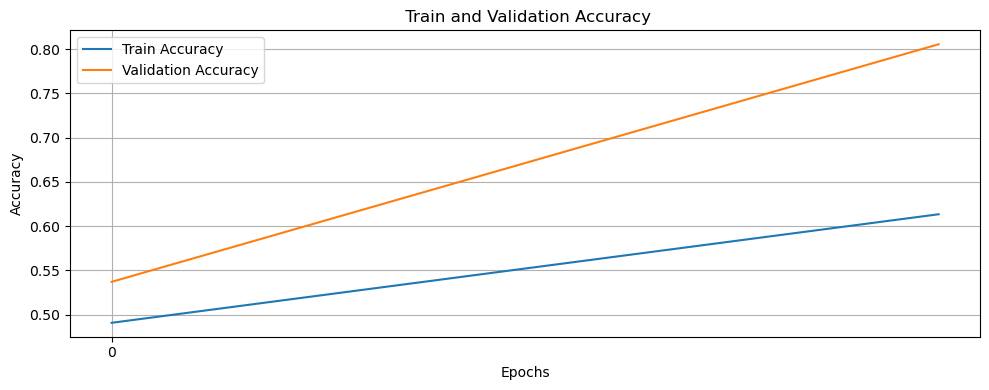

...

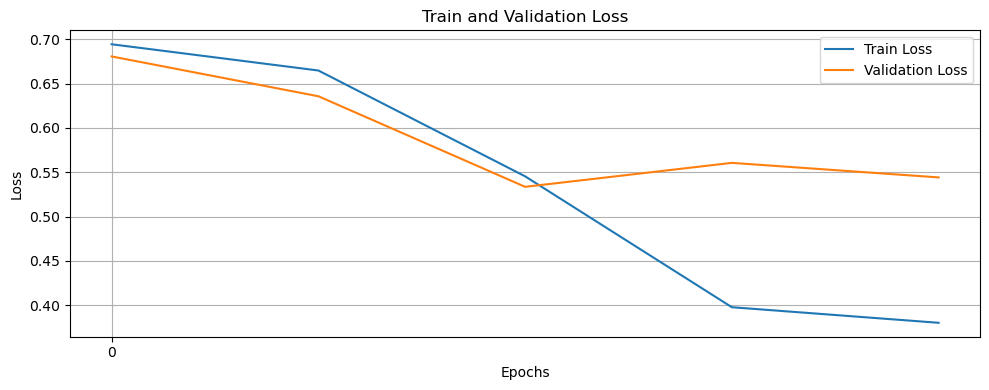

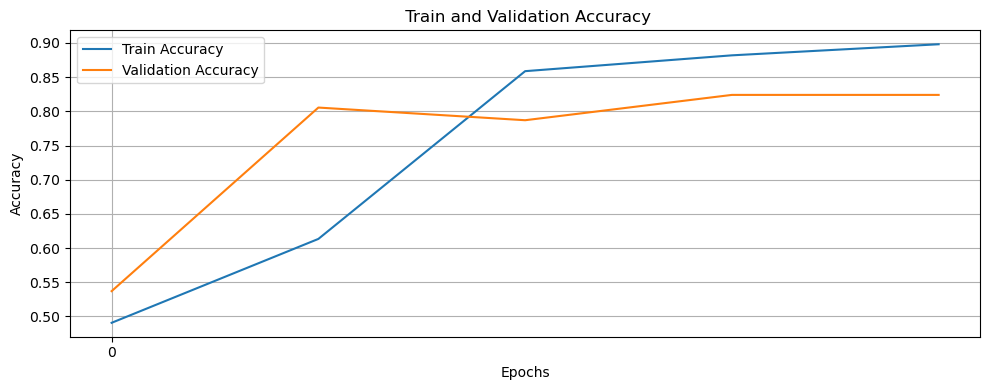

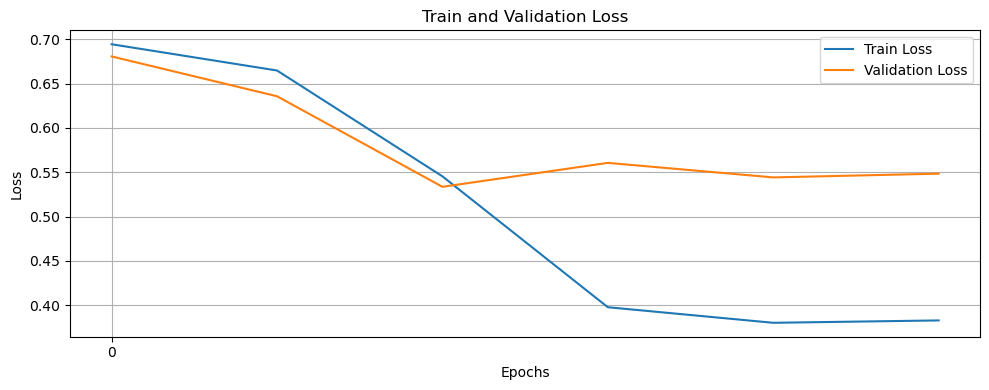

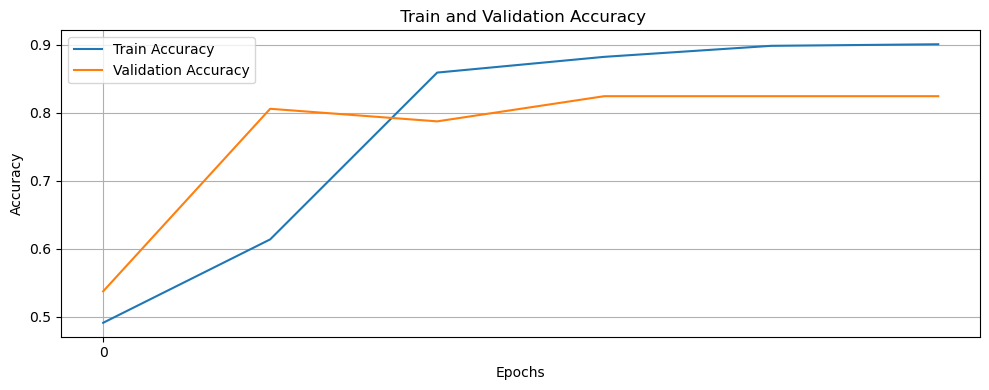

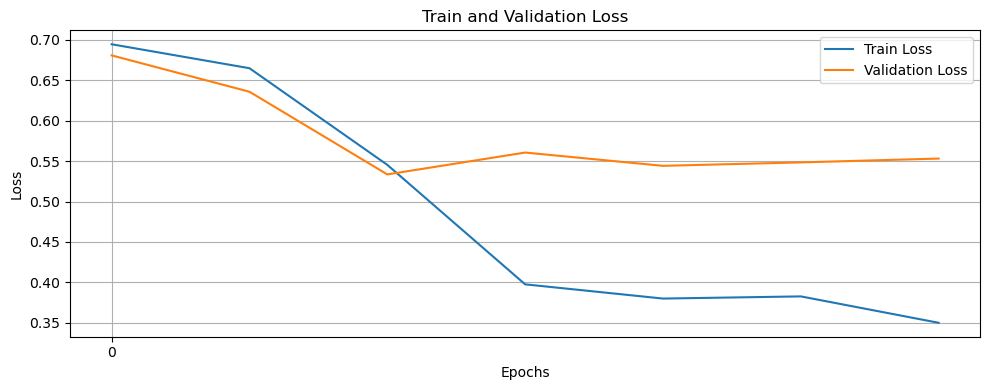

⏹️ Early stopping triggered at epoch 8
📊 Moyennes pour Laitue après 10 runs :
    Accuracy  = 0.8607
    Precision = 0.8461
    F1-score  = 0.8483

🌾 Culture : Oignon
▶️ Run 1/10
⏹️ Early stopping triggered at epoch 25
▶️ Run 2/10
⏹️ Early stopping triggered at epoch 17
▶️ Run 3/10
⏹️ Early stopping triggered at epoch 17
▶️ Run 4/10
⏹️ Early stopping triggered at epoch 18
▶️ Run 5/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


⏹️ Early stopping triggered at epoch 22
▶️ Run 6/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


⏹️ Early stopping triggered at epoch 70
▶️ Run 7/10
⏹️ Early stopping triggered at epoch 15
▶️ Run 8/10
⏹️ Early stopping triggered at epoch 27
▶️ Run 9/10


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


⏹️ Early stopping triggered at epoch 45
▶️ Run 10/10


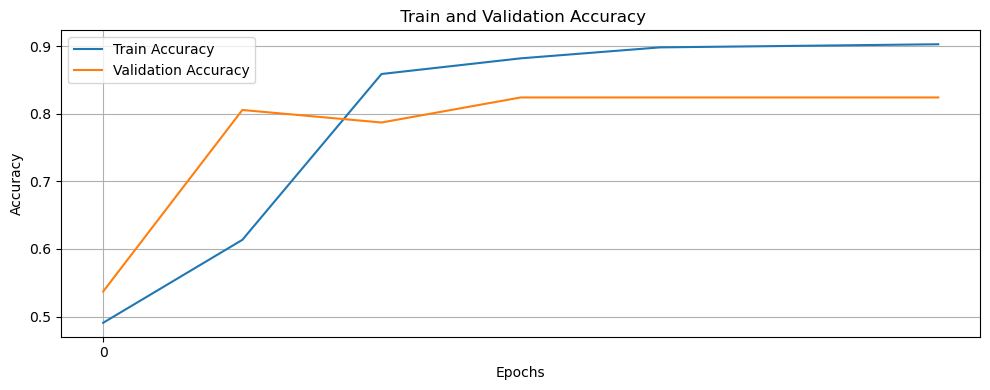

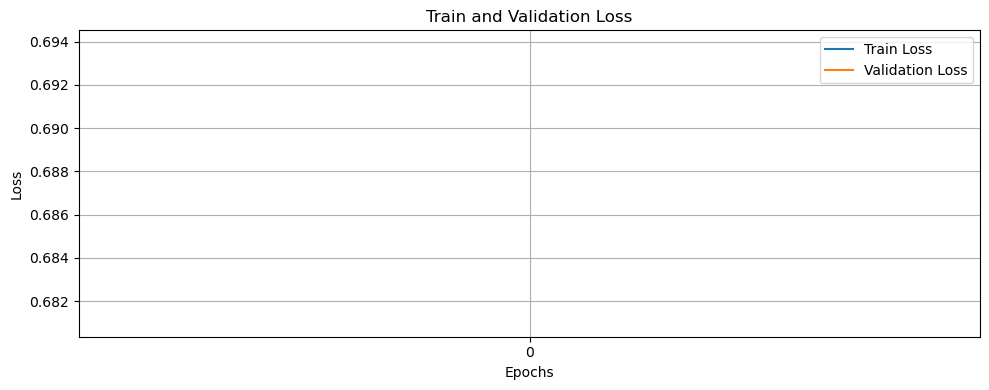

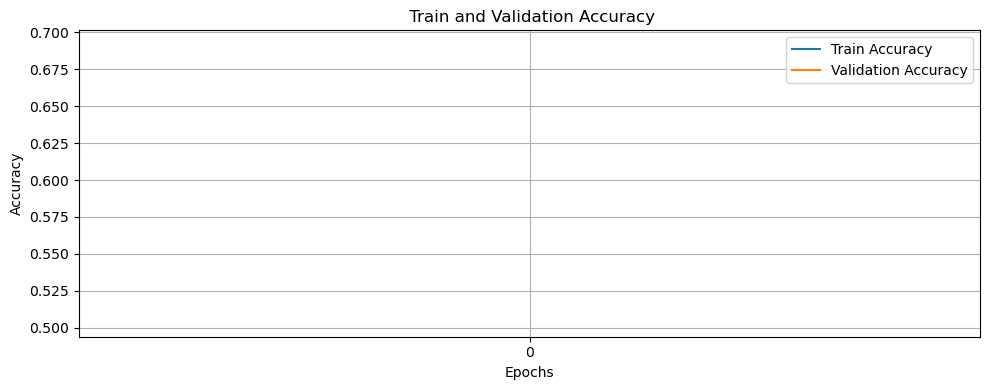

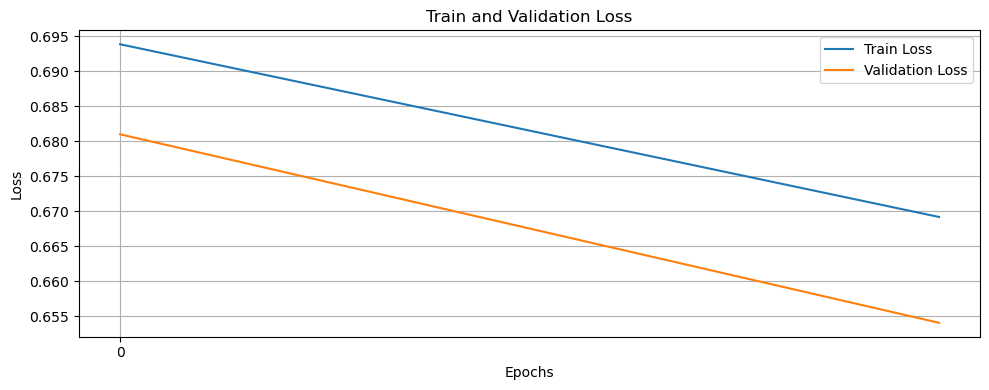

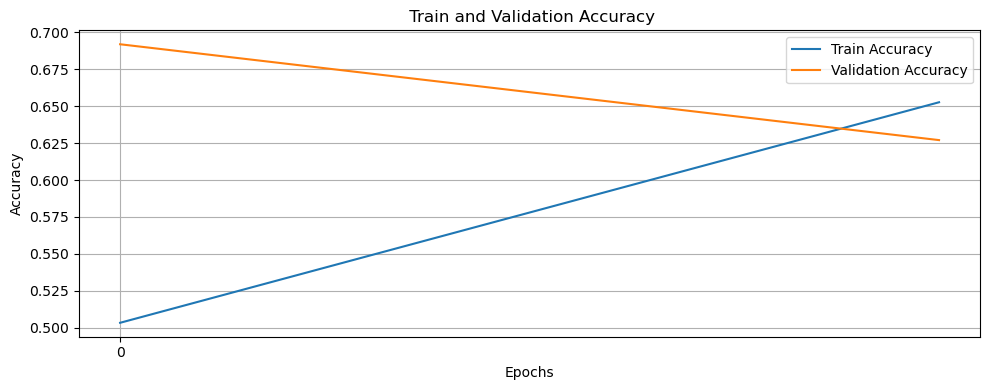

...

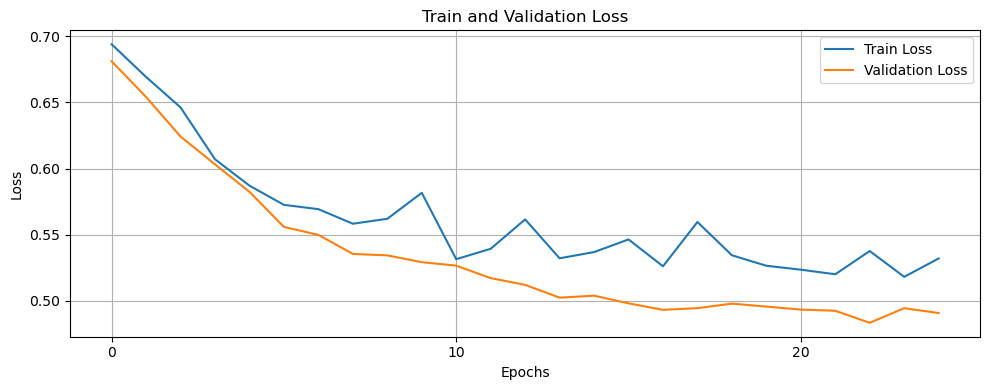

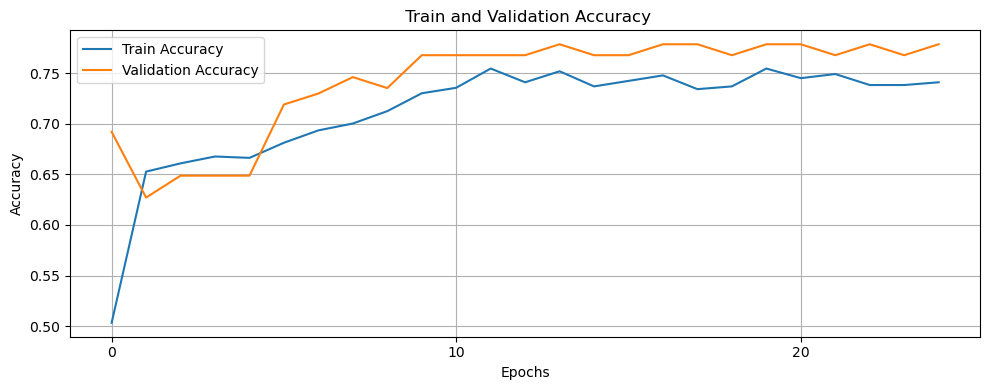

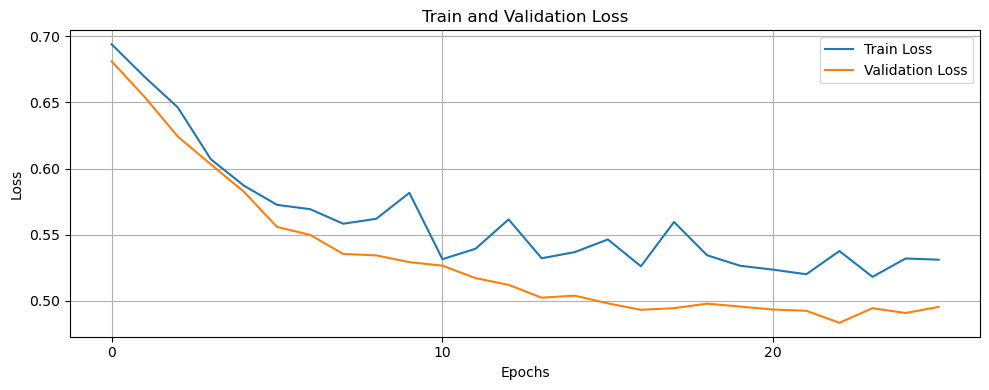

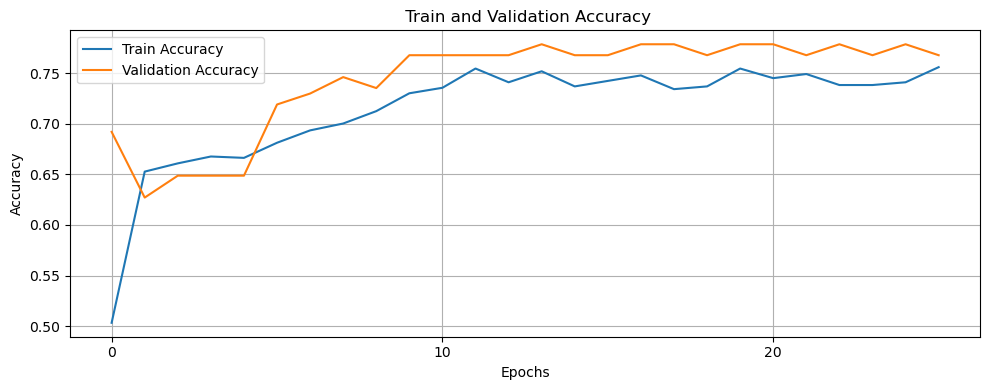

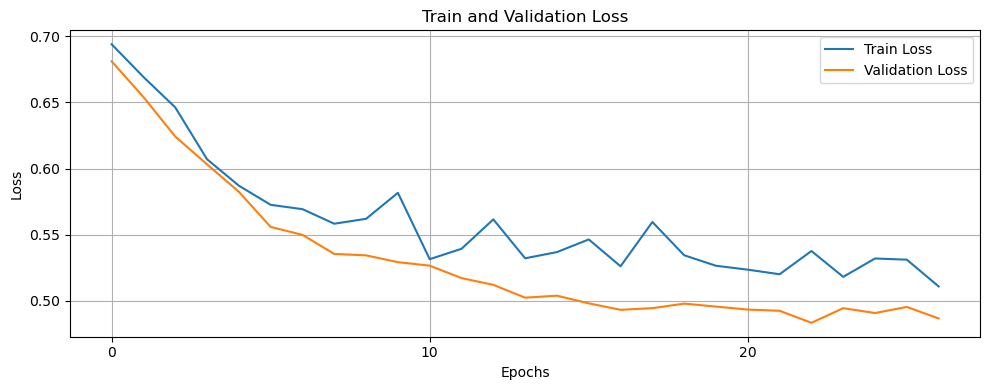

⏹️ Early stopping triggered at epoch 28
📊 Moyennes pour Oignon après 10 runs :
    Accuracy  = 0.7203
    Precision = 0.7726
    F1-score  = 0.6904


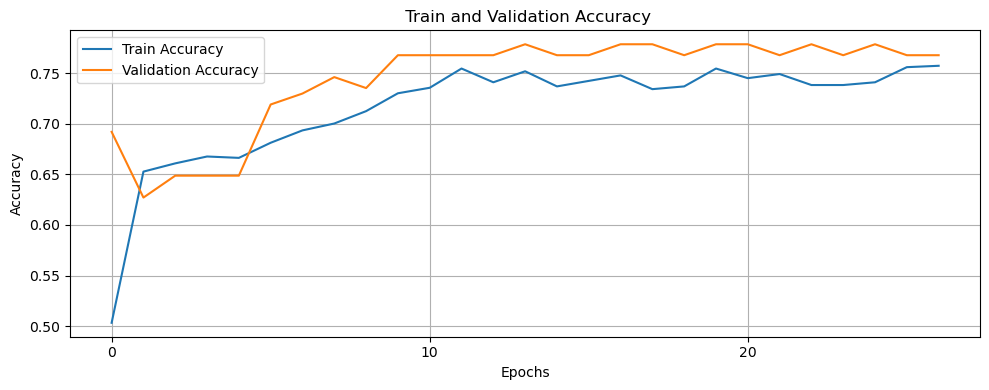

In [19]:
# Exemple d’appel avec tes données
for crop in DATASETS:
    print(f"\n🌾 Culture : {crop}")
    x, y = preprocess_data_classification(crop, DATASETS[crop]["y"], DATASETS[crop]["x"])
    acc, prec, f1 = train_gru_classification_model(x, y, n_runs=10)
    print(f"📊 Moyennes pour {crop} après 10 runs :")
    print(f"    Accuracy  = {acc:.4f}")
    print(f"    Precision = {prec:.4f}")
    print(f"    F1-score  = {f1:.4f}")

# Regression

In [20]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score
import numpy as np


DATASETS = {}
for name in DATASETS_FILE_NAMES:
    DATASETS[name] = {}
    for k, v in DATASETS_FILE_NAMES[name].items():
        if k == "d":
            DATASETS[name][k] = pd.read_csv(f"data/{name}/{v}", header=None)
        else:
            DATASETS[name][k] = pd.read_csv(f"data/{name}/{v}")


def normalize(sub_df):
    min_max_scaler = preprocessing.MinMaxScaler()
    sub_df_scaled = min_max_scaler.fit_transform(sub_df)
    return(pd.DataFrame(sub_df_scaled, index=sub_df.index, columns=sub_df.columns))

def preprocess_data_regression(crop, obs_df, meteo_df):
    obs_df.rename(columns={'SampleDate': 'Date'}, inplace=True)

    # Colonnes météo communes
    meteo_columns = [
        'Quot_more_30_Temp_C',
        'Rolling_Quot_more_30_Temp_C_3D',
        'Night_between_70_95_RH',
        'Night_more_0_Rain',
        'Quot_sum_Rain'
    ]

    # Colonnes spécifiques par culture
    crop_columns = {
        'Oignon': ['LivingLeavesNum_onions', 'DeadLeavesNum_onions', 'FeuillageCouche_onions'],
        'Carotte': ['GreenLeavesNum_carrots', 'carrot_stage'],
        'Laitue': []
    }

    if crop == 'Oignon':
        combined_df = obs_df.merge(meteo_df, on=['FarmID', 'Date'])
        label_col = 'cote_b_squamosa'
        drop_cols = ['cote_p_destructor', 'cote_s_vesicarium', 'Bulb_onions_date']

    elif crop == 'Laitue':
        combined_df = obs_df.merge(meteo_df, on=['FarmID', 'Date'])
        label_col = 'cote_b_lactucae'
        drop_cols = ['incidence_sclerotinia', 'incidence_b_cinerea', 'Pommaison_lettuce_date']

    elif crop == 'Carotte':
        obs_df = obs_df[obs_df['FarmID'] != 0]
        combined_df = obs_df.merge(meteo_df, on=['FarmID', 'Date'])
        label_col = 'cote_c_carotae'
        drop_cols = ['incidence_s_sclerotiorum', 'incidence_a_dauci']

    else:
        raise ValueError("Culture non reconnue")

    # Récupération de la variable cible
    y = combined_df[label_col].copy()

    # Suppression des colonnes inutiles
    combined_df.drop(columns=drop_cols + [label_col], inplace=True)

    # Sélection des colonnes pertinentes
    selected_columns = crop_columns[crop] + meteo_columns
    x = combined_df[selected_columns].copy()

    return x, y


In [21]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor


def DecisionTreeModel(x, y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True)
    clf = DecisionTreeRegressor()
    param_dist = {
        'criterion': ['poisson'],
        'max_depth': [1, 2, 3, 4, 5],
        'min_samples_split': [5, 10, 20],
        'splitter': ['best']
    }
    scoring = {
        'accuracy': make_scorer(accuracy_score),
        'roc_auc': make_scorer(roc_auc_score),
        'f1': make_scorer(f1_score)
    }
    grid = GridSearchCV(clf, param_grid=param_dist, n_jobs=-1, cv=5, scoring=scoring, refit='accuracy')
    grid.fit(x_train, y_train)
    clf = grid.best_estimator_
    y_pred = clf.predict(x_test)
    return r2_score(y_test, y_pred)


def kNNModel(x, y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True)
    clf = KNeighborsRegressor()
    clf.fit(x_train, y_train)
    y_pred = clf.predict(x_test)
    return r2_score(y_test, y_pred)


def RandomForestModel(x, y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True)
    clf = RandomForestRegressor()
    clf.fit(x_train, y_train)
    y_pred = clf.predict(x_test)
    return r2_score(y_test, y_pred)

In [22]:
N_RUNS = 5  # nombre d'exécutions
models = (
    ("DT", DecisionTreeModel),
    ("k-NN", kNNModel),
    ("RF", RandomForestModel),
)

for crop in DATASETS:
    print(f"\n🌾 Culture : {crop}")
    x, y = preprocess_data_regression(crop, DATASETS[crop]["y"], DATASETS[crop]["x"])

    # Standardisation
    scaler = StandardScaler()
    x_scaled = scaler.fit_transform(x)

    # Normalisation de y
    y = y.values if hasattr(y, 'values') else y
    y = y / max(y)

    # Dictionnaire pour stocker les résultats par modèle
    r2_scores = {name: [] for name, _ in models}

    for run in range(N_RUNS):
        print(f"   ▶️ Run {run + 1}/{N_RUNS}")
        for name, model in models:
            r = model(x, y)
            r2_scores[name].append(r)
            print(f"    {name}: R² = {r:.4f}")

    # Moyennes finales
    print(f"\n📊 Moyennes des {N_RUNS} runs pour {crop} :")
    for name in r2_scores:
        r2_mean = np.mean(r2_scores[name])
        print(f"    ▶️ {name} : R² moyen = {r2_mean:.4f}")


🌾 Culture : Carotte
   ▶️ Run 1/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.1374
    k-NN: R² = 0.1536
    RF: R² = 0.1628
   ▶️ Run 2/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.2371
    k-NN: R² = 0.0754
    RF: R² = 0.1094
   ▶️ Run 3/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.1019
    k-NN: R² = 0.1490
    RF: R² = 0.2962
   ▶️ Run 4/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.1063
    k-NN: R² = 0.0798
    RF: R² = 0.3285
   ▶️ Run 5/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.1238
    k-NN: R² = 0.0431
    RF: R² = 0.2452

📊 Moyennes des 5 runs pour Carotte :
    ▶️ DT : R² moyen = 0.1413
    ▶️ k-NN : R² moyen = 0.1002
    ▶️ RF : R² moyen = 0.2284

🌾 Culture : Laitue
   ▶️ Run 1/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.1434
    k-NN: R² = 0.4325
    RF: R² = 0.5905
   ▶️ Run 2/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.1886
    k-NN: R² = 0.5576
    RF: R² = 0.5339
   ▶️ Run 3/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.2328
    k-NN: R² = 0.5219
    RF: R² = 0.4906
   ▶️ Run 4/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.1912
    k-NN: R² = 0.1650
    RF: R² = 0.6735
   ▶️ Run 5/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.1575
    k-NN: R² = 0.5516
    RF: R² = 0.6039

📊 Moyennes des 5 runs pour Laitue :
    ▶️ DT : R² moyen = 0.1827
    ▶️ k-NN : R² moyen = 0.4457
    ▶️ RF : R² moyen = 0.5785

🌾 Culture : Oignon
   ▶️ Run 1/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.0377
    k-NN: R² = 0.4672
    RF: R² = 0.5307
   ▶️ Run 2/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.0897
    k-NN: R² = 0.4107
    RF: R² = 0.4468
   ▶️ Run 3/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.0271
    k-NN: R² = 0.4230
    RF: R² = 0.4126
   ▶️ Run 4/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.0934
    k-NN: R² = 0.3730
    RF: R² = 0.4890
   ▶️ Run 5/5


C:\Users\Ousmane\Documents\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


    DT: R² = 0.0228
    k-NN: R² = 0.4848
    RF: R² = 0.4453

📊 Moyennes des 5 runs pour Oignon :
    ▶️ DT : R² moyen = 0.0541
    ▶️ k-NN : R² moyen = 0.4317
    ▶️ RF : R² moyen = 0.4649


# Neural network

In [27]:
from sklearn.metrics import mean_absolute_error, r2_score

def NNRegressionModel(x, y, show_plot=True):
    scaler = StandardScaler()
    x_scaled = scaler.fit_transform(x)

    # Split
    x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.2, shuffle=True)

    # Model
    model = Sequential([
        Input(shape=(x_train.shape[1],)),
        Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.0001)),
        Dense(32, activation='relu', kernel_regularizer=regularizers.l1(0.0001)),
        Dense(16, activation='relu', kernel_regularizer=regularizers.l1(0.0001)),
        Dense(8, activation='relu', kernel_regularizer=regularizers.l1(0.0001)),
        Dense(1)  # Pas d'activation pour la régression
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

    # EarlyStopping
    early_stop = EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True,
        verbose=1
    )

    # Fit model
    history = model.fit(
        x_train, y_train,
        validation_split=0.2,
        epochs=100,
        batch_size=16,
        callbacks=[early_stop],
        verbose=0
    )

    # Prédictions
    y_pred = model.predict(x_test).flatten()

    # Évaluation
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Courbes
    if show_plot:
        plt.figure(figsize=(10, 4))
        plt.plot(history.history["loss"], label="Train Loss")
        plt.plot(history.history["val_loss"], label="Validation Loss")
        plt.xticks(np.arange(0, len(history.history['loss']), 10))
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.title("Train and Validation Loss")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    return r2, mae



🌾 Culture : Carotte
   ▶️ Run 1/10
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 26.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


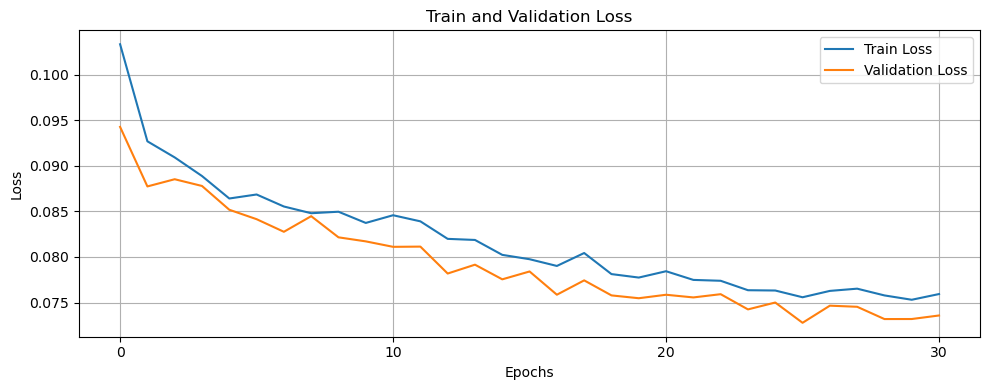

    NN: R² = 0.2712, MAE = 0.1814
   ▶️ Run 2/10
Epoch 64: early stopping
Restoring model weights from the end of the best epoch: 59.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


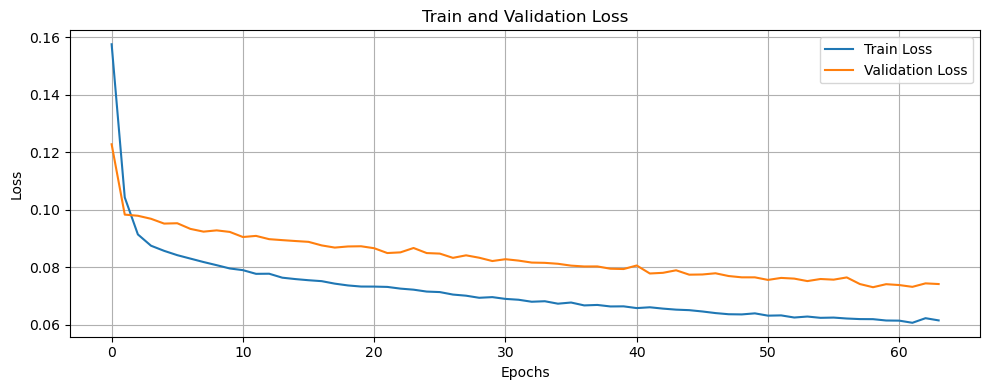

    NN: R² = 0.2656, MAE = 0.1824
   ▶️ Run 3/10
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 26.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


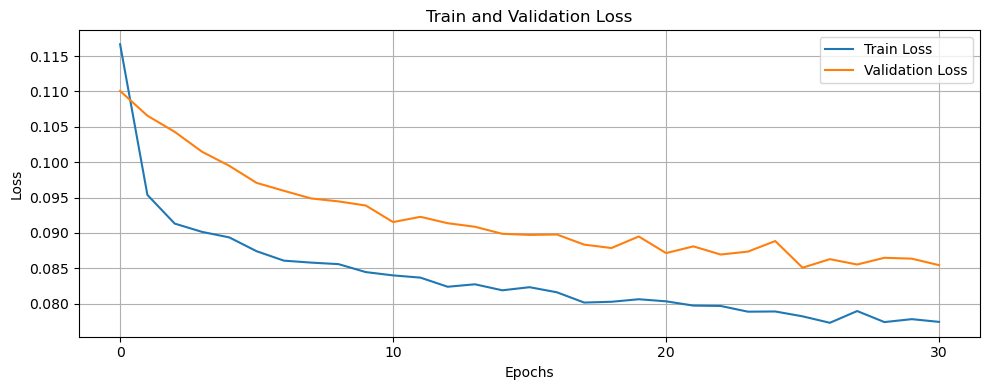

    NN: R² = 0.3246, MAE = 0.1673
   ▶️ Run 4/10
Epoch 89: early stopping
Restoring model weights from the end of the best epoch: 84.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


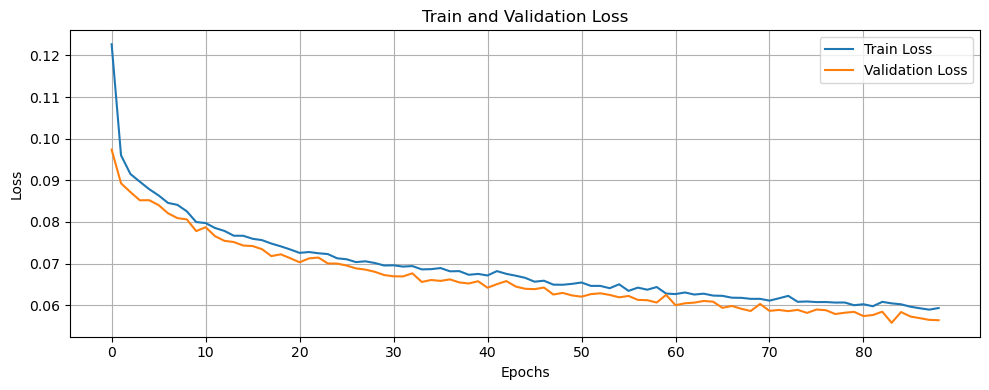

    NN: R² = 0.2579, MAE = 0.1816
   ▶️ Run 5/10
Epoch 95: early stopping
Restoring model weights from the end of the best epoch: 90.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


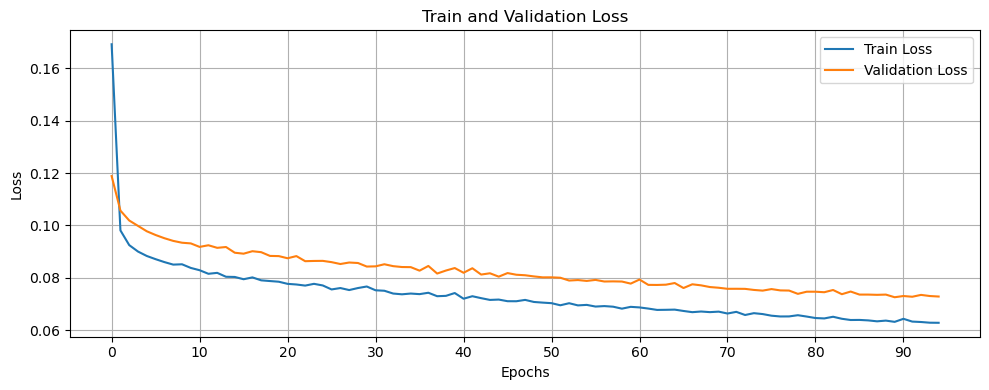

    NN: R² = 0.2656, MAE = 0.1802
   ▶️ Run 6/10
Epoch 76: early stopping
Restoring model weights from the end of the best epoch: 71.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


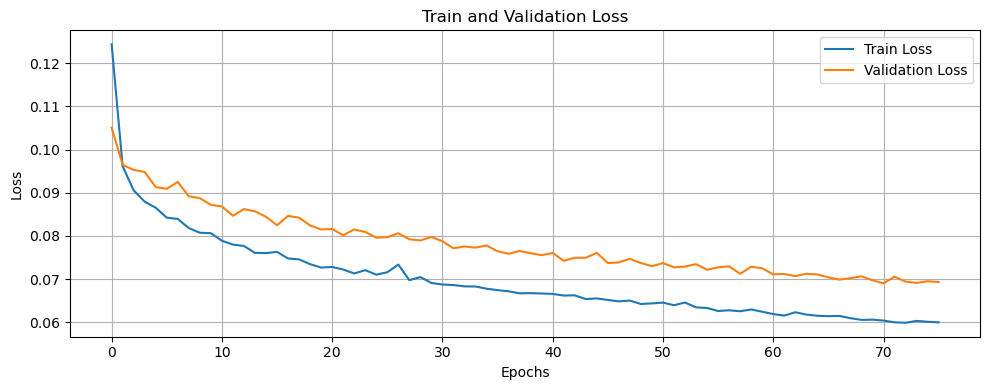

    NN: R² = 0.2216, MAE = 0.1877
   ▶️ Run 7/10
Epoch 46: early stopping
Restoring model weights from the end of the best epoch: 41.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


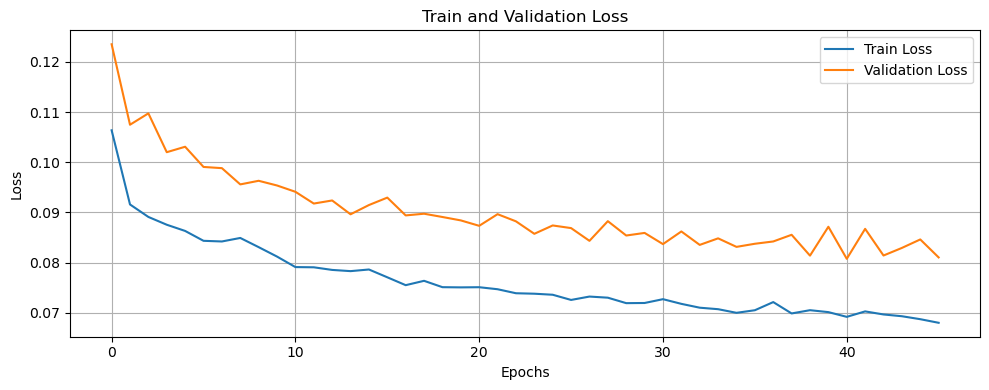

    NN: R² = 0.1768, MAE = 0.1899
   ▶️ Run 8/10
Epoch 22: early stopping
Restoring model weights from the end of the best epoch: 17.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


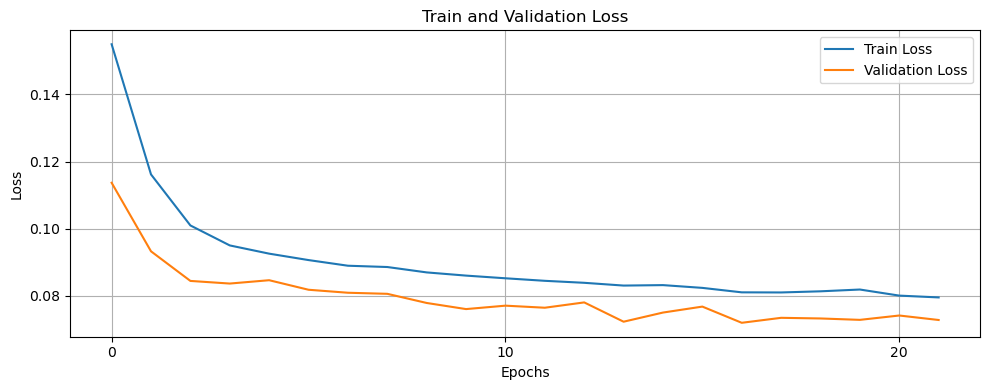

    NN: R² = 0.2670, MAE = 0.1852
   ▶️ Run 9/10
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 27.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


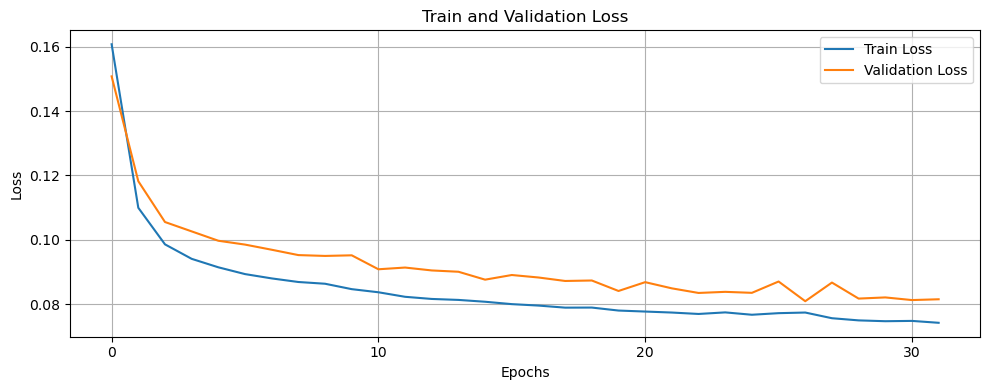

    NN: R² = 0.3341, MAE = 0.1721
   ▶️ Run 10/10
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 21.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


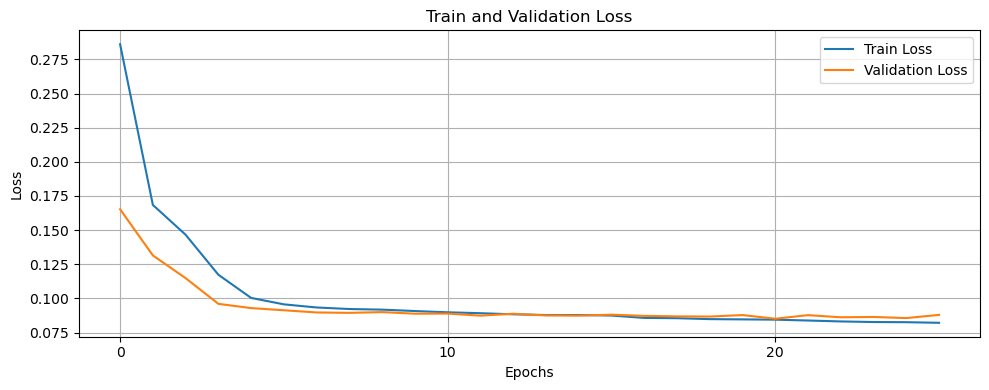

    NN: R² = 0.3571, MAE = 0.1749

📊 Moyennes des 10 runs pour Carotte :
    ▶️ NN : R² = 0.2741, MAE = 0.1803

🌾 Culture : Laitue
   ▶️ Run 1/10
Epoch 76: early stopping
Restoring model weights from the end of the best epoch: 71.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


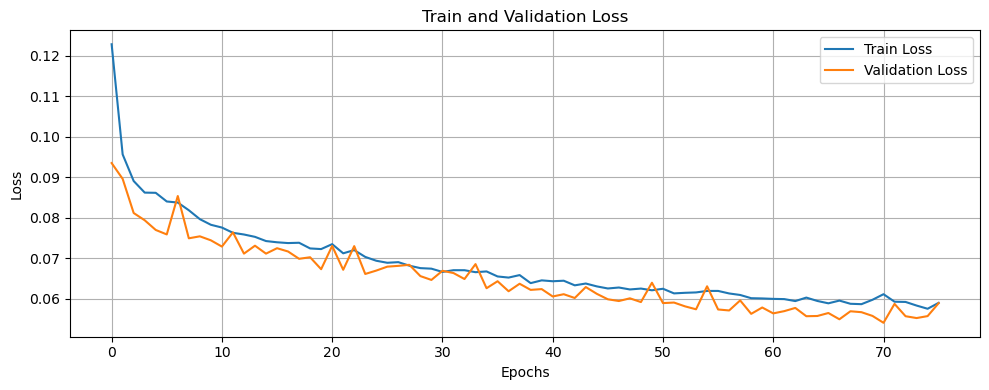

    NN: R² = 0.4797, MAE = 0.1298
   ▶️ Run 2/10
Restoring model weights from the end of the best epoch: 99.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


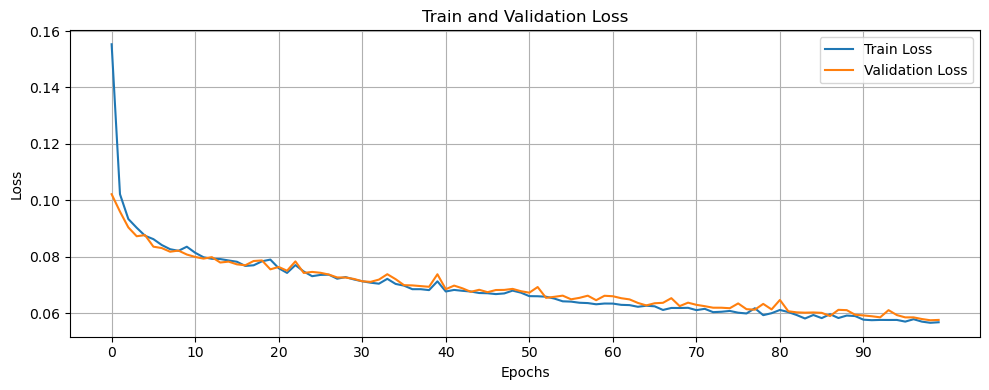

    NN: R² = 0.4736, MAE = 0.1113
   ▶️ Run 3/10
Epoch 57: early stopping
Restoring model weights from the end of the best epoch: 52.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


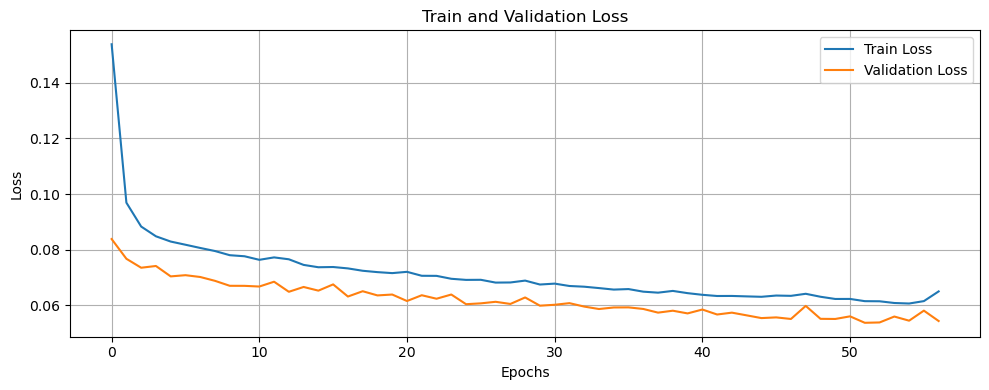

    NN: R² = 0.5355, MAE = 0.1453
   ▶️ Run 4/10
Epoch 97: early stopping
Restoring model weights from the end of the best epoch: 92.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


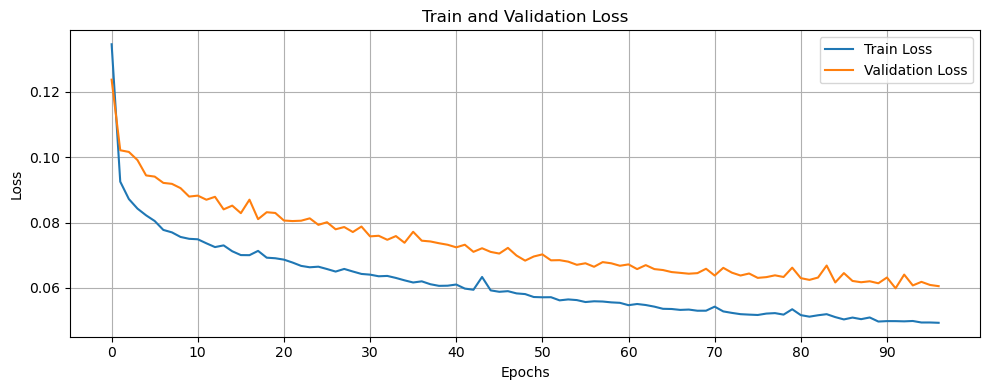

    NN: R² = 0.5271, MAE = 0.1452
   ▶️ Run 5/10
Epoch 18: early stopping
Restoring model weights from the end of the best epoch: 13.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


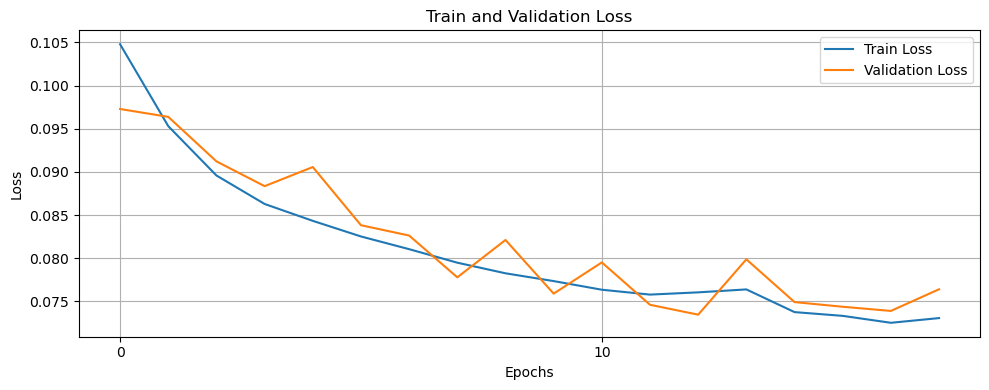

    NN: R² = 0.4796, MAE = 0.1465
   ▶️ Run 6/10
Epoch 16: early stopping
Restoring model weights from the end of the best epoch: 11.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


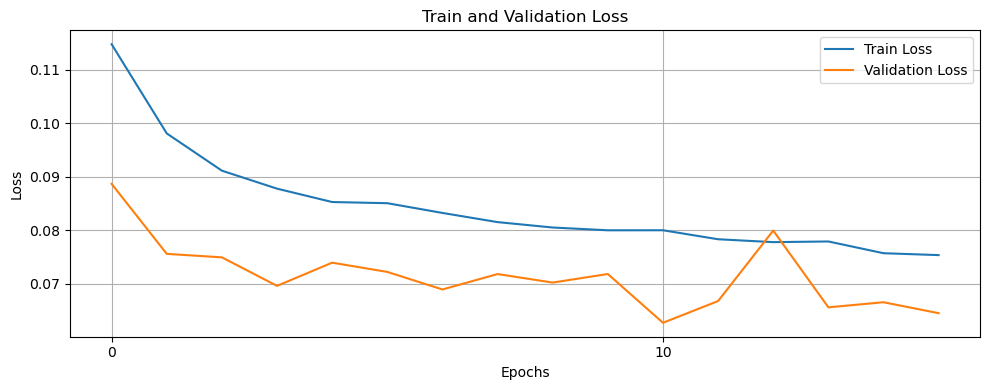

    NN: R² = 0.5457, MAE = 0.1153
   ▶️ Run 7/10
Restoring model weights from the end of the best epoch: 97.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


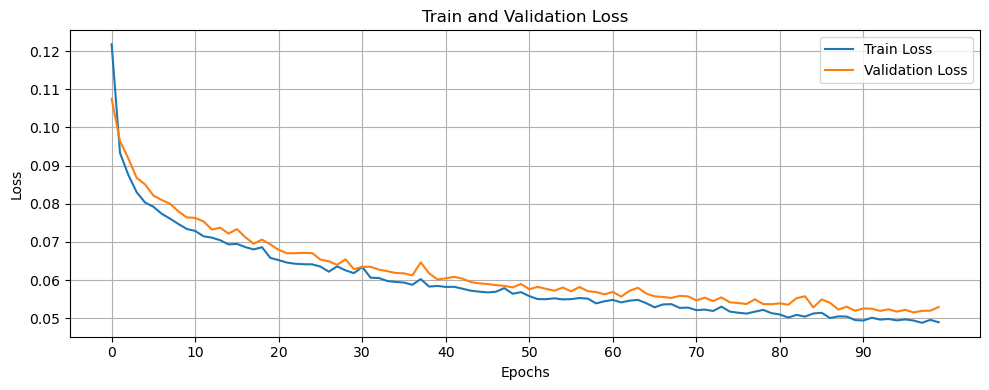

    NN: R² = 0.4806, MAE = 0.1533
   ▶️ Run 8/10
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 27.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


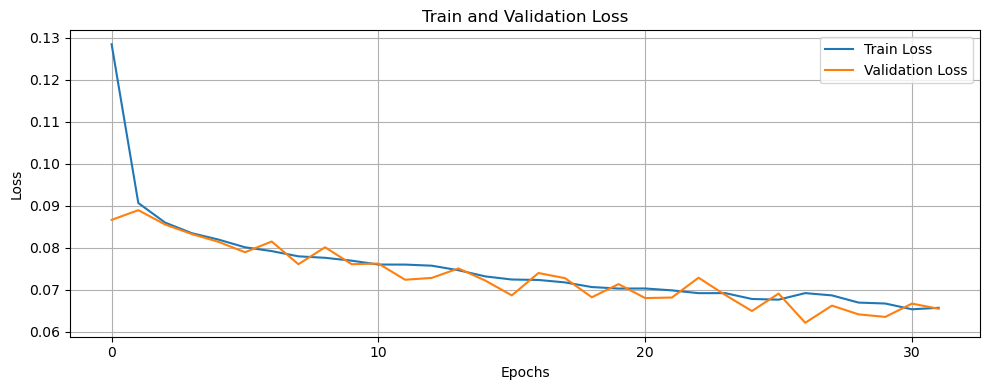

    NN: R² = 0.4967, MAE = 0.1458
   ▶️ Run 9/10
Epoch 76: early stopping
Restoring model weights from the end of the best epoch: 71.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


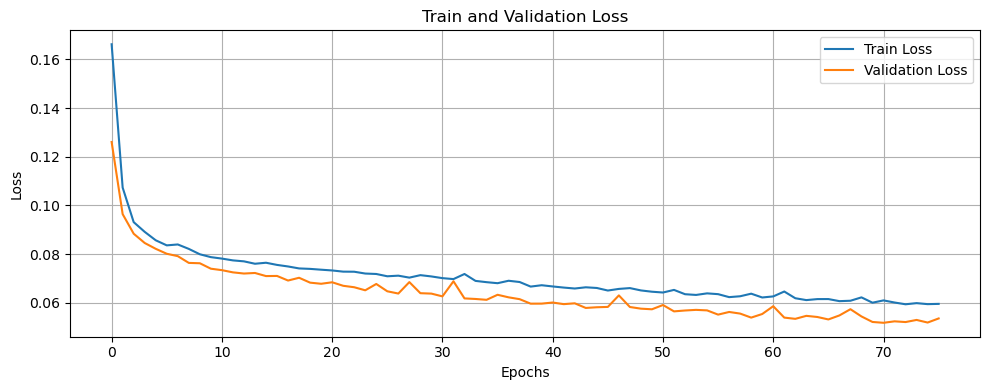

    NN: R² = 0.4751, MAE = 0.1283
   ▶️ Run 10/10
Epoch 54: early stopping
Restoring model weights from the end of the best epoch: 49.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


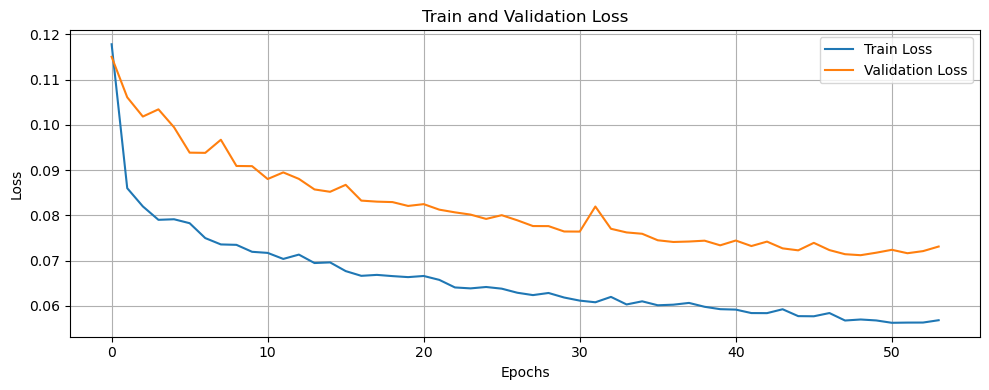

    NN: R² = 0.4727, MAE = 0.1361

📊 Moyennes des 10 runs pour Laitue :
    ▶️ NN : R² = 0.4966, MAE = 0.1357

🌾 Culture : Oignon
   ▶️ Run 1/10
Restoring model weights from the end of the best epoch: 99.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


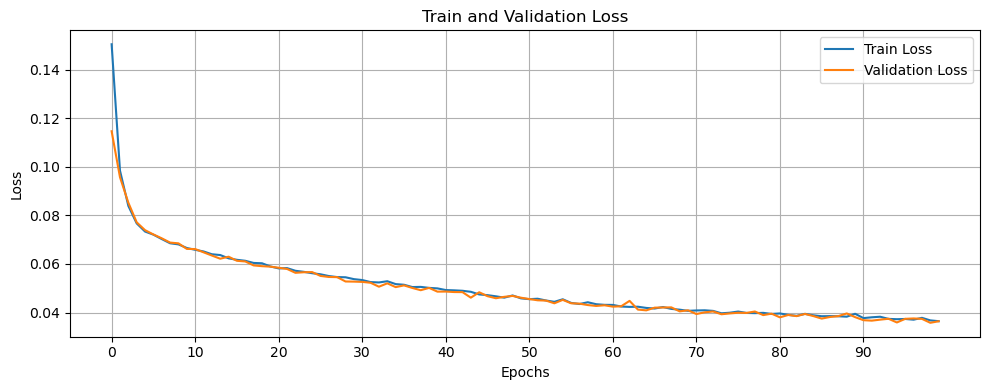

    NN: R² = 0.3889, MAE = 0.1280
   ▶️ Run 2/10
Epoch 37: early stopping
Restoring model weights from the end of the best epoch: 32.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


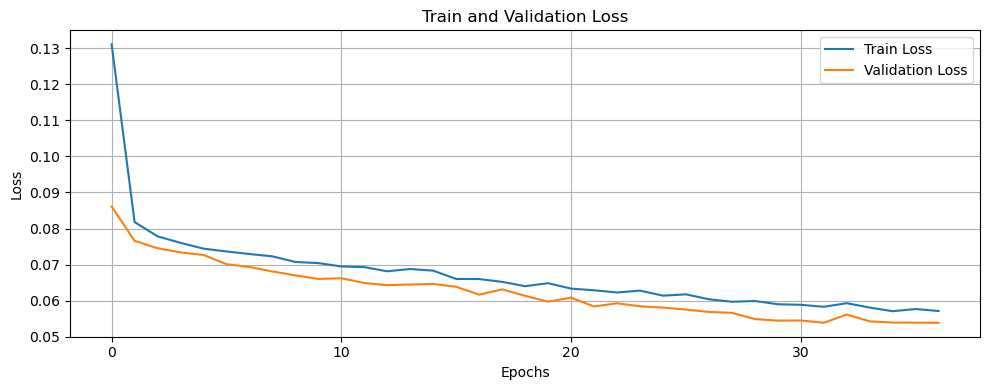

    NN: R² = 0.4317, MAE = 0.1269
   ▶️ Run 3/10
Epoch 63: early stopping
Restoring model weights from the end of the best epoch: 58.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


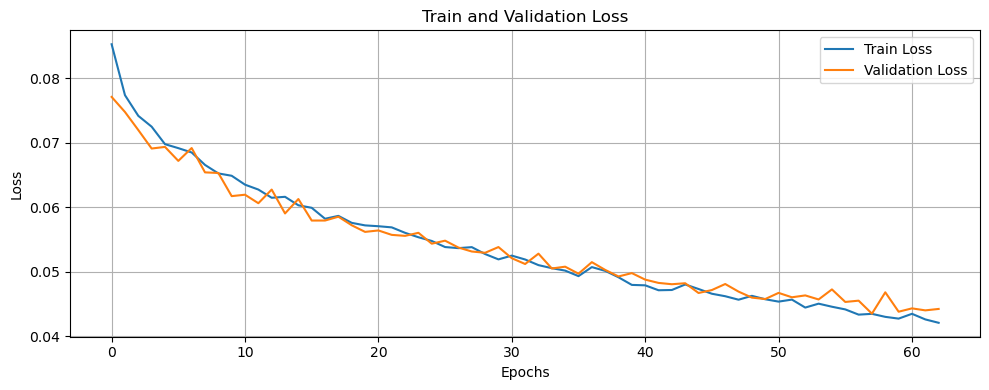

    NN: R² = 0.3140, MAE = 0.1224
   ▶️ Run 4/10
Epoch 61: early stopping
Restoring model weights from the end of the best epoch: 56.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


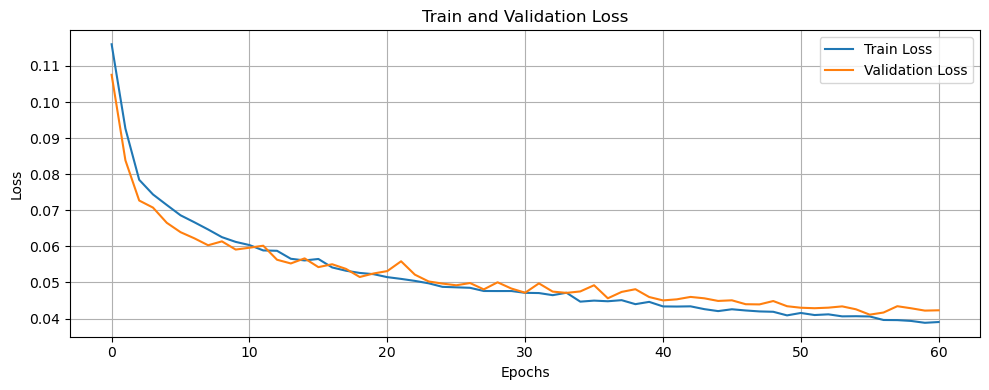

    NN: R² = 0.5023, MAE = 0.1207
   ▶️ Run 5/10
Epoch 70: early stopping
Restoring model weights from the end of the best epoch: 65.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


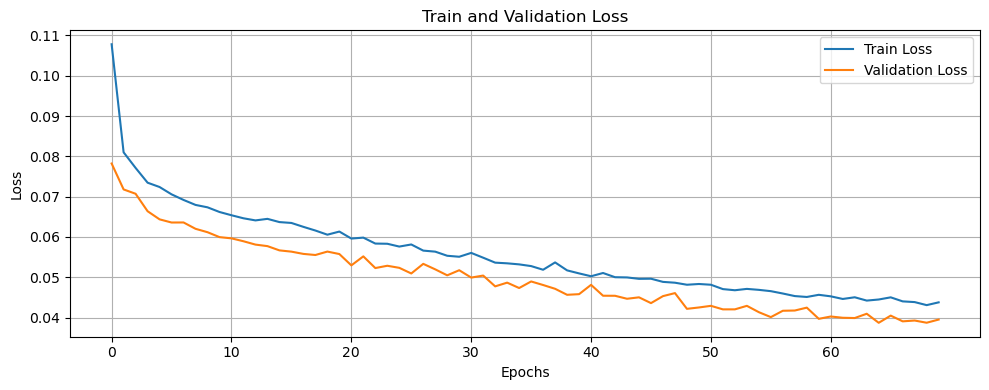

    NN: R² = 0.4189, MAE = 0.1271
   ▶️ Run 6/10
Epoch 36: early stopping
Restoring model weights from the end of the best epoch: 31.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


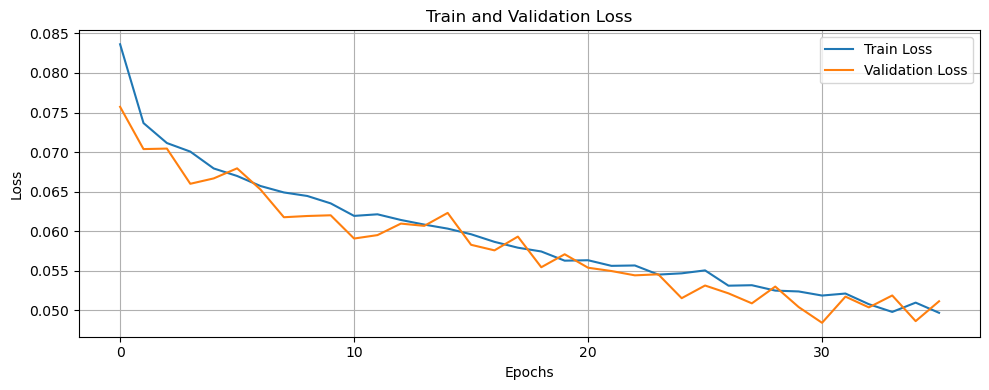

    NN: R² = 0.4287, MAE = 0.1281
   ▶️ Run 7/10
Epoch 100: early stopping
Restoring model weights from the end of the best epoch: 95.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


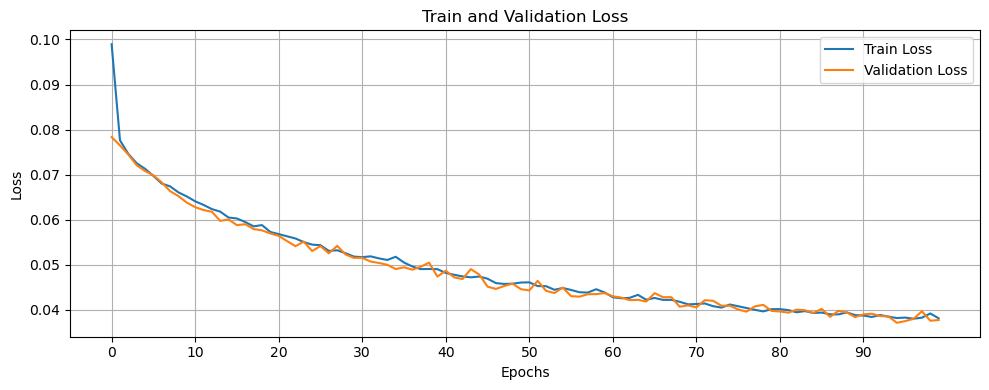

    NN: R² = 0.5648, MAE = 0.1180
   ▶️ Run 8/10
Epoch 89: early stopping
Restoring model weights from the end of the best epoch: 84.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


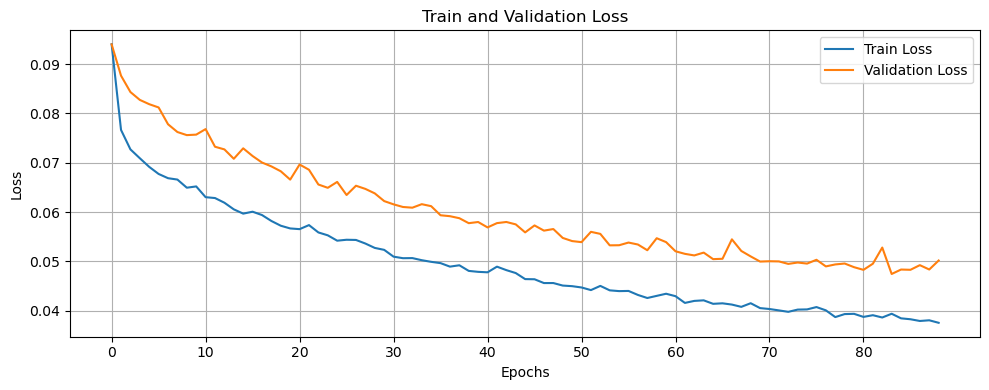

    NN: R² = 0.4700, MAE = 0.1189
   ▶️ Run 9/10
Epoch 62: early stopping
Restoring model weights from the end of the best epoch: 57.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


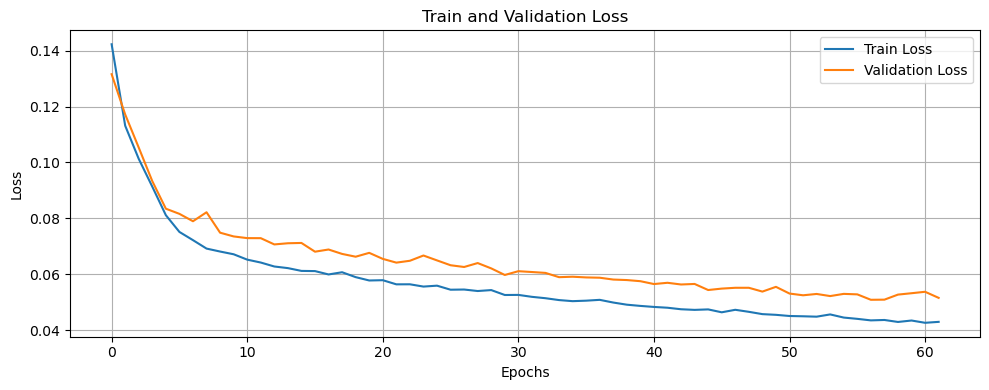

    NN: R² = 0.3895, MAE = 0.1220
   ▶️ Run 10/10
Restoring model weights from the end of the best epoch: 99.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


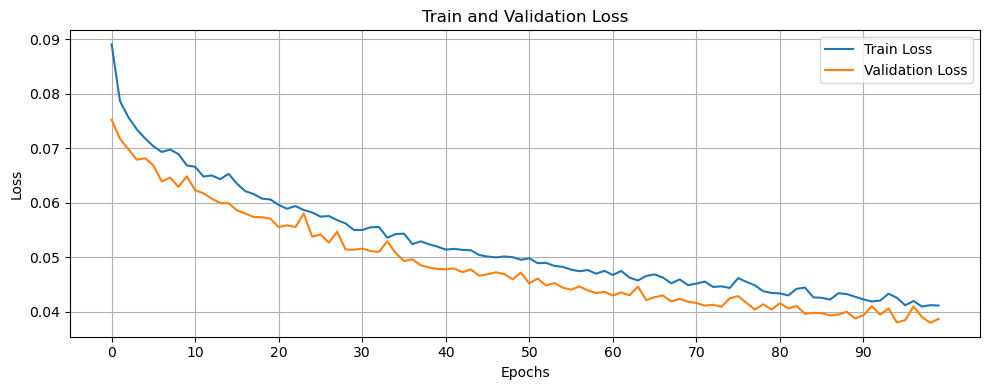

    NN: R² = 0.5566, MAE = 0.1065

📊 Moyennes des 10 runs pour Oignon :
    ▶️ NN : R² = 0.4465, MAE = 0.1218


In [28]:
N_RUNS = 10
models = [("NN", NNRegressionModel)]

for crop in DATASETS:
    print(f"\n🌾 Culture : {crop}")
    x, y = preprocess_data_regression(crop, DATASETS[crop]["y"], DATASETS[crop]["x"])
    y = y.values if hasattr(y, 'values') else y
    y = y / max(y)  # Normaliser entre 0 et 1 (optionnel mais utile ici)

    r2_scores = {name: [] for name, _ in models}
    mae_scores = {name: [] for name, _ in models}

    for run in range(N_RUNS):
        print(f"   ▶️ Run {run + 1}/{N_RUNS}")
        for name, model in models:
            r2, mae = model(x, y)
            r2_scores[name].append(r2)
            mae_scores[name].append(mae)
            print(f"    {name}: R² = {r2:.4f}, MAE = {mae:.4f}")

    print(f"\n📊 Moyennes des {N_RUNS} runs pour {crop} :")
    for name in r2_scores:
        r2_mean = np.mean(r2_scores[name])
        mae_mean = np.mean(mae_scores[name])
        print(f"    ▶️ {name} : R² = {r2_mean:.4f}, MAE = {mae_mean:.4f}")


# LSTM


🌾 Culture : Carotte
   ▶️ Run 1/10


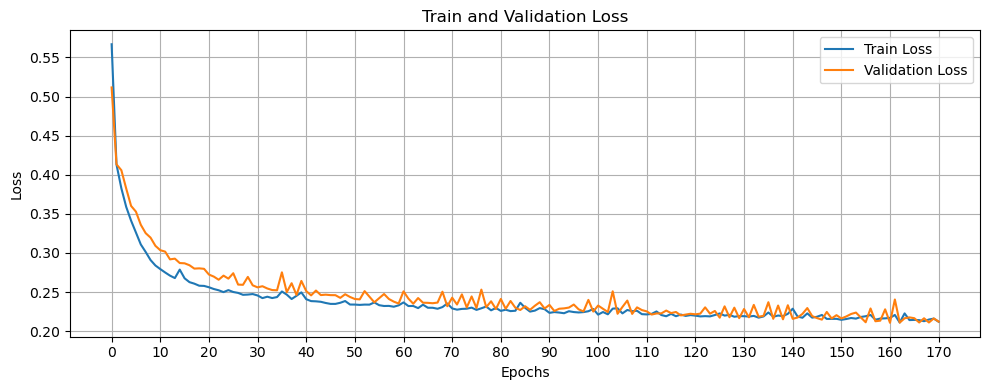

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 421ms/step
    LSTM_Regression (run 1): R² = 0.0695
   ▶️ Run 2/10


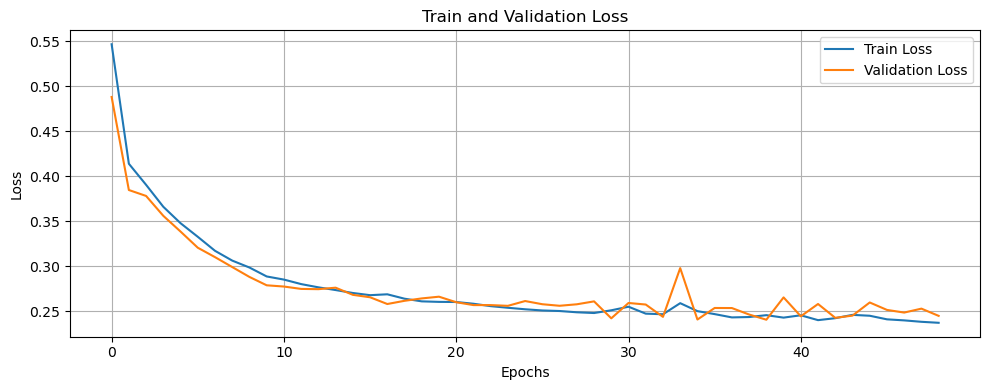

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 345ms/step
    LSTM_Regression (run 2): R² = 0.2042
   ▶️ Run 3/10


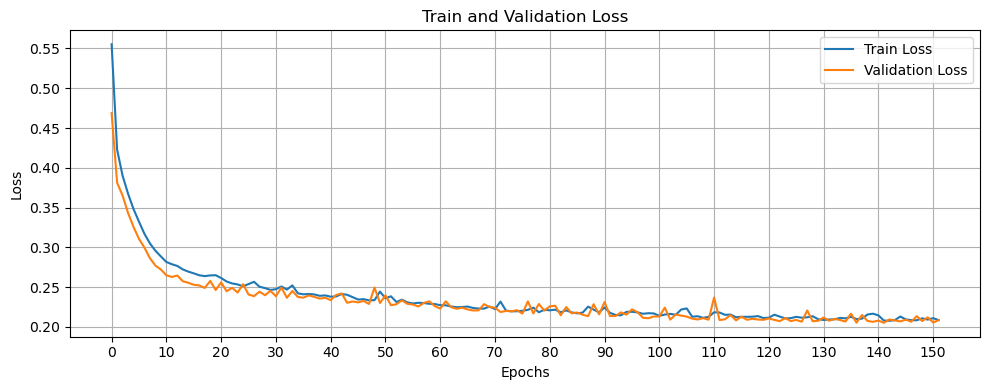

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 414ms/step
    LSTM_Regression (run 3): R² = 0.2046
   ▶️ Run 4/10


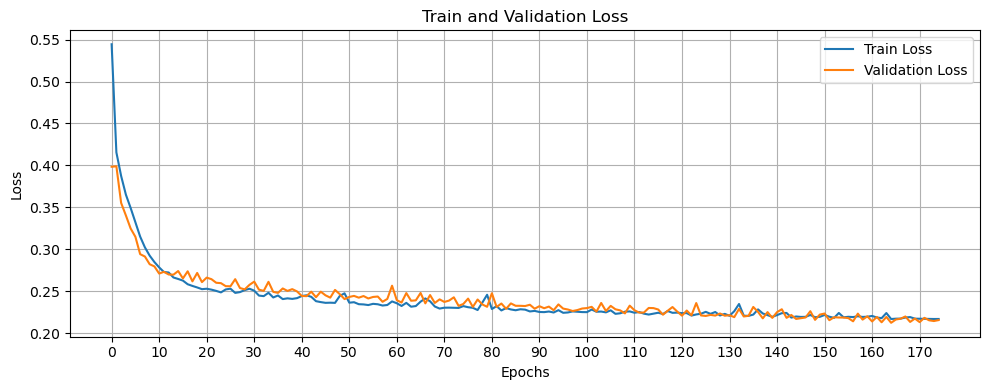

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 419ms/step
    LSTM_Regression (run 4): R² = 0.2193
   ▶️ Run 5/10


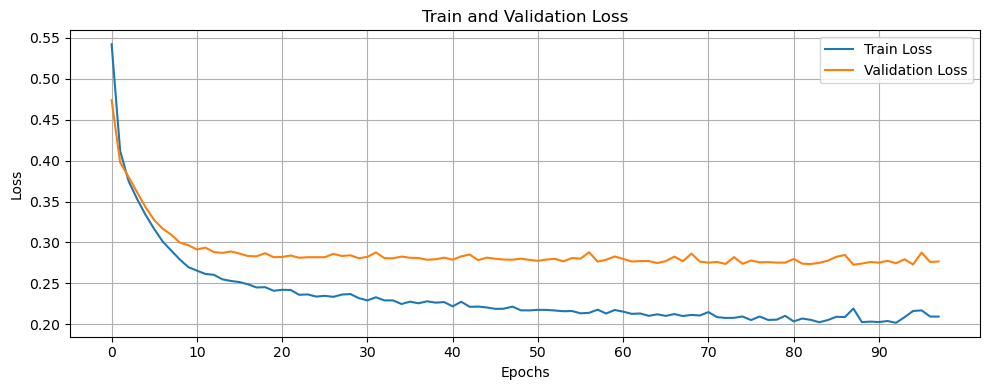

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 418ms/step
    LSTM_Regression (run 5): R² = 0.2330
   ▶️ Run 6/10


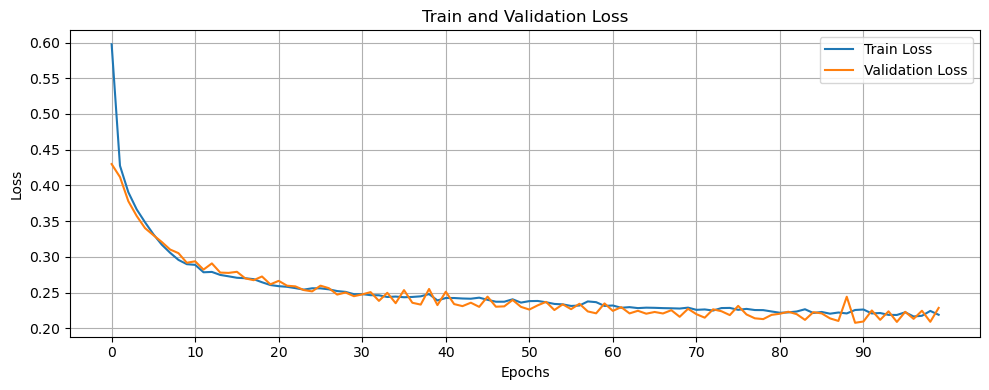

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 415ms/step
    LSTM_Regression (run 6): R² = 0.1357
   ▶️ Run 7/10


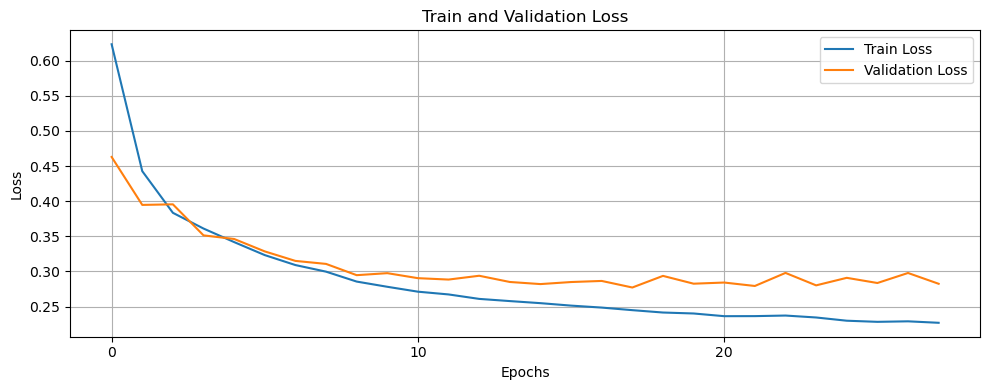

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 418ms/step
    LSTM_Regression (run 7): R² = -0.0511
   ▶️ Run 8/10


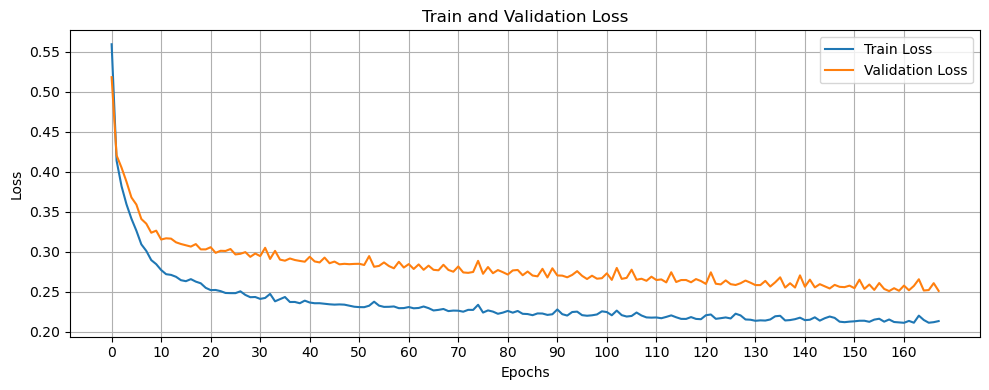

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 408ms/step
    LSTM_Regression (run 8): R² = 0.3093
   ▶️ Run 9/10


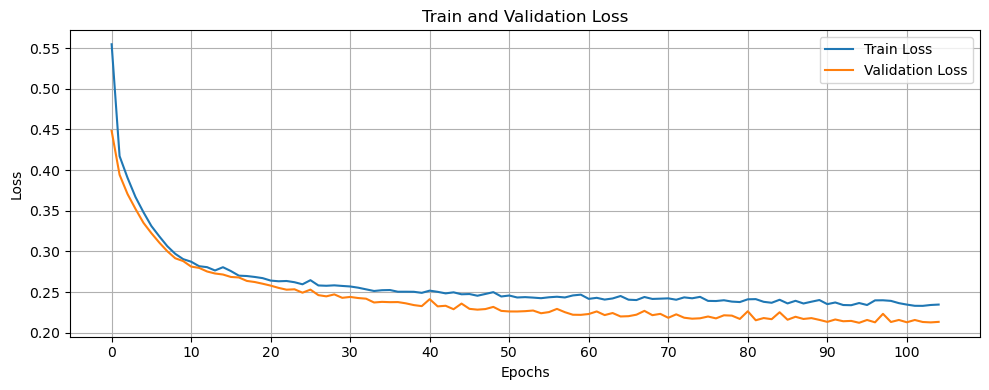

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 407ms/step
    LSTM_Regression (run 9): R² = 0.2158
   ▶️ Run 10/10


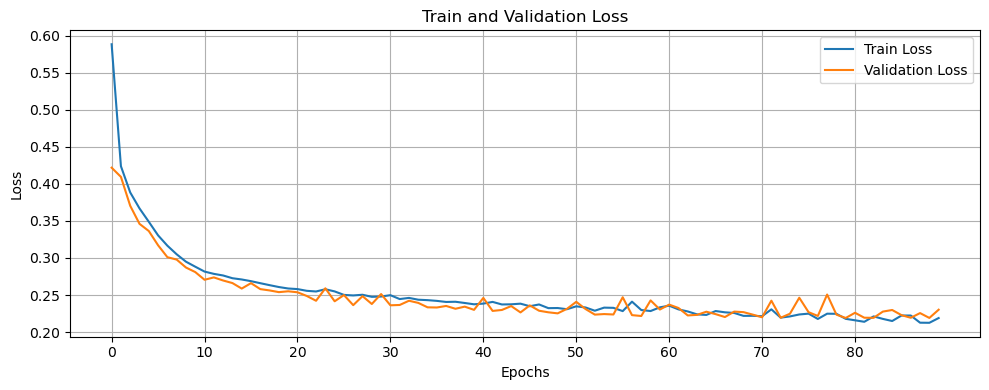

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 412ms/step
    LSTM_Regression (run 10): R² = 0.1745

📊 Moyenne des 10 runs pour Carotte :
    ▶️ R² moyen = 0.1715

🌾 Culture : Laitue
   ▶️ Run 1/10


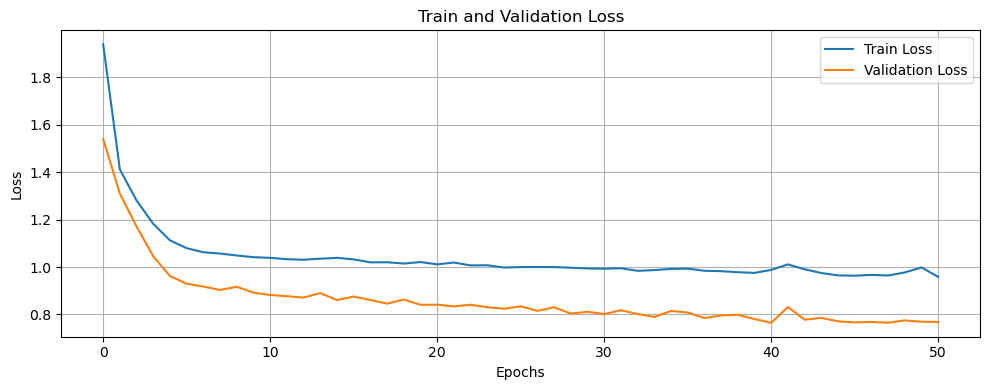

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 278ms/step
    LSTM_Regression (run 1): R² = 0.3621
   ▶️ Run 2/10


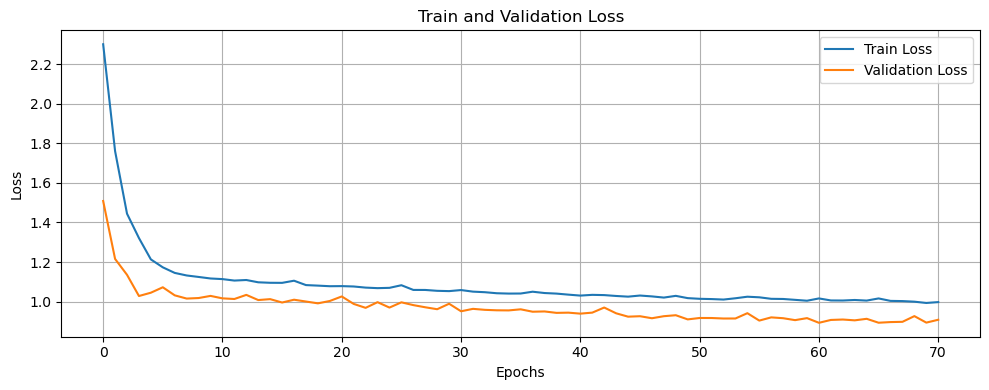

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 273ms/step
    LSTM_Regression (run 2): R² = 0.4219
   ▶️ Run 3/10


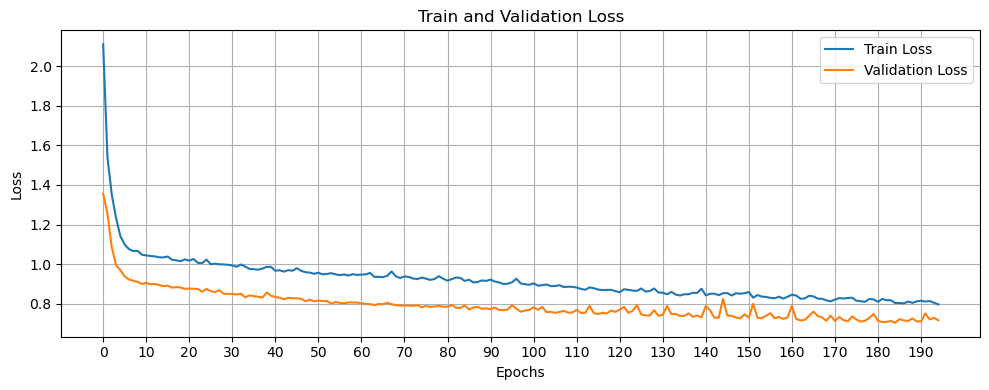

4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step  
    LSTM_Regression (run 3): R² = 0.4538
   ▶️ Run 4/10


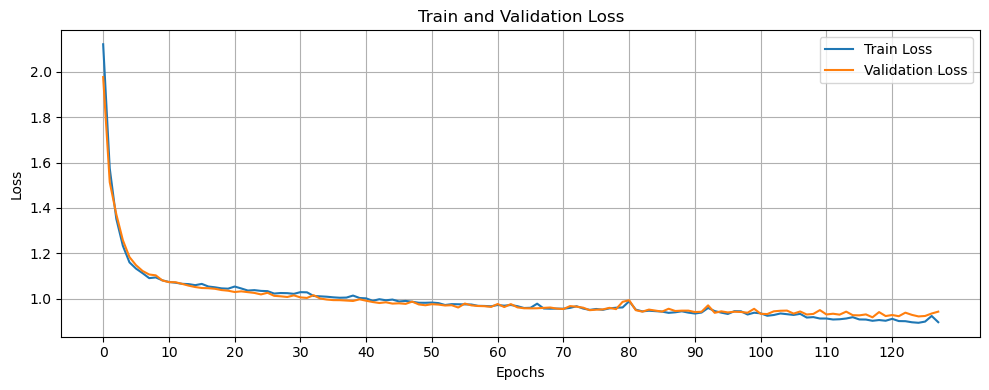

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 277ms/step
    LSTM_Regression (run 4): R² = 0.5381
   ▶️ Run 5/10


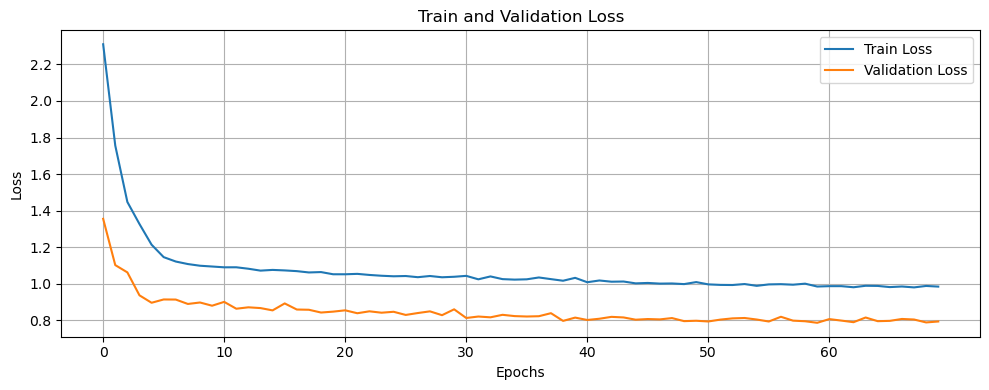

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 300ms/step
    LSTM_Regression (run 5): R² = 0.3908
   ▶️ Run 6/10


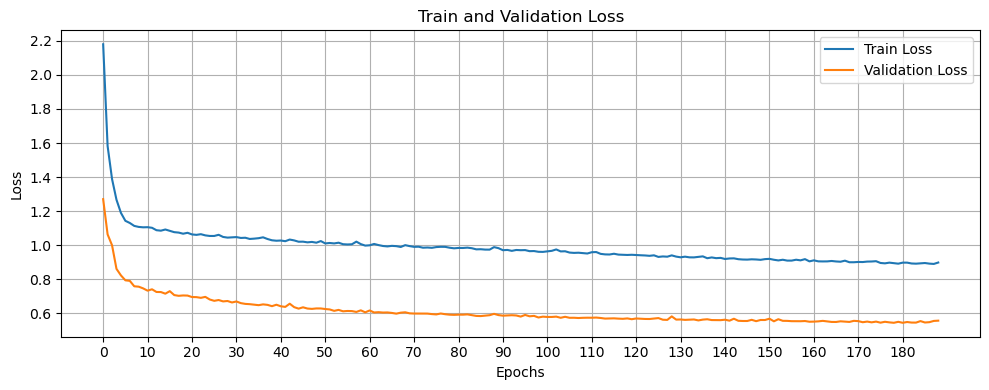

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 275ms/step
    LSTM_Regression (run 6): R² = 0.4593
   ▶️ Run 7/10


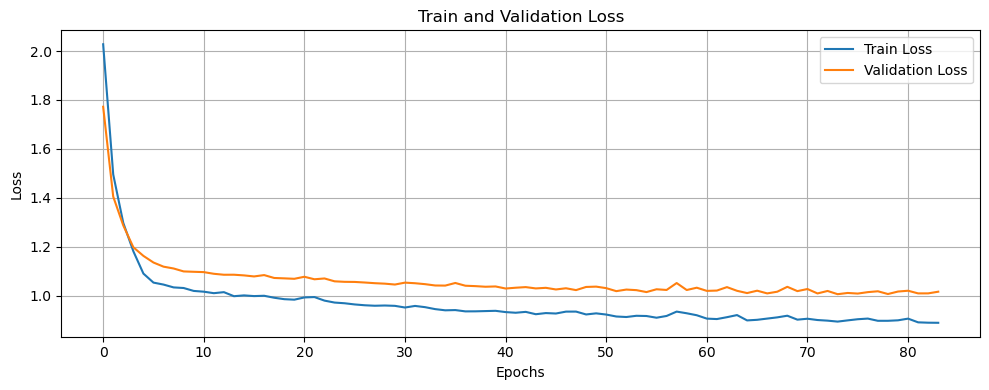

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 278ms/step
    LSTM_Regression (run 7): R² = 0.3966
   ▶️ Run 8/10


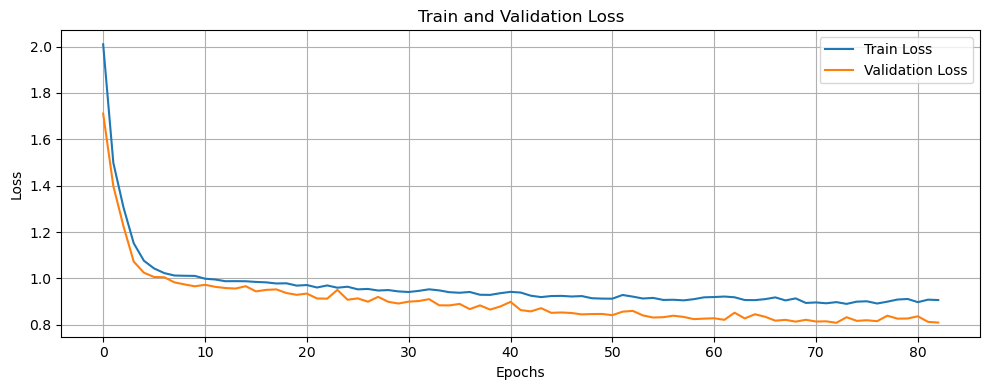

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 281ms/step
    LSTM_Regression (run 8): R² = 0.1908
   ▶️ Run 9/10


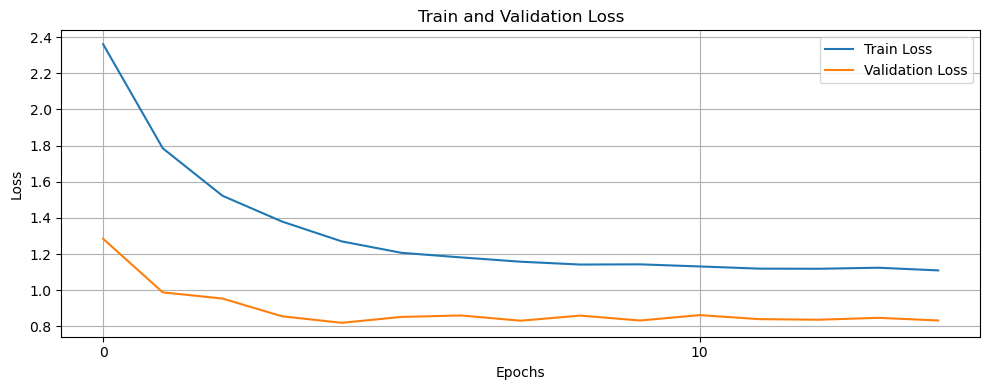

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 274ms/step
    LSTM_Regression (run 9): R² = 0.2702
   ▶️ Run 10/10


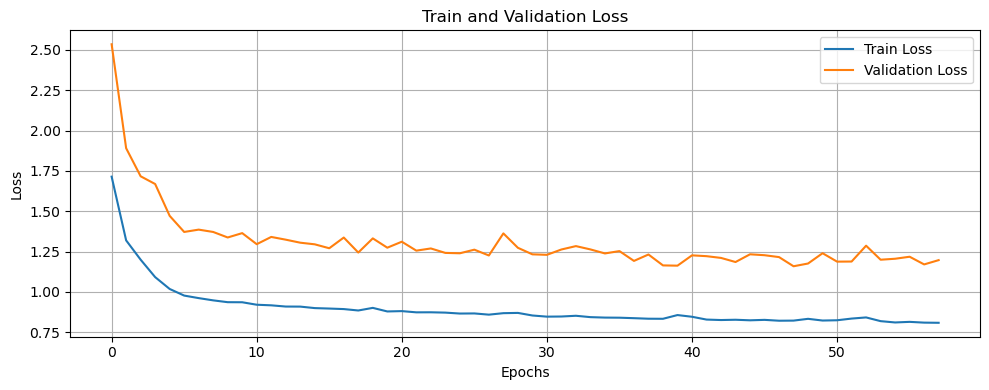

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 283ms/step
    LSTM_Regression (run 10): R² = 0.2803

📊 Moyenne des 10 runs pour Laitue :
    ▶️ R² moyen = 0.3764

🌾 Culture : Oignon
   ▶️ Run 1/10


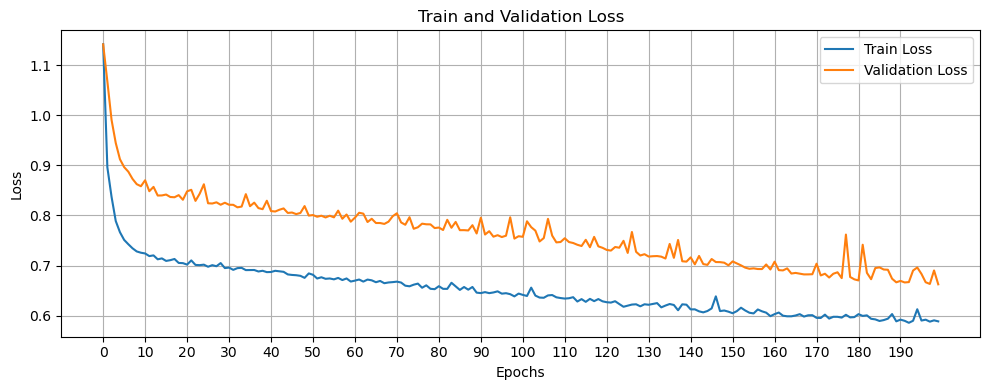

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 172ms/step
    LSTM_Regression (run 1): R² = 0.2846
   ▶️ Run 2/10


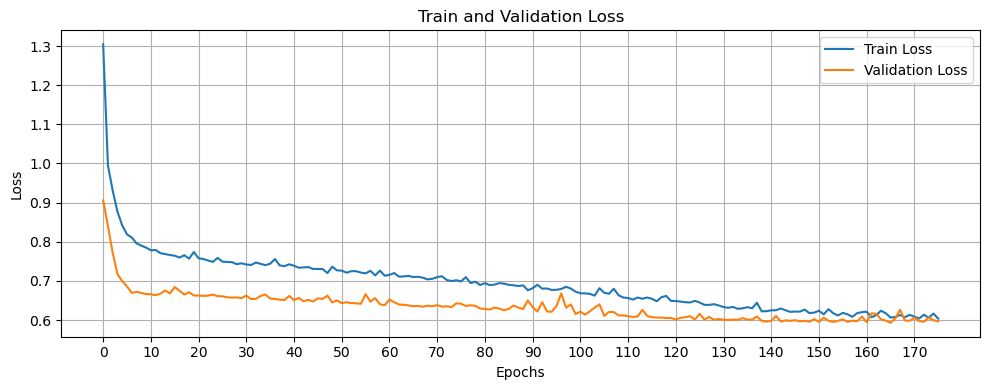

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step
    LSTM_Regression (run 2): R² = 0.1278
   ▶️ Run 3/10


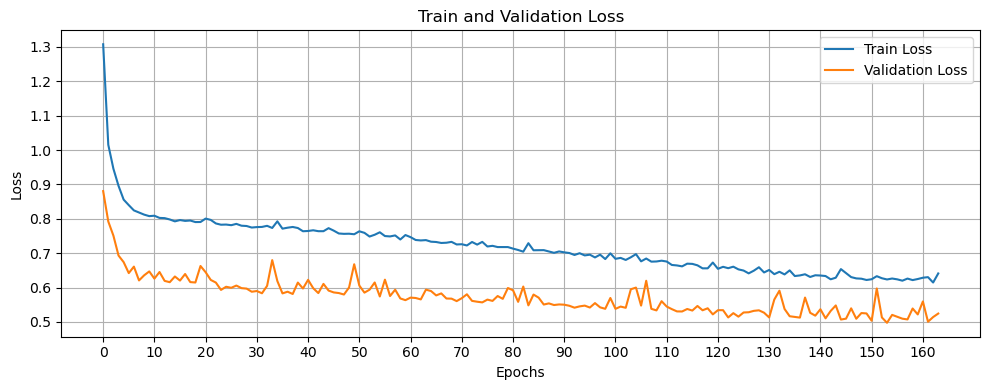

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 171ms/step
    LSTM_Regression (run 3): R² = 0.2286
   ▶️ Run 4/10


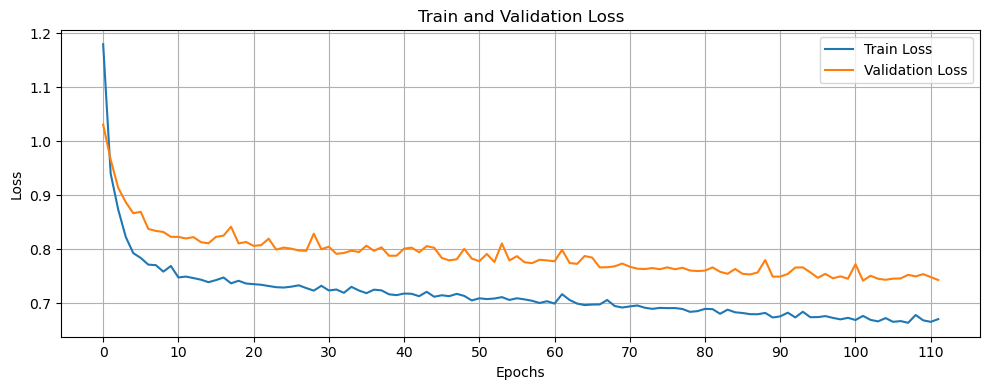

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step
    LSTM_Regression (run 4): R² = 0.2921
   ▶️ Run 5/10


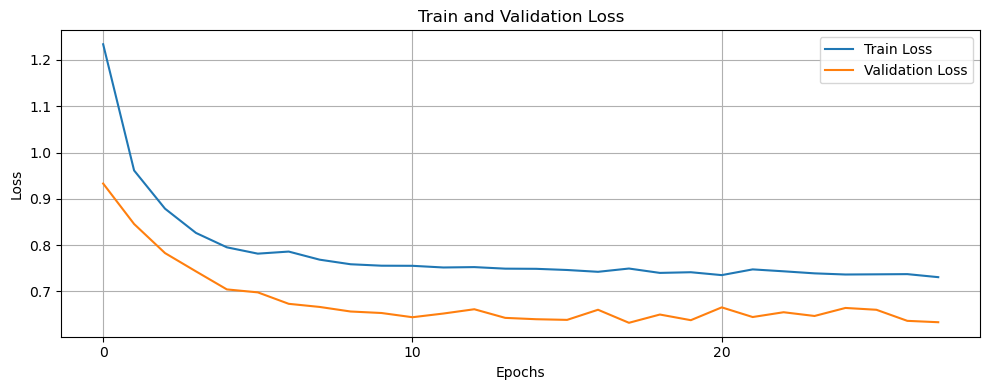

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 174ms/step
    LSTM_Regression (run 5): R² = 0.0763
   ▶️ Run 6/10


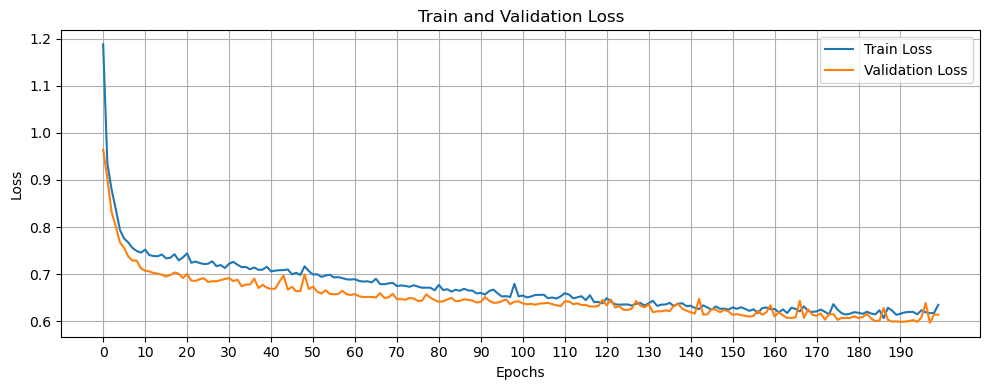

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 184ms/step
    LSTM_Regression (run 6): R² = 0.2407
   ▶️ Run 7/10


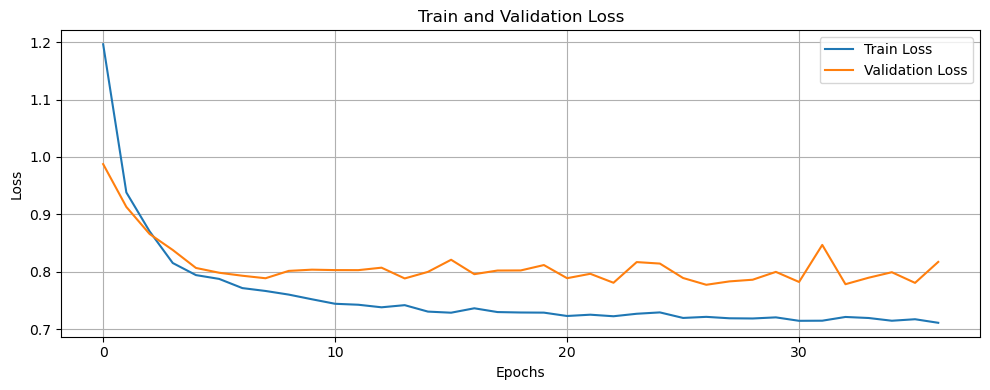

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step
    LSTM_Regression (run 7): R² = 0.2287
   ▶️ Run 8/10


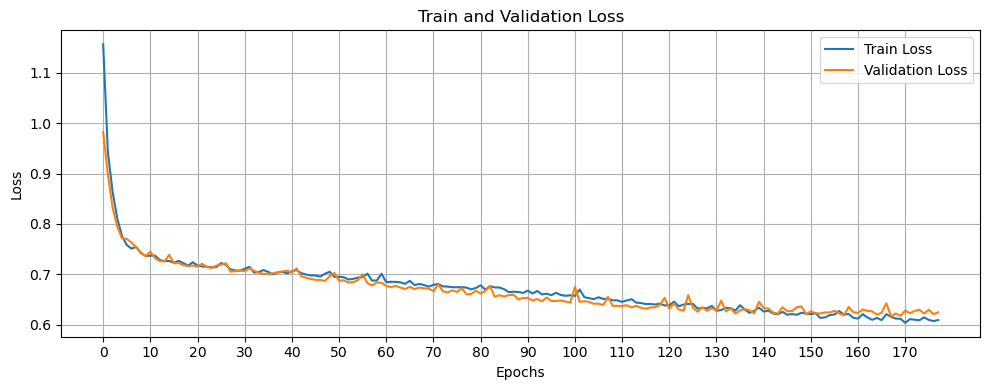

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step
    LSTM_Regression (run 8): R² = 0.2562
   ▶️ Run 9/10


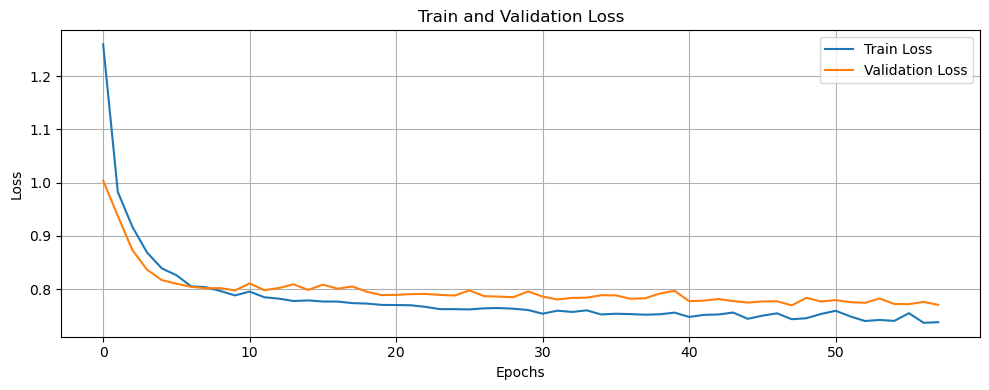

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step
    LSTM_Regression (run 9): R² = 0.2642
   ▶️ Run 10/10


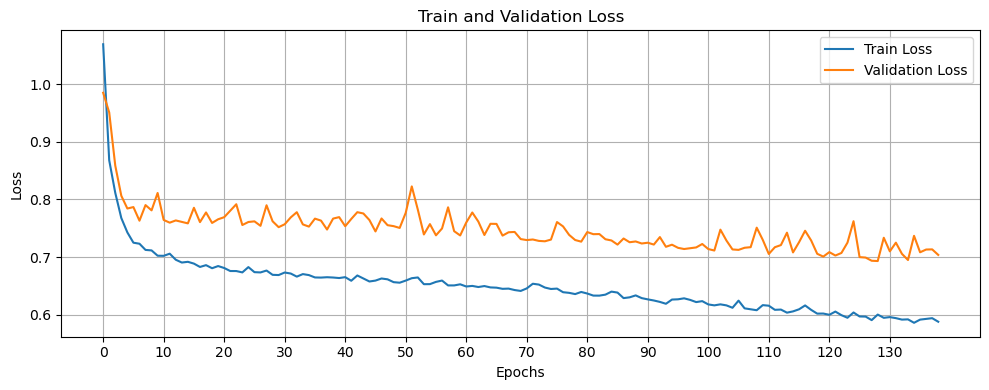

6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step
    LSTM_Regression (run 10): R² = 0.3542

📊 Moyenne des 10 runs pour Oignon :
    ▶️ R² moyen = 0.2354


In [29]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_absolute_error
from tensorflow.keras import regularizers
import numpy as np
import matplotlib.pyplot as plt

def LSTMRegressionModel(x, y, run_number=None):
    # Normaliser
    scaler = MinMaxScaler()
    x_scaled = scaler.fit_transform(x)
    x = x_scaled
    y = y.values if hasattr(y, 'values') else y

    # Split
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True)

    # Reshape pour LSTM : (samples, timesteps=1, features)
    x_train = np.reshape(x_train, (x_train.shape[0], 1, x_train.shape[1]))
    x_test = np.reshape(x_test, (x_test.shape[0], 1, x_test.shape[1]))

    # LSTM Model pour régression
    model = tf.keras.Sequential([
        tf.keras.Input(shape=(1, x_train.shape[2])),
        tf.keras.layers.LSTM(64, return_sequences=True, kernel_regularizer=regularizers.l1(0.0002)),
        tf.keras.layers.LSTM(32, return_sequences=False, kernel_regularizer=regularizers.l1(0.0002)),
        #tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(16, activation='tanh', kernel_regularizer=regularizers.l1(0.0002)),
        tf.keras.layers.Dense(8, activation='tanh', kernel_regularizer=regularizers.l1(0.0002)),
        #tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(1)  # Pas d'activation pour régression
    ])

    model.compile(optimizer='adam', loss='mse', metrics=['mae'])

    early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    history = model.fit(
        x_train, y_train,
        epochs=200,
        batch_size=16,
        validation_split=0.2,
        callbacks=[early_stop],
        verbose=0
    )

    # Courbe de perte
    if run_number is not None:
        plt.figure(figsize=(10, 4))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title("Train and Validation Loss")
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.xticks(np.arange(0, len(history.history['loss']), 10))
        plt.grid(True)
        plt.savefig("LSTM_reg_loss")
        plt.legend()
        plt.tight_layout()
        plt.show()

    # Prédiction
    y_pred = model.predict(x_test).flatten()

    return r2_score(y_test, y_pred)

# === Appel principal ===
N_RUNS = 10
models = (("LSTM_Regression", LSTMRegressionModel),)

for crop in DATASETS:
    print(f"\n🌾 Culture : {crop}")
    x, y = preprocess_data_regression(crop, DATASETS[crop]["y"], DATASETS[crop]["x"])
    x = normalize(x)
    y = y.values if hasattr(y, 'values') else y

    r2_list = []

    for run in range(N_RUNS):
        print(f"   ▶️ Run {run + 1}/{N_RUNS}")
        for name, model in models:
            r2 = model(x, y, run_number=run + 1)
            r2_list.append(r2)
            print(f"    {name} (run {run + 1}): R² = {r2:.4f}")

    print(f"\n📊 Moyenne des {N_RUNS} runs pour {crop} :")
    print(f"    ▶️ R² moyen = {np.mean(r2_list):.4f}")


# RNN GRU


🌾 Culture : Carotte

▶️ Run 1/10


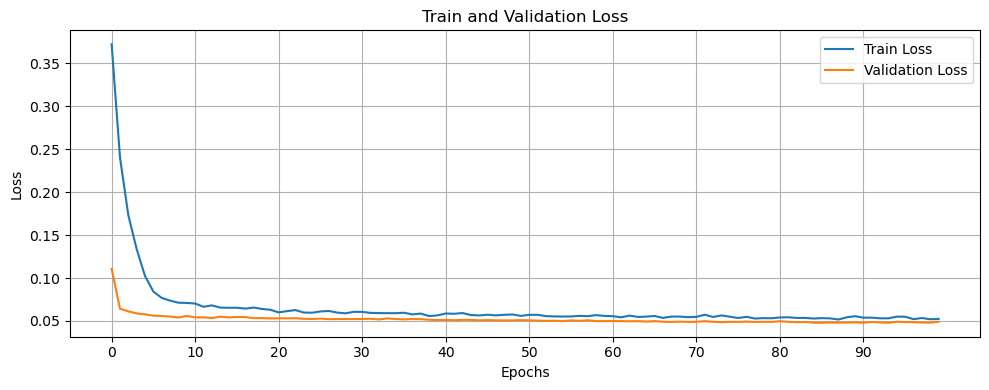

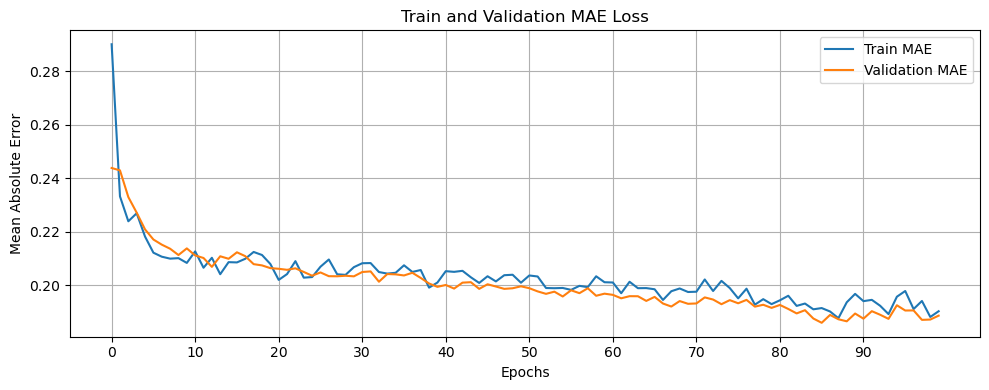


▶️ Run 2/10
⏹️ Early stopping triggered at epoch 48


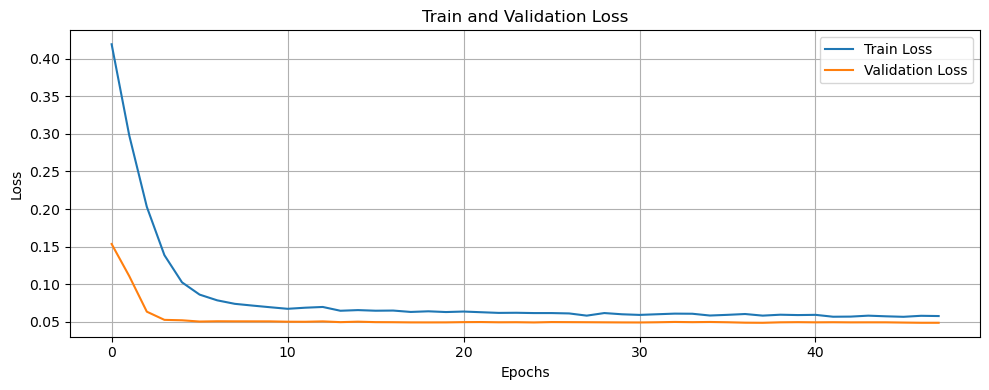

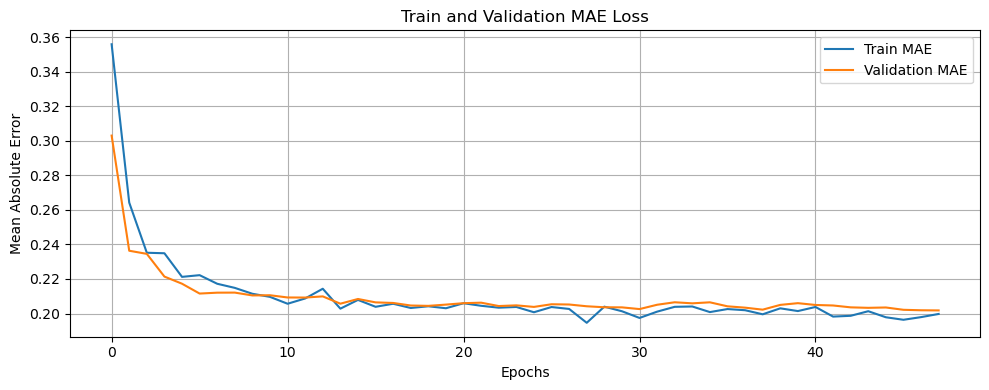


▶️ Run 3/10
⏹️ Early stopping triggered at epoch 28


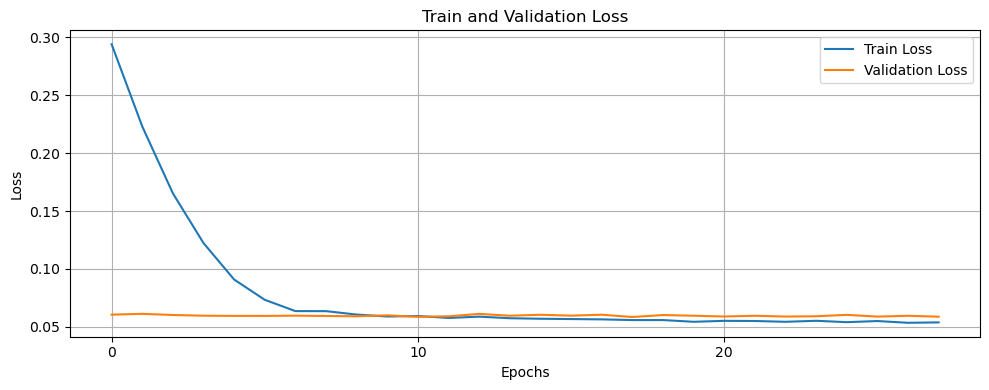

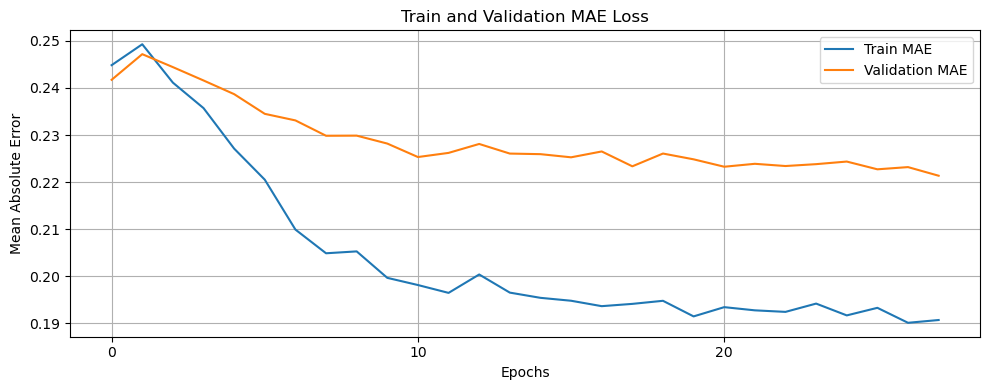


▶️ Run 4/10
⏹️ Early stopping triggered at epoch 73


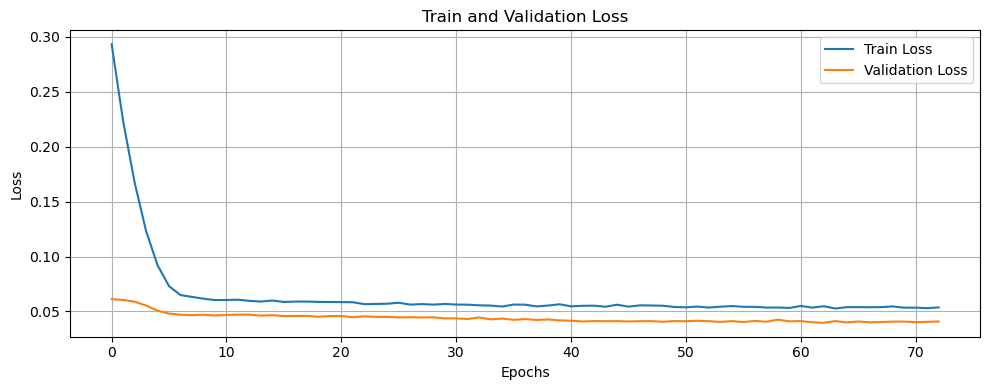

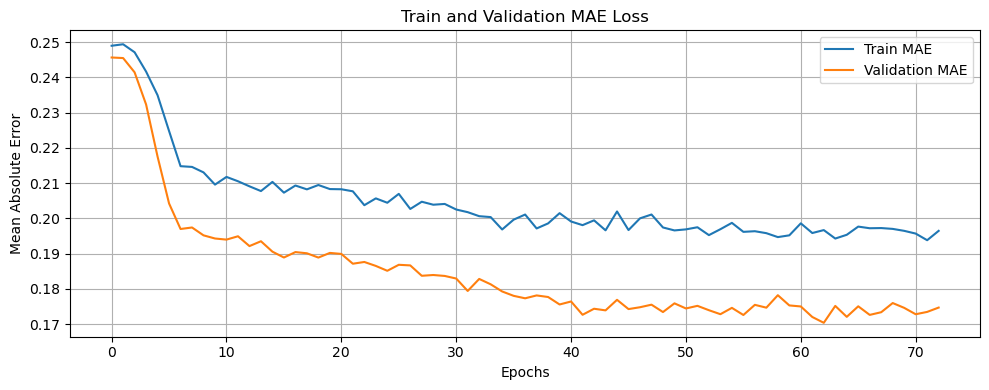


▶️ Run 5/10
⏹️ Early stopping triggered at epoch 64


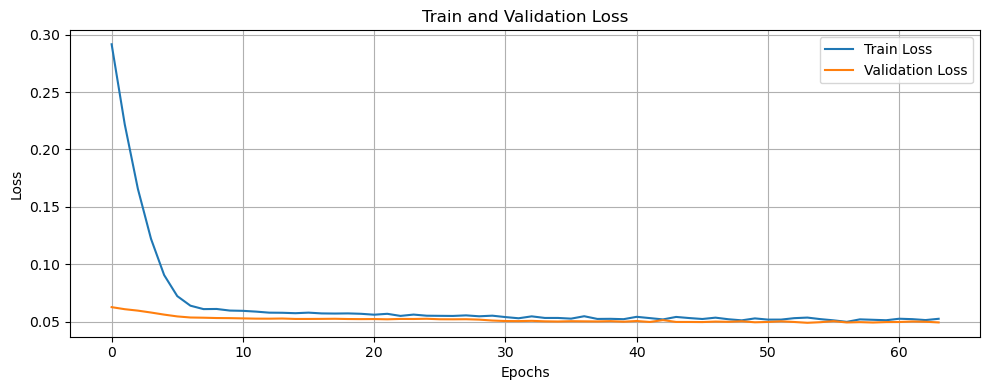

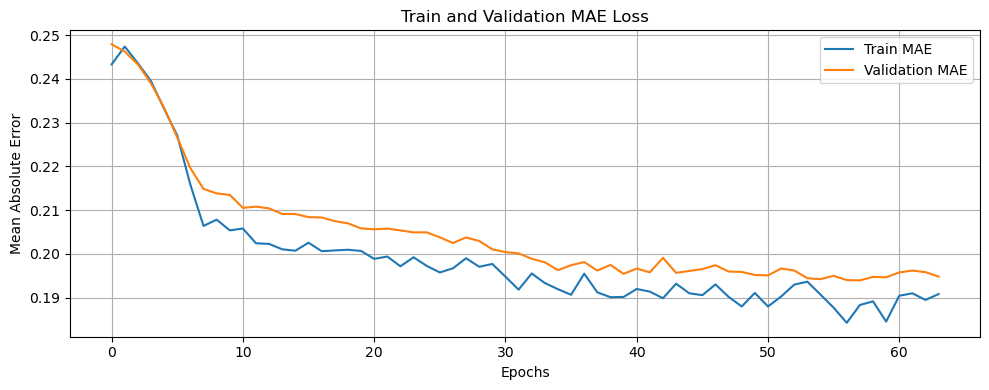


▶️ Run 6/10
⏹️ Early stopping triggered at epoch 44


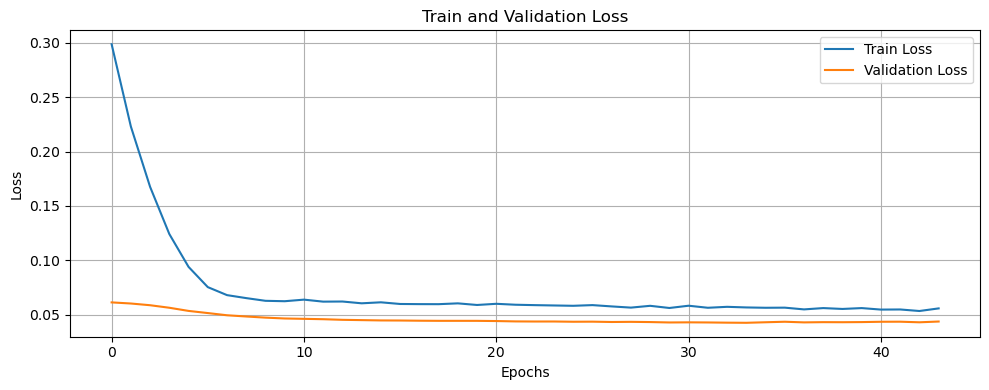

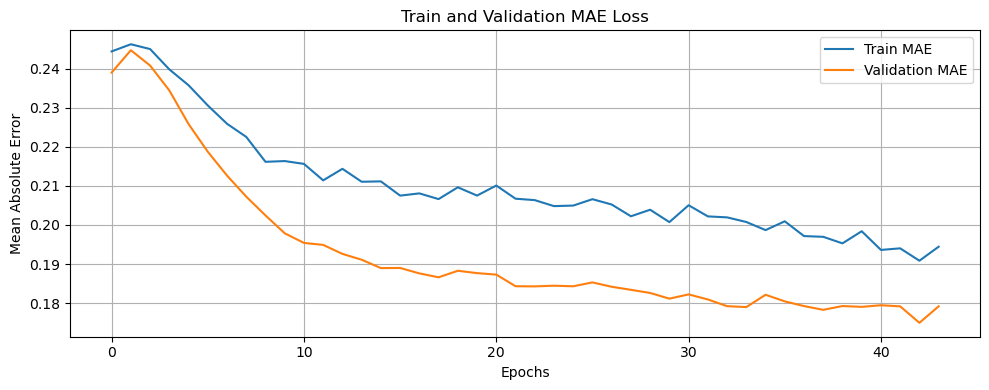


▶️ Run 7/10
⏹️ Early stopping triggered at epoch 35


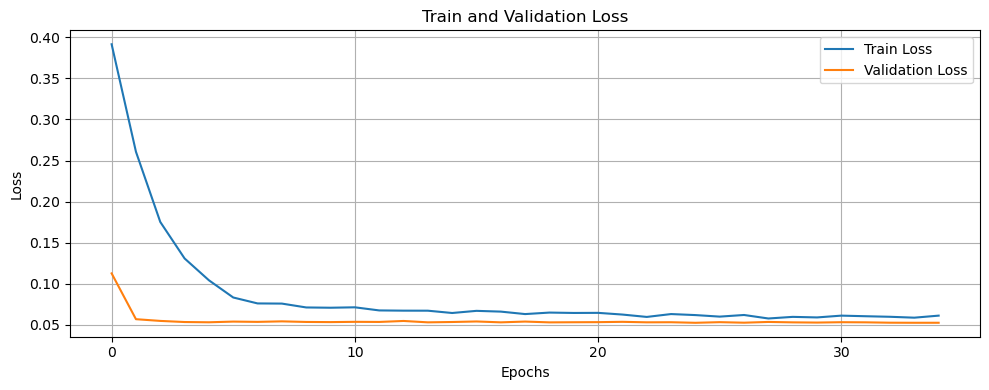

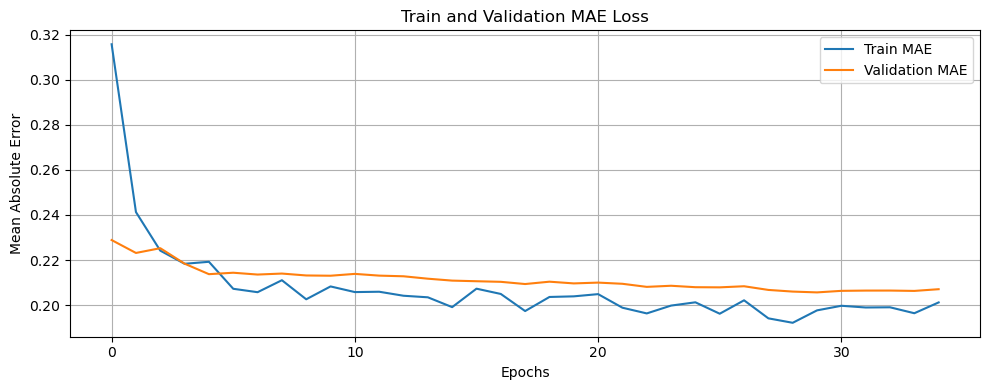


▶️ Run 8/10
⏹️ Early stopping triggered at epoch 27


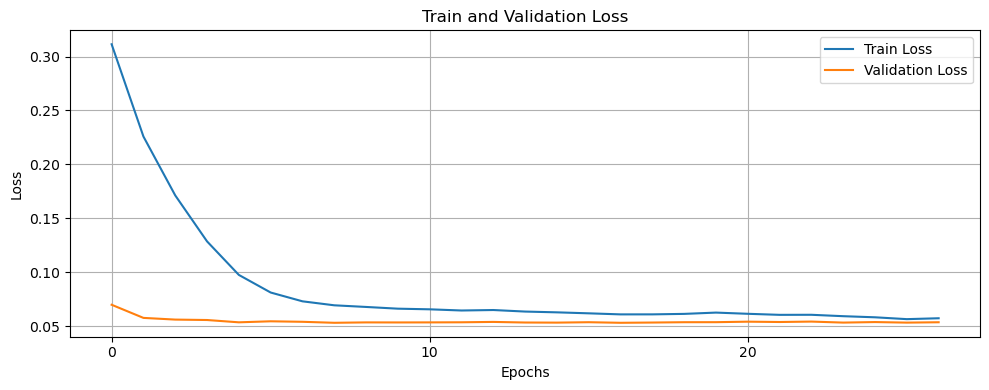

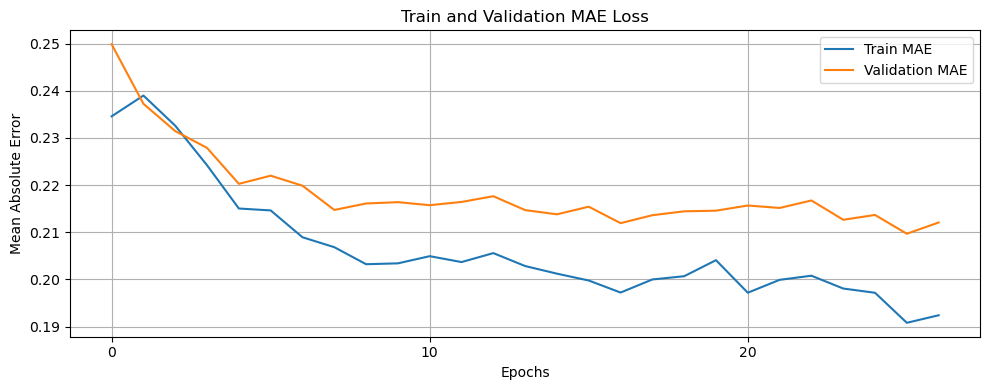


▶️ Run 9/10
⏹️ Early stopping triggered at epoch 77


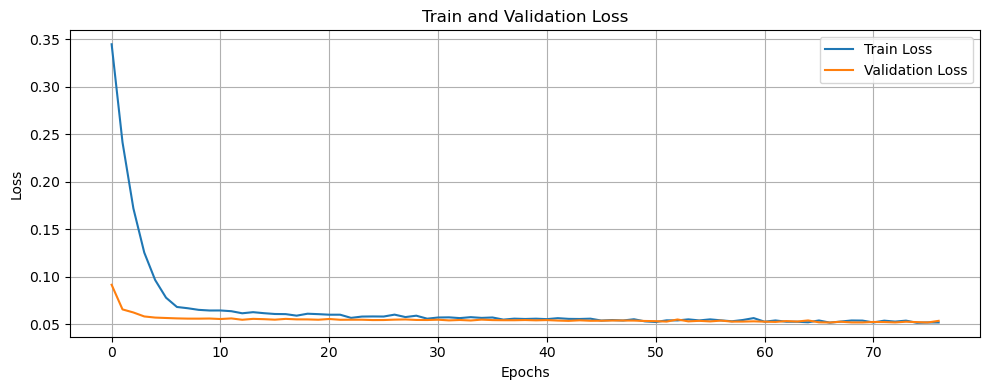

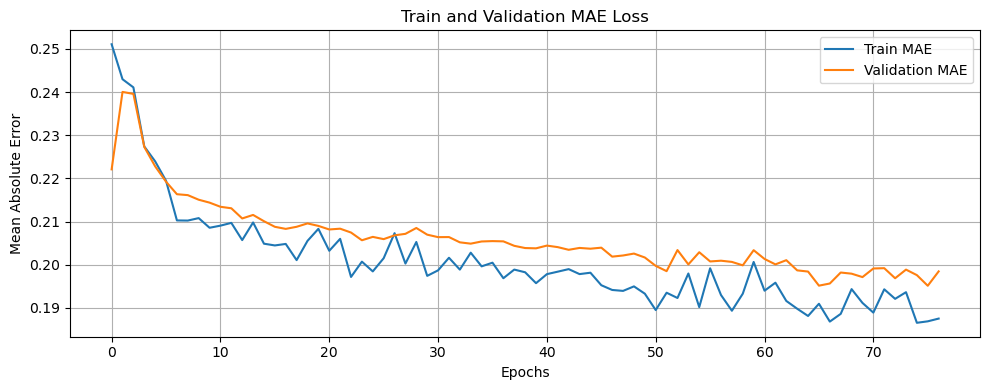


▶️ Run 10/10
⏹️ Early stopping triggered at epoch 28


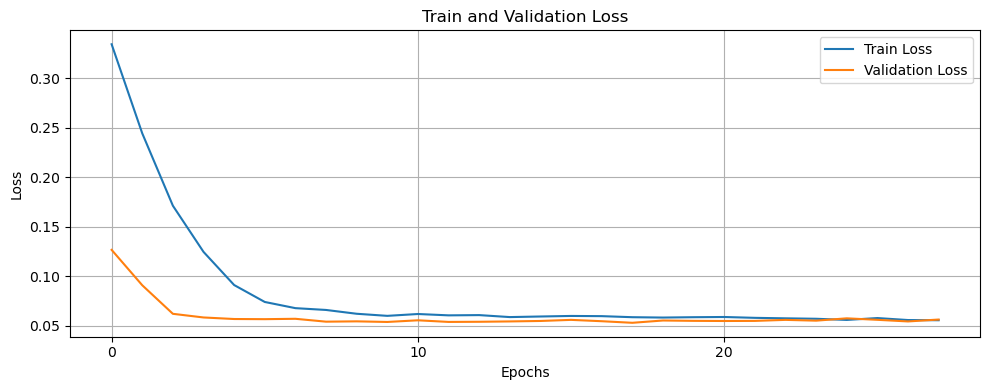

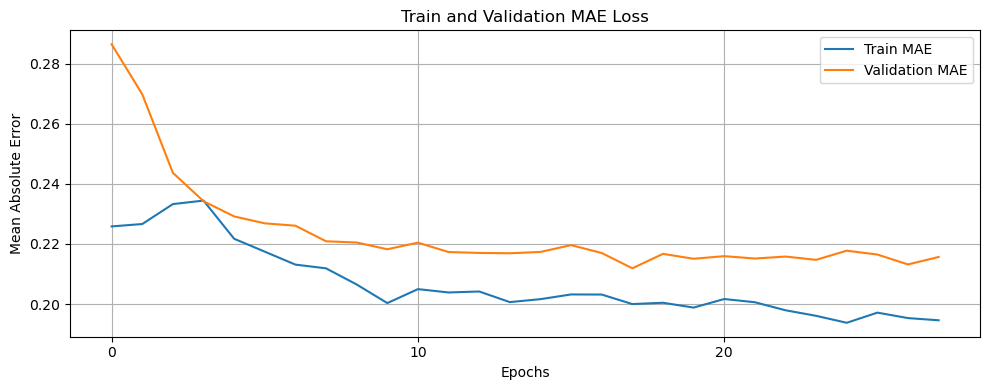

📊 Moyenne du R² pour Carotte : 0.1929

🌾 Culture : Laitue

▶️ Run 1/10


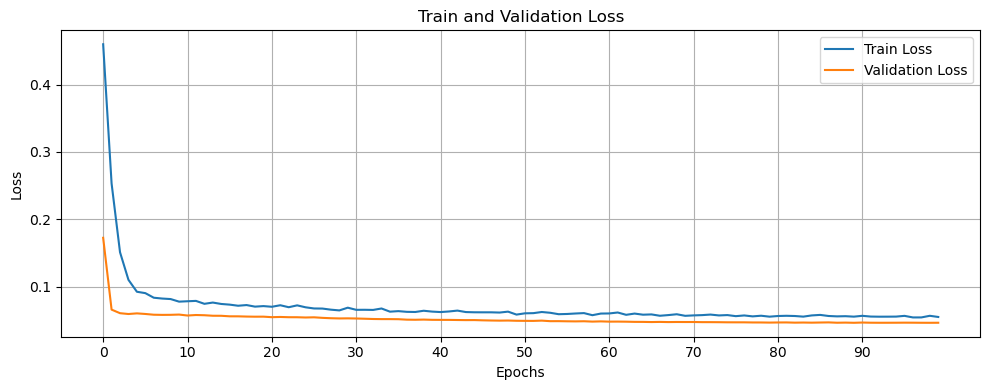

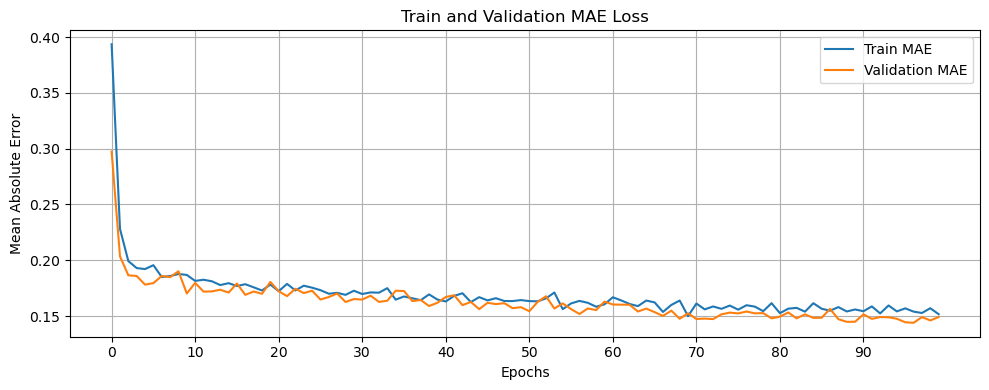


▶️ Run 2/10


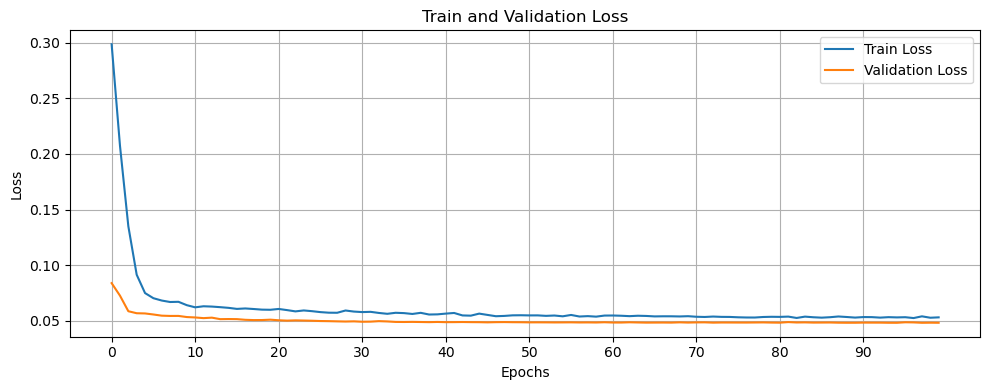

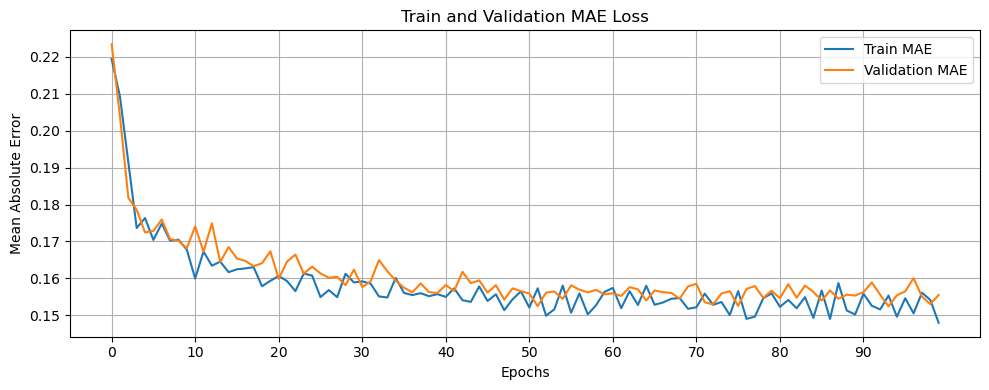


▶️ Run 3/10
⏹️ Early stopping triggered at epoch 94


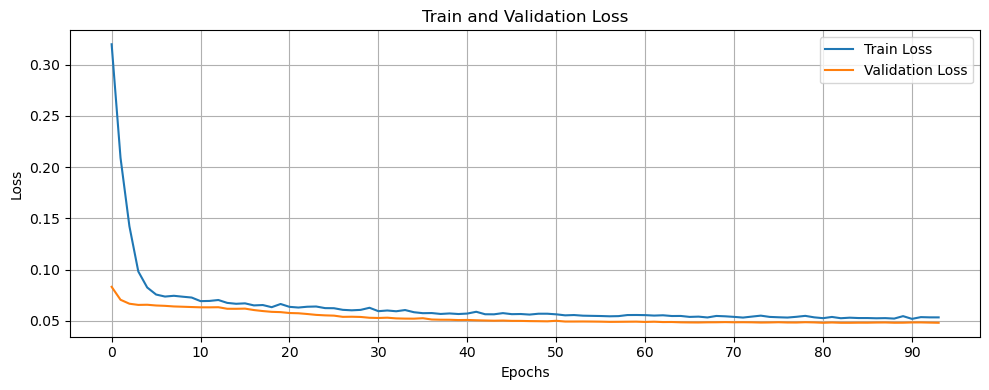

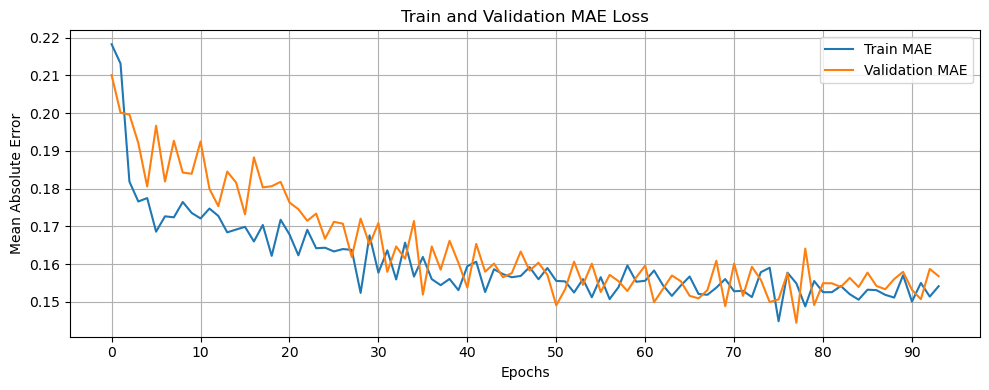


▶️ Run 4/10
⏹️ Early stopping triggered at epoch 59


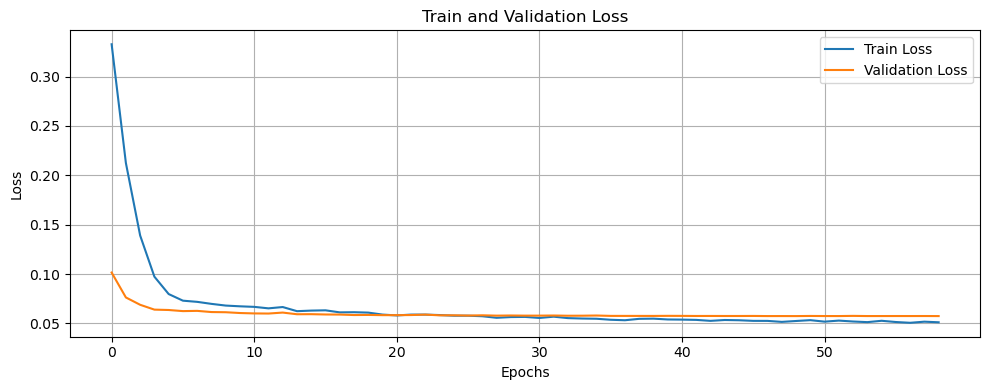

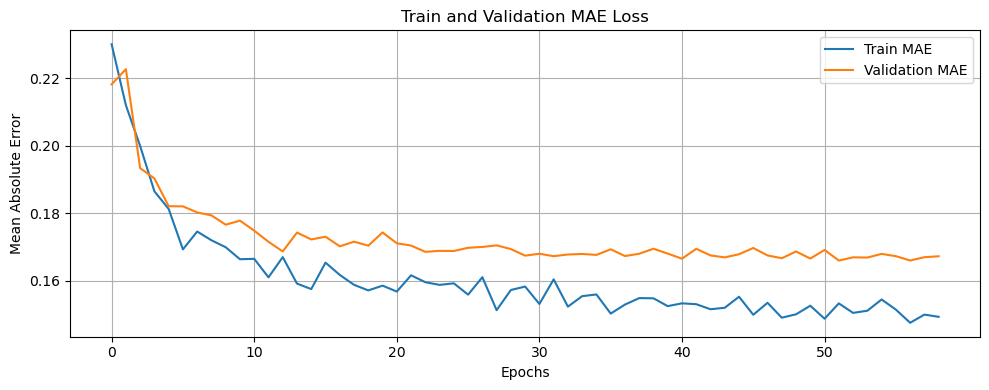


▶️ Run 5/10
⏹️ Early stopping triggered at epoch 51


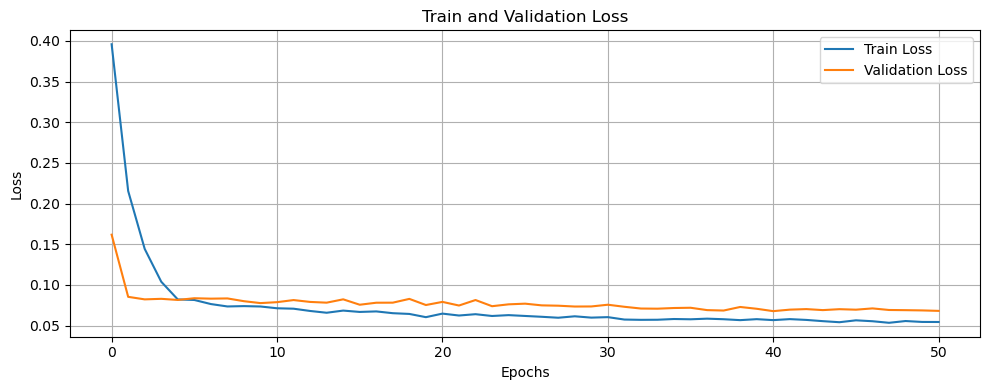

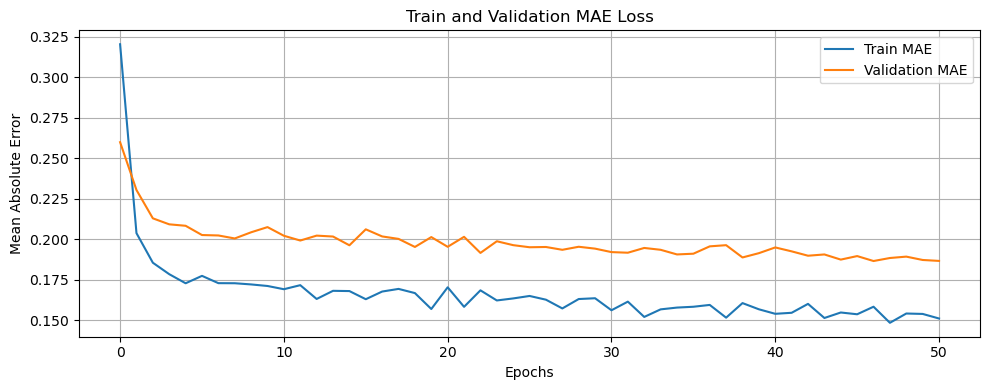


▶️ Run 6/10
⏹️ Early stopping triggered at epoch 77


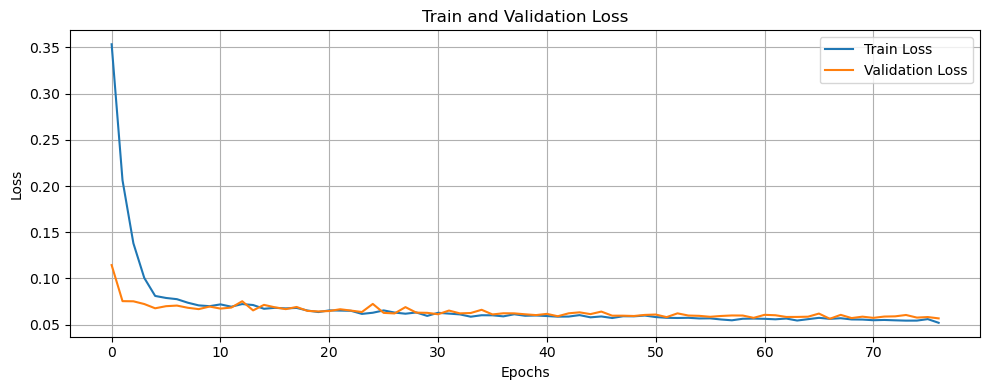

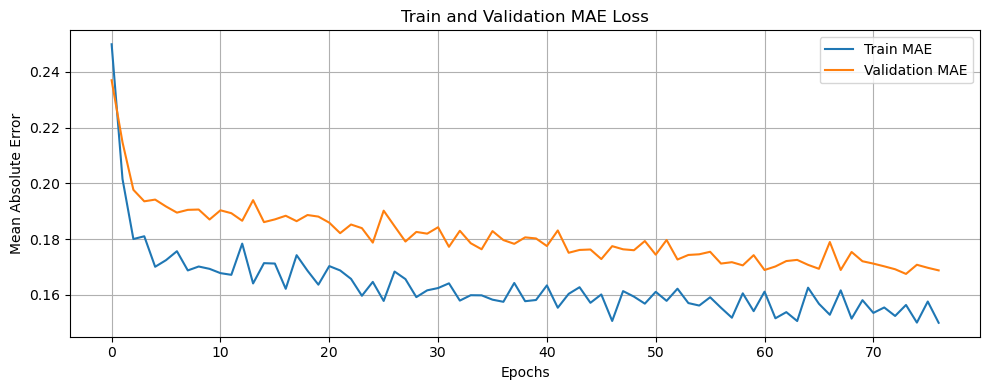


▶️ Run 7/10
⏹️ Early stopping triggered at epoch 66


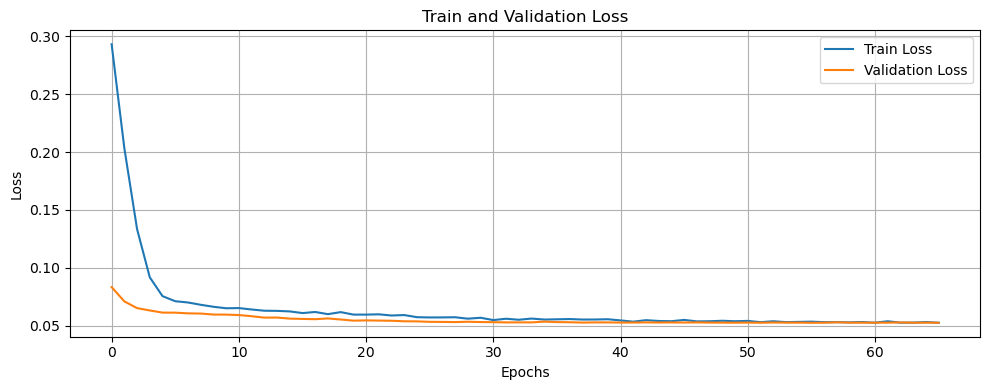

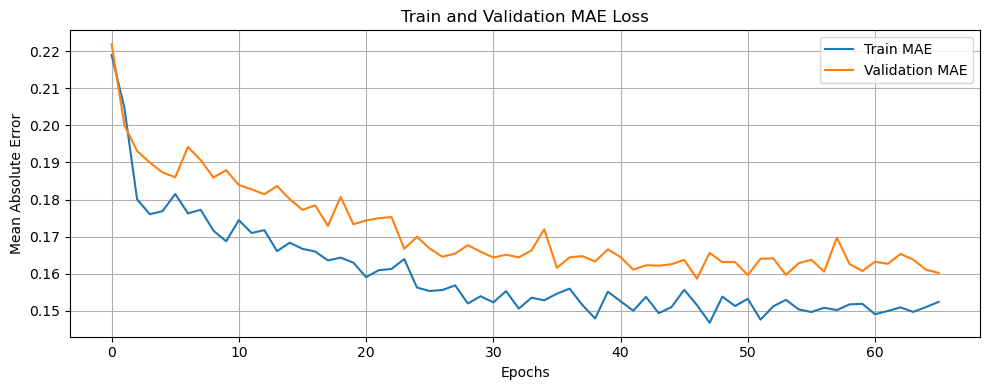


▶️ Run 8/10


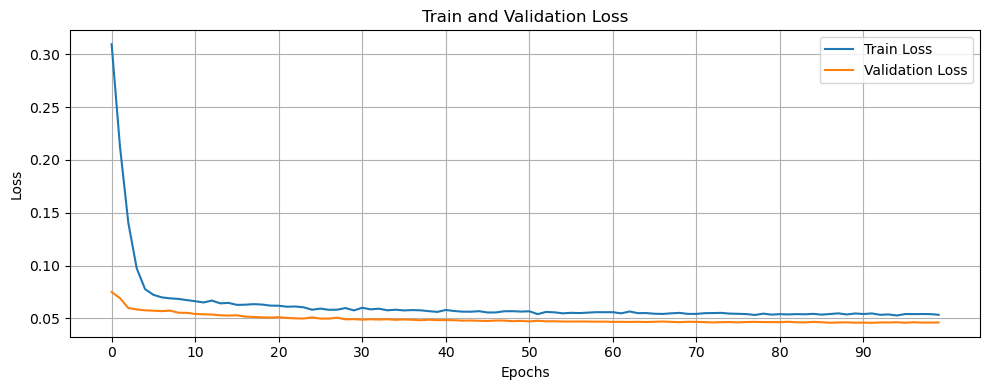

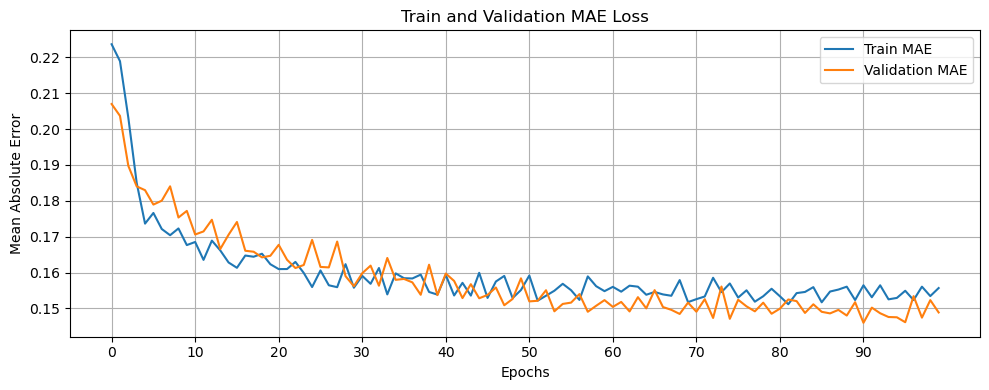


▶️ Run 9/10
⏹️ Early stopping triggered at epoch 37


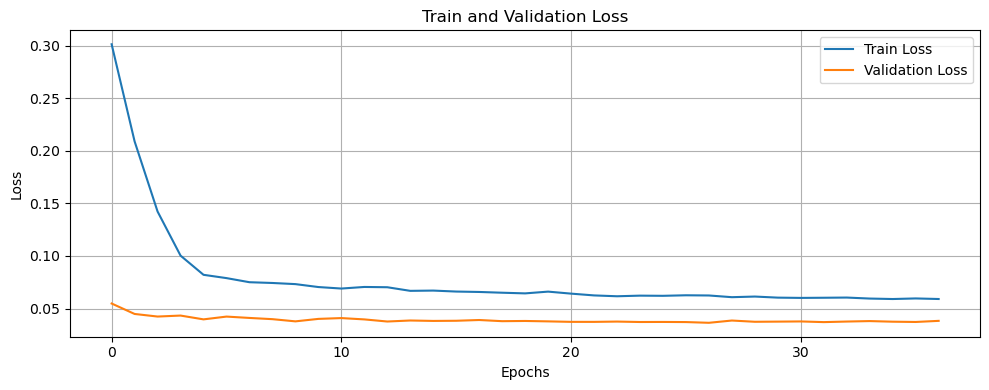

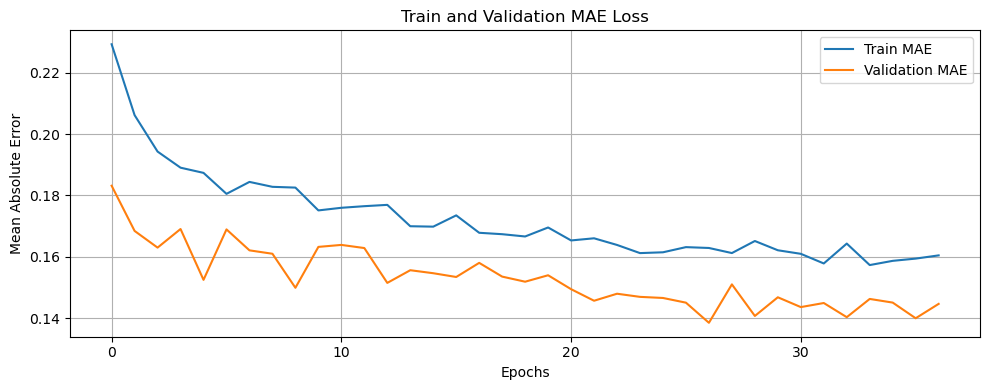


▶️ Run 10/10
⏹️ Early stopping triggered at epoch 84


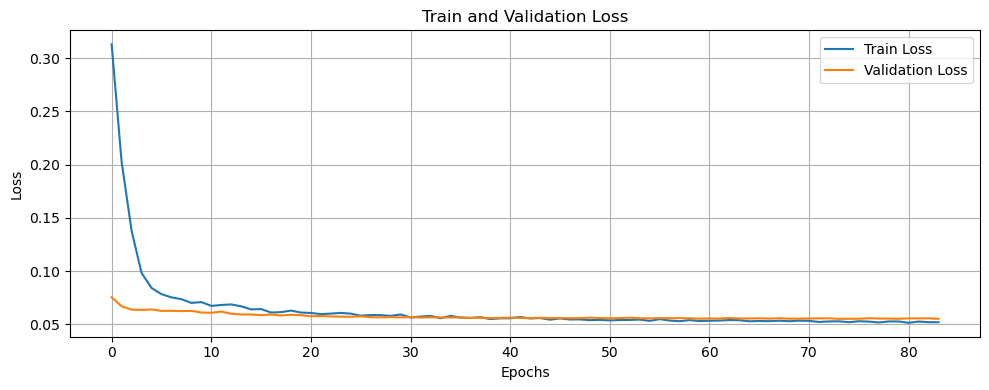

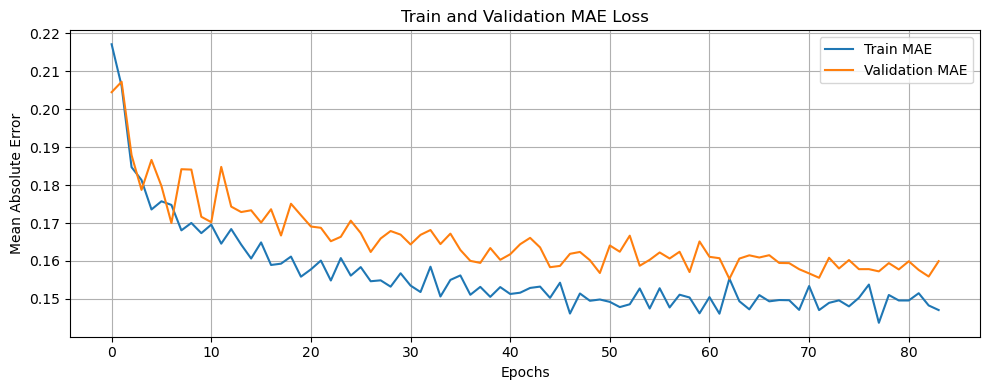

📊 Moyenne du R² pour Laitue : 0.4052

🌾 Culture : Oignon

▶️ Run 1/10
⏹️ Early stopping triggered at epoch 12


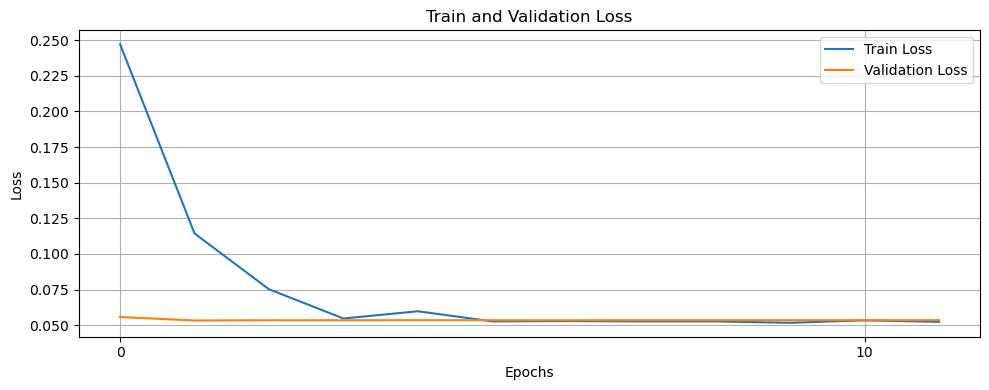

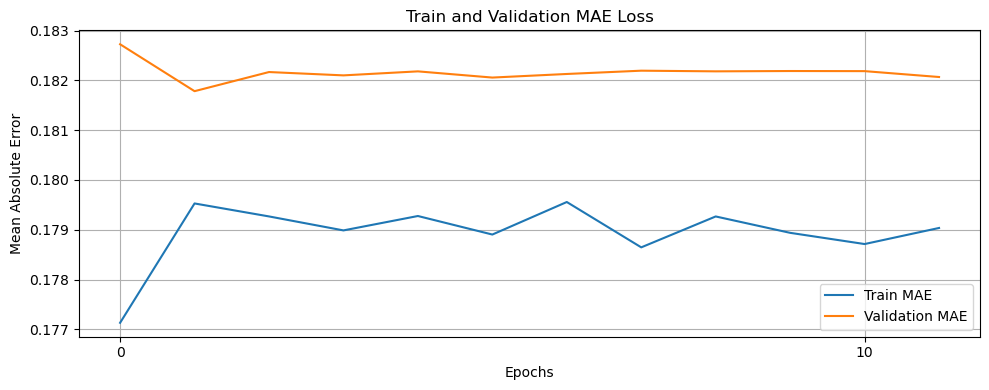


▶️ Run 2/10
⏹️ Early stopping triggered at epoch 63


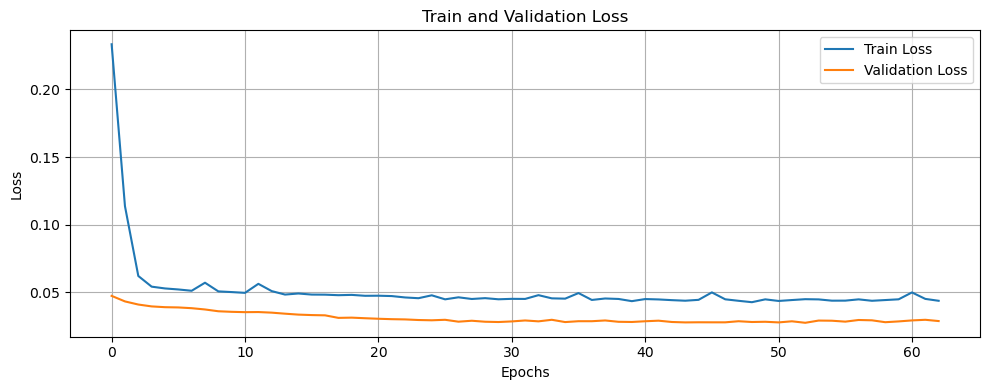

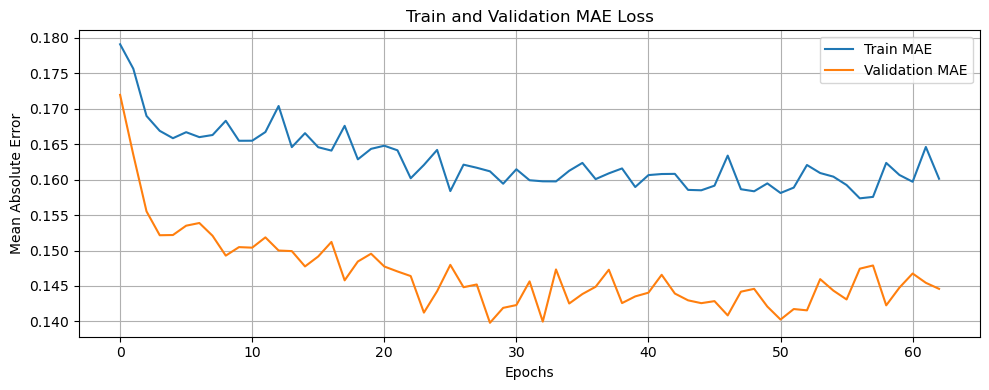


▶️ Run 3/10
⏹️ Early stopping triggered at epoch 48


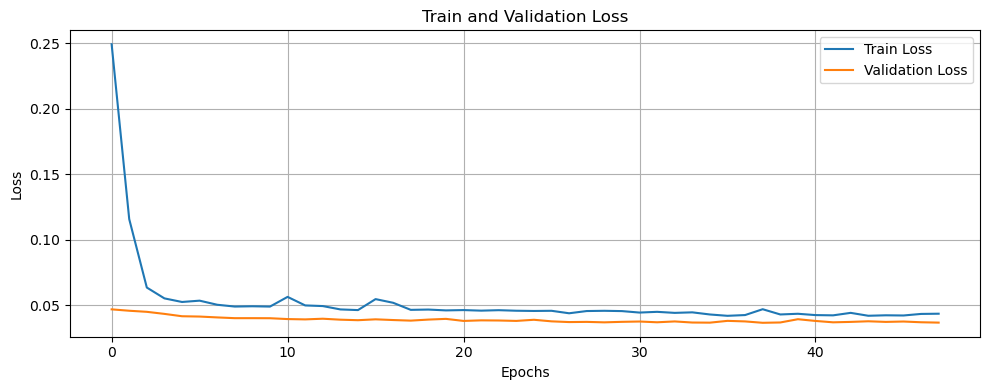

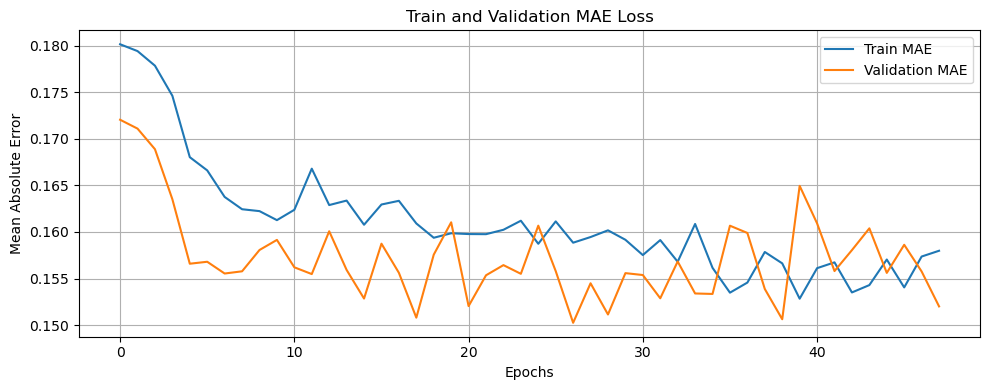


▶️ Run 4/10
⏹️ Early stopping triggered at epoch 70


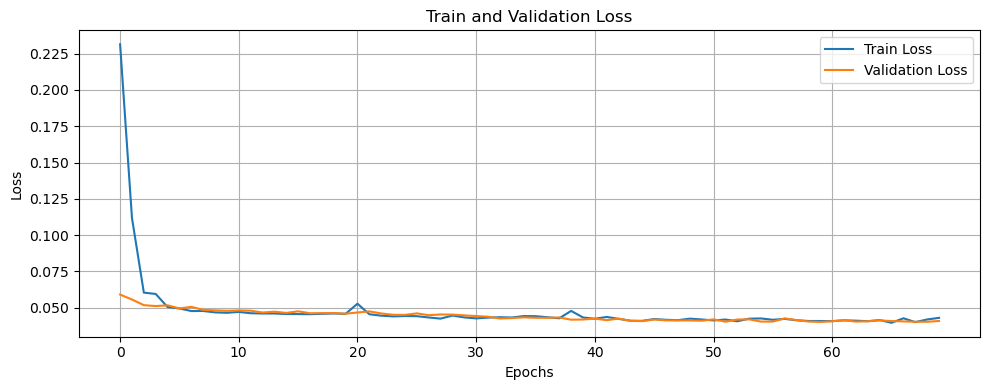

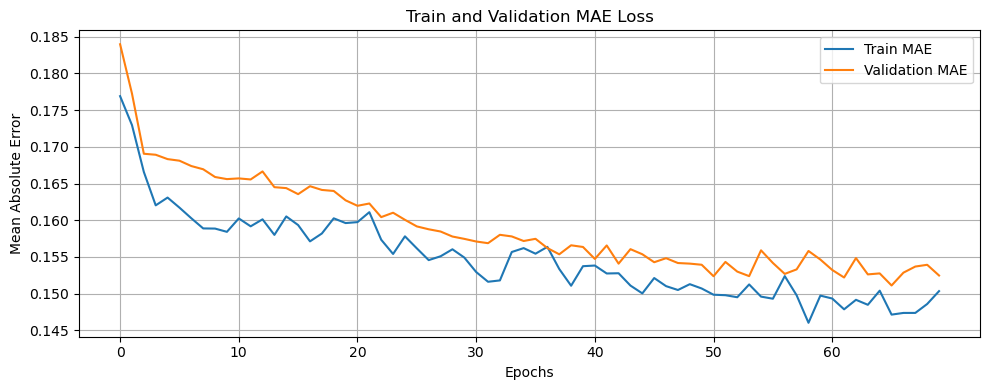


▶️ Run 5/10
⏹️ Early stopping triggered at epoch 12


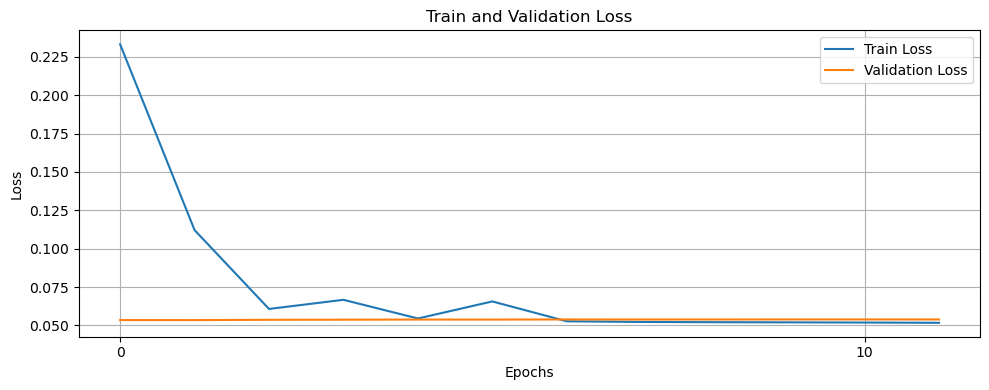

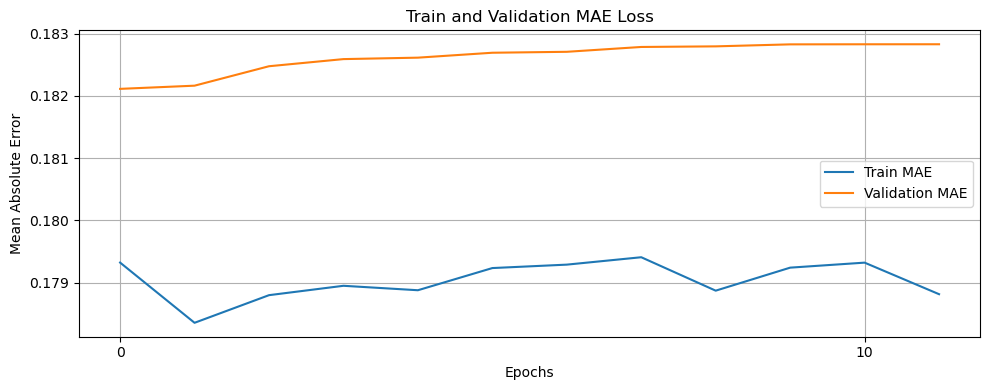


▶️ Run 6/10
⏹️ Early stopping triggered at epoch 26


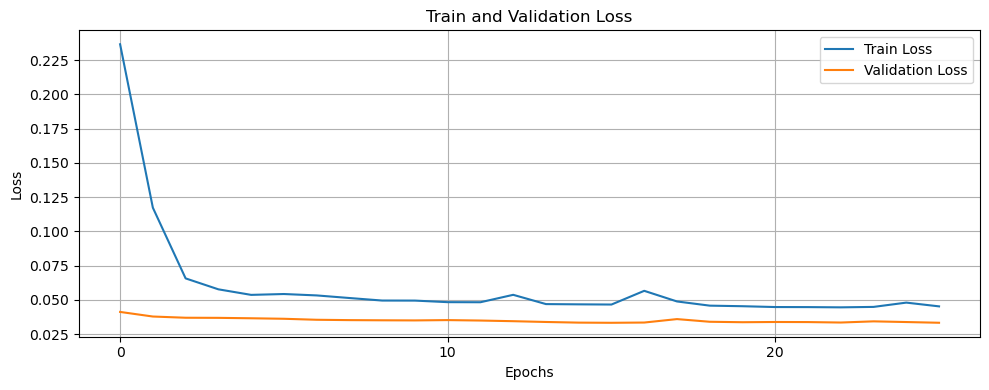

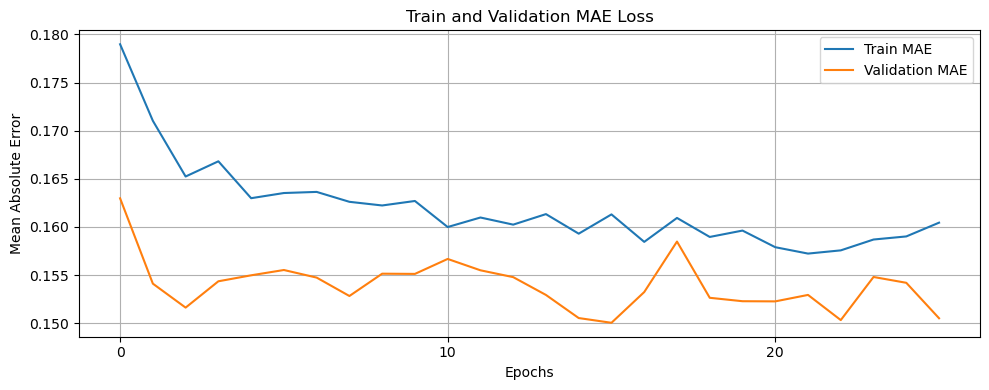


▶️ Run 7/10
⏹️ Early stopping triggered at epoch 45


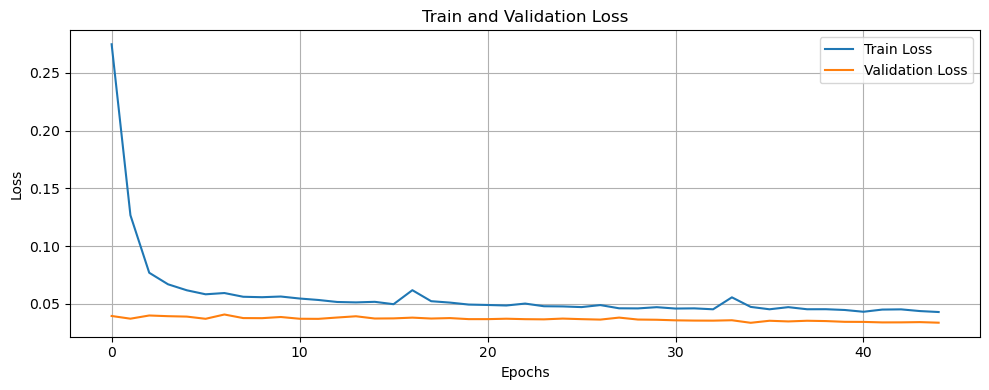

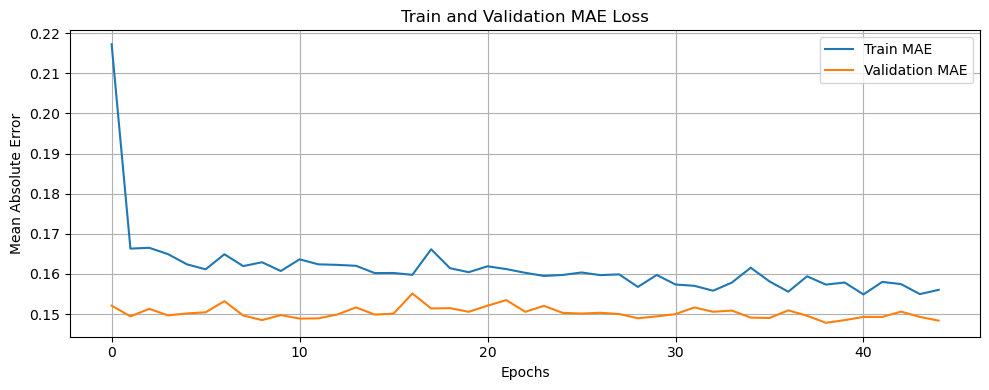


▶️ Run 8/10
⏹️ Early stopping triggered at epoch 68


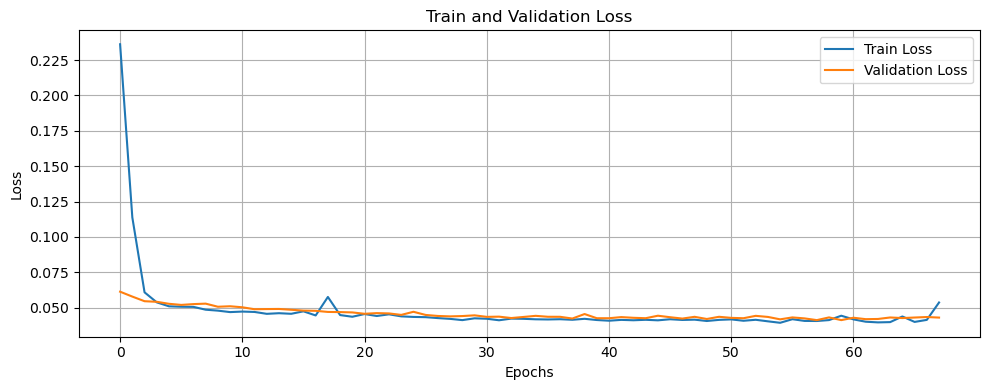

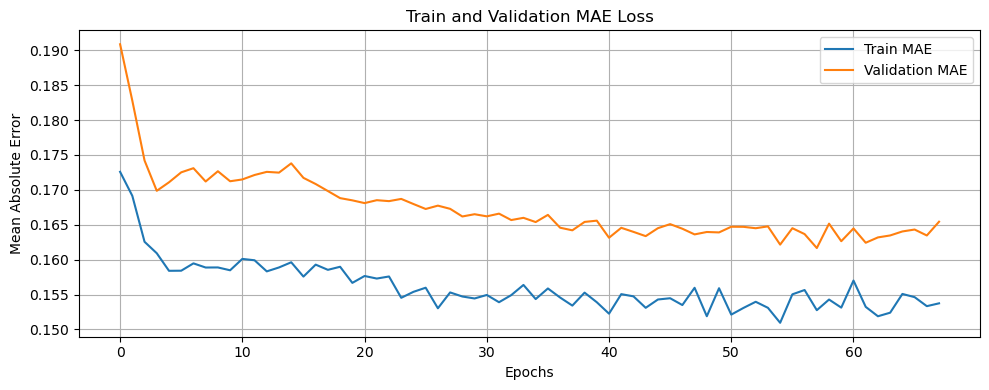


▶️ Run 9/10
⏹️ Early stopping triggered at epoch 29


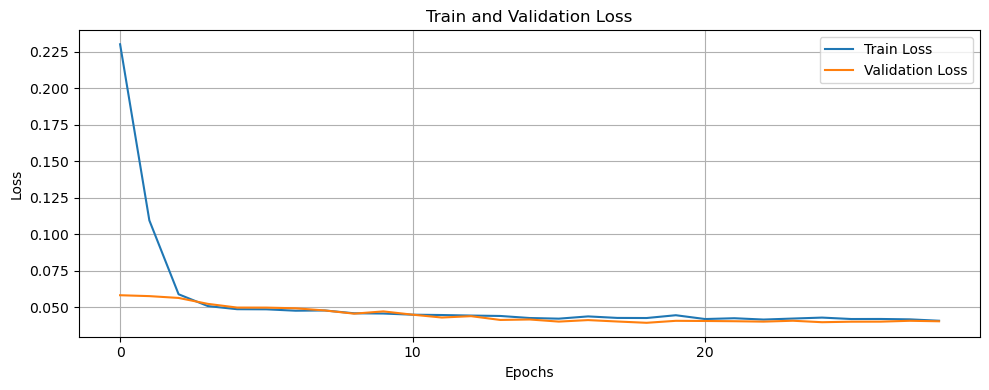

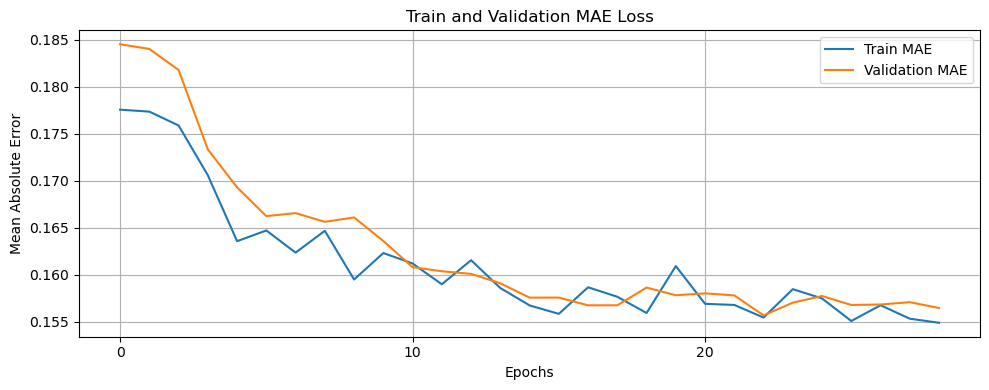


▶️ Run 10/10
⏹️ Early stopping triggered at epoch 73


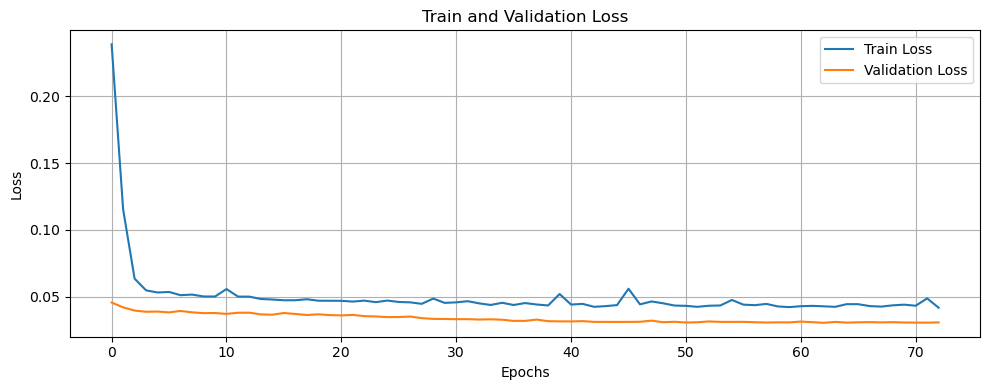

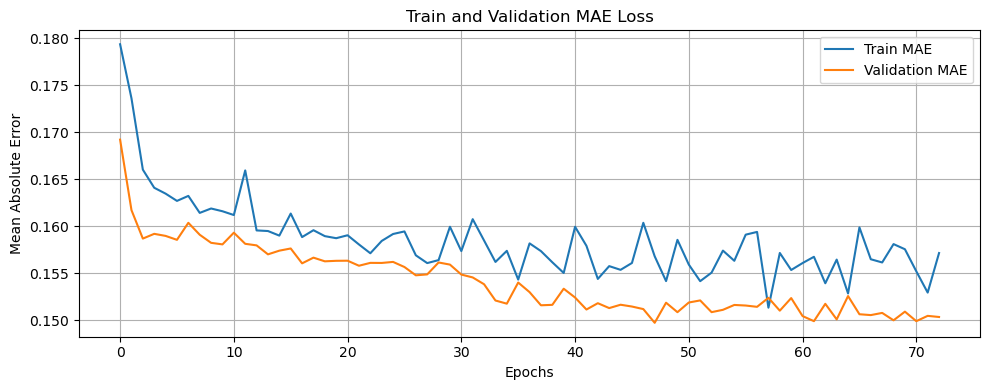

📊 Moyenne du R² pour Oignon : 0.2446


In [34]:
# Re-import necessary libraries after kernel reset
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error
from torch.utils.data import DataLoader, TensorDataset

# Fix seed
torch.manual_seed(32)
np.random.seed(32)

# === GRU Regressor Model ===
class GRURegressor(nn.Module):
    def __init__(self, input_dim, hidden_dim=64, num_layers=2, dropout=0.3):
        super(GRURegressor, self).__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout)
        self.fc = nn.Sequential(
            nn.Linear(hidden_dim, 32),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, 1)  # No activation for regression
        )

    def forward(self, x):
        _, h_n = self.gru(x)
        return self.fc(h_n[-1])

# === Training Function ===
def train_gru_regression_model(x, y, n_runs=5):
    r2_list = []
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    for run in range(n_runs):
        print(f"\n▶️ Run {run+1}/{n_runs}")

        scaler = StandardScaler()
        x_scaled = scaler.fit_transform(x)
        

        x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.2, shuffle=True)

        x_train = torch.tensor(x_train[:, np.newaxis, :], dtype=torch.float32)
        x_test = torch.tensor(x_test[:, np.newaxis, :], dtype=torch.float32)
        y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
        y_test = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)

        train_dataset = TensorDataset(x_train, y_train)
        test_dataset = TensorDataset(x_test, y_test)
        train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
        test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

        model = GRURegressor(input_dim=x.shape[1]).to(device)
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=0.001)

        train_losses, val_losses = [], []
        train_mae, val_mae = [], []


        patience = 10
        best_val_loss = float('inf')
        epochs_no_improve = 0
        best_model_state = None
        l1_lambda = 1e-4
        
        for epoch in range(100):
            model.train()
            epoch_loss = 0
            all_preds_train, all_trues_train = [], []

            for inputs, targets in train_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                #loss = criterion(outputs, targets)
                # ➕ Loss avec régularisation L1
                l1_loss = sum(torch.norm(param, 1) for param in model.parameters())
                loss = criterion(outputs, targets) + l1_lambda * l1_loss

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                epoch_loss += loss.item()
                all_preds_train.extend(outputs.detach().cpu().numpy().flatten())
                all_trues_train.extend(targets.cpu().numpy().flatten())

            train_losses.append(epoch_loss / len(train_loader))
            train_mae.append(mean_absolute_error(all_trues_train, all_preds_train))

            # --- Validation ---
            model.eval()
            val_loss = 0
            val_preds, val_trues = [], []
            with torch.no_grad():
                for inputs, targets in test_loader:
                    inputs, targets = inputs.to(device), targets.to(device)
                    outputs = model(inputs)
                    loss = criterion(outputs, targets)
                    val_loss += loss.item()
                    val_preds.extend(outputs.cpu().numpy().flatten())
                    val_trues.extend(targets.cpu().numpy().flatten())

            val_losses.append(val_loss / len(test_loader))
            val_mae.append(mean_absolute_error(val_trues, val_preds))


            # === Early Stopping check (✅ À placer ici)
            if val_losses[-1] < best_val_loss:
                best_val_loss = val_losses[-1]
                epochs_no_improve = 0
                best_model_state = model.state_dict()
            else:
               epochs_no_improve += 1
               if epochs_no_improve >= patience:
                   print(f"⏹️ Early stopping triggered at epoch {epoch + 1}")
                   break


            # Charger le meilleur modèle si applicable
            if best_model_state is not None:
                 model.load_state_dict(best_model_state)
        
        # 🎯 R2 final pour cette run
        r2_list.append(r2_score(val_trues, val_preds))

        # 🖼️ Affichage des courbes à chaque run
        plt.figure(figsize=(10, 4))
        plt.plot(train_losses, label="Train Loss")
        plt.plot(val_losses, label="Validation Loss")
        plt.title("Train and Validation Loss")
        plt.xticks(np.arange(0, len(train_losses), 10))
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(10, 4))
        plt.plot(train_mae, label="Train MAE")
        plt.plot(val_mae, label="Validation MAE")
        plt.title("Train and Validation MAE Loss")
        plt.xticks(np.arange(0, len(train_mae), 10))
        plt.xlabel("Epochs")
        plt.ylabel("Mean Absolute Error")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    return np.mean(r2_list)

# === Appel principal ===
for crop in DATASETS:
    print(f"\n🌾 Culture : {crop}")
    x, y = preprocess_data_regression(crop, DATASETS[crop]["y"], DATASETS[crop]["x"])
    y = y.values if hasattr(y, 'values') else y
    y = y / max(y)  # Normaliser entre 0 et 1
    r2 = train_gru_regression_model(x, y, n_runs=10)
    print(f"📊 Moyenne du R² pour {crop} : {r2:.4f}")